# All Analysis

This notebooks aims at making All-encompasing Data Frame and Structures as well as Explore data on a more Inter-Subject Level


## Preprocessing 

#### Parameters and env creations:

Get our parameters. Create all necessery Directories and Name our analyses

In [1]:
#### ---- Options File ---- ####

import os 
import pandas as pd
import numpy as np

import pickle#### ---- Options File ---- ####

import os 
import pandas as pd
import numpy as np

import pickle

ExpName = 'FirstExperiment'  # 'FirstExperiment' or 'SecondExp'

### Options
est            = 'zscore'  # Whether to Zscore the data: # 'Zscore' or ''  
partial        = ''        # Whetheer to test Part of Experiment (first or second half): # 'first' or 'second' or ''
excludeDs      =['DS04','DS25'] #["DS03", "DS08","DS14","DS23"]#["DS03", "DS08","DS14","DS23"]  # DS04 or DS25  # Excludsion of given subjects (List)
excludeDSTrial = []        # Exclusion of specific trials in a given DS: # construct our tuple out of values from both olumn thus making it easier to compare via isin() 
if len(excludeDs) >0:
    exclusionName= '_'.join(excludeDs)
else:
    exclusionName= ''

### Analysis Name 
currentANalysisName = "TEST_withoutCenter_resVAR100_dgv5_bll500_blb75_smw10_smL2000_swG50_trO10000_trB5000mean"
workingDir = os.getcwd();

mm = True;
### Create a Directory for Summary Statistics: W
statPath = (os.path.join(workingDir,ExpName,currentANalysisName,'summary',f"mode_{est}_{partial}_{exclusionName}_mm{mm}"))
os.makedirs(statPath, exist_ok=True)

### Create a .gitignore file in the summary directory
gi_path = os.path.join(workingDir,ExpName,currentANalysisName, ".gitignore")
gitignore_text = """\
# Ignore everything in this folder
*

# …but keep this file
!.gitignore
"""
# Only create it if it’s not already there
if not os.path.isfile(gi_path):
    with open(gi_path, "w", encoding="utf-8") as fh:
        fh.write(gitignore_text)

### Open Final stat Log: 
log_file = open(os.path.join(statPath,f"finalStatLog_{est}_{exclusionName}.txt"),'w+')


### Create Empty Result Data Structures:
# For Testing Main Effects 
coefs = []
zvals = []
pvals = []
conf1 = []
conf2 = []

# For Testing Trial Effect
coefsT = []
zvalsT = []
pvalsT = []
conf1T = []
conf2T = []

indx     = []
eye      = []
analysis = []


In [2]:
### Load Data By Subjects --> Greater Validity

subjects = [f for f in os.listdir(os.path.join(workingDir,ExpName,currentANalysisName,'individuals')) if  not os.path.isfile(os.path.join(os.path.join(workingDir,ExpName,currentANalysisName,'individuals'), f))] # get all the filenames
subjects
allData = []
subjDict = {}
for i,subj in enumerate(subjects):
    print(f"DS{int(i+1):02d}: Processing subject {subj}")
    subjDict[f"DS{int(i+1):02d}"] = subj
    with open(os.path.join(workingDir,ExpName,currentANalysisName,'individuals',subj,f"{subj}_preprocessed.pickle"), 'rb') as file:
        currData = pickle.load(file)  # Call load method to deserialze
        #shutil.copyfile(os.path.join(workingDir,ExpName,currentANalysisName,'individuals',subj,f"{subj}_preprocessed.pickle"), os.path.join(os.path.split(workingDir)[0],'DataPack',ExpName,f"{subj}_preprocessed.pickle"))
        allData.append(currData)


DS01: Processing subject AGKO2706
DS02: Processing subject ALPR1107
DS03: Processing subject ALRU0107
DS04: Processing subject ARNI0107
DS05: Processing subject BEBA1207
DS06: Processing subject BEKA0107
DS07: Processing subject DOBA2406
DS08: Processing subject DOKL0207
DS09: Processing subject EWTR0107
DS10: Processing subject HUKO2905
DS11: Processing subject JADE0107
DS12: Processing subject JUBR0107
DS13: Processing subject JUFi0506
DS14: Processing subject JUSZ1107
DS15: Processing subject KAMI2606
DS16: Processing subject KASZ2806
DS17: Processing subject KIGI1207
DS18: Processing subject KRWI3006
DS19: Processing subject MAKA0506
DS20: Processing subject MAPA2306
DS21: Processing subject MAPA2606
DS22: Processing subject MATR2905
DS23: Processing subject MICZ0306
DS24: Processing subject NAZI2706
DS25: Processing subject NIJA0506
DS26: Processing subject PASZ0107
DS27: Processing subject TYSI0306
DS28: Processing subject WIBA2406
DS29: Processing subject WIGA2806
DS30: Processi

In [3]:


with open(r'C:\Users\barak\Documents\GitHub\startegicMW_lite\DataPack\data_second\PreprocessData2.pickle', 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(allData, f, pickle.HIGHEST_PROTOCOL)

### Preprocess Pupil Data:

Preprocessing Aimed at getting True data and making one big structure:
1) grand_df - containing all Pupilometric Data
2) df_last10s_all - Containing Raw pupilometric Measures from last 10s of experiment

In [4]:
### Get Saccade and Blink Data


def get_BlinkSaccadesVariables(currentData):
    """
        This funciton aims at gathering different measures fromthe saccades and blinks for each participant
    
    """
    meausres = {
        ('Saccades','','SaccDistance'): [],         # 
         ('Saccades','','SaccNumber'): [],  
         ('Saccades','','SaccVelocity'): [],
         ('Saccades','','SaccVelocitySd'): [],
         ('Saccades','','SaccAmplitude'): [],
         ('Saccades','','SaccAmplitudeSd'): [],
         ('Saccades','','SaccDuration'): [],
         ('Saccades','','SaccDurationeSd'): [],
         ('Saccades','','FixLength'): [],
         ('Saccades','','FixLengthSd'): [],
         ('Blinks','','BlinkNumber'): [],
         ('Blinks','','BlinkRate'): [],
         ('Blinks','','BlinkDuration'): [],
         ('Blinks','','BlinkDurationSd'): []
    }
    

    for part in currentData['data']['STORY_1'].keys():

        if "all" in currentANalysisName:
            currentSaccDF = currentData['data']['STORY_1'][part]['Saccades']
            currentBlinkDF = currentData['data']['STORY_1'][part]['Blinks']  
            currentTming = currentData['data']['STORY_1'][part]['Gaze']
            interw = currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[-1] - currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[0];
           
        else:
            currentSaccDF = currentData['data']['STORY_1'][part]['Saccades'] [( currentData['data']['STORY_1'][part]['Saccades']['Beg']  >= currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[-1] - 10000)]
            currentBlinkDF = currentData['data']['STORY_1'][part]['Blinks']  [( currentData['data']['STORY_1'][part]['Blinks']['Beg']  >= currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[-1] - 10000)]
            currentTming = currentData['data']['STORY_1'][part]['Gaze'][(currentData['data']['STORY_1'][part]['Gaze']['TimePoint'] >= currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[-1] - 10000)]
            interw = 10000

        # ### Fixation Length
        # LeftFIxInd = list(np.diff(currentSaccDF[currentSaccDF['Eye'] == 'L']['End']) - currentSaccDF[currentSaccDF['Eye'] == 'L']['Duration'].iloc[1:])
        # RightFixInd = list(np.diff(currentSaccDF[currentSaccDF['Eye'] == 'R']['End']) - currentSaccDF[currentSaccDF['Eye'] == 'R']['Duration'].iloc[1:])
        # fixBeg = pd.concat([currentSaccDF[currentSaccDF['Eye'] == 'R']['End'].iloc[0:-1]+2,currentSaccDF[currentSaccDF['Eye'] == 'L']['End'].iloc[0:-1]+2]).sort_index()
        # fixEnd = pd.concat([currentSaccDF[currentSaccDF['Eye'] == 'R']['Beg'].iloc[1:]-2,currentSaccDF[currentSaccDF['Eye'] == 'L']['Beg'].iloc[1:]-2]).sort_index()
        # #fixLen = list(pd.concat([RightFixInd,LeftFIxInd]).sort_index())

        # print(part)
        # print(currentSaccDF[currentSaccDF['Eye'] == 'L'])
        # RightFixInd.append(currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[-1] - currentSaccDF[currentSaccDF['Eye'] == 'R']['End'].iloc[-1])
        # LeftFIxInd.append(currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[-1] - currentSaccDF[currentSaccDF['Eye'] == 'L']['End'].iloc[-1])



        ## Collapse for one Eye: (Choose the Higher Number)
        if len(currentSaccDF[currentSaccDF['Eye'] == 'L']) >= len(currentSaccDF[currentSaccDF['Eye'] == 'R']):
            currentSaccDF = currentSaccDF[currentSaccDF['Eye'] == 'L']
        else:
            currentSaccDF = currentSaccDF[currentSaccDF['Eye'] == 'R']

        if len(currentBlinkDF[currentBlinkDF['Eye'] == 'L']) >= len(currentBlinkDF[currentBlinkDF['Eye'] == 'R']):
            currentBlinkDF = currentBlinkDF[currentBlinkDF['Eye'] == 'L']
        else:
            currentBlinkDF = currentBlinkDF[currentBlinkDF['Eye'] == 'R']


        ### Fixation Length:

        if  currentSaccDF.empty:
            fixLen = interw
        else:
            fixLen = list(np.diff(currentSaccDF['End']) - currentSaccDF['Duration'].iloc[1:])
            fixLen.append(currentData['data']['STORY_1'][part]['Gaze']['TimePoint'].iloc[-1] - currentSaccDF['End'].iloc[-1])


        ### Compute Measures (Saccades)
        meausres[('Saccades','','SaccDistance')].append(np.mean(np.sqrt((currentSaccDF['StartX'] -currentSaccDF['EndX'])**2 +(currentSaccDF['StartY'] -currentSaccDF['EndY'])**2)))# Mean Distance (Start-End Euclidean)
        meausres[ ('Saccades','','SaccNumber')].append(len(currentSaccDF)) # Number of Saccades

        meausres[ ('Saccades','','SaccVelocity')].append(np.mean(currentSaccDF['Velocity'] ) )# Mean Velocity
        meausres[ ('Saccades','','SaccVelocitySd')].append(np.std(currentSaccDF['Velocity'] ) )# SD Velocity

        meausres[('Saccades','','SaccAmplitude')].append(np.mean(currentSaccDF['Amplitude'] ) )# Mean Amplitude - straight from EyeLink Odległość Kątowa
        meausres[('Saccades','','SaccAmplitudeSd')].append(np.std(currentSaccDF['Amplitude'] ) )# SD Velocity

        meausres[('Saccades','','SaccDuration')].append(np.mean(currentSaccDF['Duration'] ) )# Mean Velocity
        meausres[('Saccades','','SaccDurationeSd')].append(np.nanstd(currentSaccDF['Duration'] ) )# SD Velocity

        meausres[('Saccades','','FixLength')].append(np.nanmean(fixLen) )# Mean Velocity
        meausres[('Saccades','','FixLengthSd')].append(np.nanstd(fixLen) )# SD Velocity

        ### COmpute Measures (Blinks)
        meausres[ ('Blinks','','BlinkNumber')].append(len(currentBlinkDF) )# Number of Blinks
        meausres[ ('Blinks','','BlinkRate')].append(len(currentBlinkDF)/interw)
        
        if len(currentBlinkDF) != 0:
            meausres[('Blinks','','BlinkDuration')].append(np.nanmean(currentBlinkDF['Duration'] ) )# Mean Blink Duration
            meausres[('Blinks','','BlinkDurationSd')].append(np.nanstd(currentBlinkDF['Duration'] ) )# SD of Blink Duration
        else:
            meausres[('Blinks','','BlinkDuration')].append(0) 
            meausres[('Blinks','','BlinkDurationSd')].append(0)
    return meausres


meausres= get_BlinkSaccadesVariables(allData[0])

In [5]:
log_file = open(os.path.join(statPath,f"finalStatLog_{est}_{exclusionName}.txt"),'w+')

from analysisFunctions import getPupilDiamLast
def pad_columns(df: pd.DataFrame, depth: int, fill='') -> pd.DataFrame:
    """
    Ensure df.columns is a MultiIndex with exactly `depth` levels.
    Missing levels are right-padded with `fill`.
    """
    if not isinstance(df.columns, pd.MultiIndex):
        # single-level → promote to MultiIndex
        df.columns = pd.MultiIndex.from_tuples([(c,) + (fill,) * (depth - 1) for c in df.columns])
    elif df.columns.nlevels < depth:
        df.columns = pd.MultiIndex.from_tuples(
            [tuple(col) + (fill,) * (depth - len(col)) for col in df.columns]
        )
    return df


dfs = []
target_depth = 3  # we want every DataFrame to have 3 column levels
last10sDF = []


for i, ds in enumerate(allData):

    # --- Pupil Last 10s! ---- ---------------------------------------
    karolinaLast10s,janekLast10s,last10sDF = getPupilDiamLast(ds,last10sDF,beg=5000,mode="all" ) #Cut first 5000 trials

    # --- pupilMW ----------------------------------------------------
    pupil = ds['pupilMW'].copy()
    pupil = pad_columns(pupil, target_depth)

    # Add ID columns **with the same depth**
    pupil[('DS', '', '')] = f'DS{i + 1}'
    pupil[('trialNum', '', '')] = np.arange(1, len(pupil) + 1)

    # --- storyIndCheck ---------------------------------------------
    story = allData[i]['checkInfo']['storyIndCheck'].copy()

    # Ensure the second level retains original column names
    story.columns = pd.MultiIndex.from_tuples(
        [('Checks', '' ,col) for col in story.columns]
    )
    story = pad_columns(story, target_depth)  # Promote to 3 levels

    # ----Saccades and Blinks ---------------------------------
    meausres = pd.DataFrame(get_BlinkSaccadesVariables(allData[i]))
    meausres.columns = pd.MultiIndex.from_tuples(meausres.columns)

    # --- join for this participant ---------------------------------
    dfs.append(pd.concat([pupil, story,meausres], axis=1))

# Combine all participants into one big DataFrame
grand_df = pd.concat(dfs, axis=0, ignore_index=True)

# Remove spaces from all levels of MultiIndex column names
grand_df.columns = grand_df.columns.map(
    lambda col: tuple(c.replace(' ', '_') for c in col) if isinstance(col, tuple) else col
)

### Logging
log_file.write(" "*15+"="*58 + "\n")
log_file.write(" "*15+"="*5+ " "*15+" FINAL STATISTICS LOG:"+ " "*15+"="*5+ " \n")
log_file.write(" "*15+"="*58 + "\n\n")
log_file.write("\n===# Descriptives #=== \n\n")
log_file.write(f"      N.Subjects                   {len(allData)}\n")
log_file.write(f"      N. Trials                    {len(np.unique(grand_df['trialNum']))}\n")
log_file.write(f"      Mean Good Data across Subj:  {grand_df['Checks']['']['goodRatioLeft'].mean():3.3f}\n")
log_file.write(f"      Tracked MW across Subj:      {grand_df[grand_df['Tracking']=='TRACKED']['MW_Estimate'].mean():3.3f} ({grand_df[grand_df['Tracking']=='TRACKED']['MW_Estimate'].std():3.3f})\n")
log_file.write(f"      Untracked MW across Subj:    {grand_df[grand_df['Tracking']=='UNTRACKED']['MW_Estimate'].mean():3.3f} ({grand_df[grand_df['Tracking']=='UNTRACKED']['MW_Estimate'].std():3.3f})\n")


### Change the name of a column for better readability
import re
grand_df['DS'] = grand_df['DS'].str.replace(
    r'DS(\d+)',                       # grab the digits after “DS”
    lambda m: f'DS{int(m.group(1)):02d}',  # re-emit them with 2-digit zero-padding
    regex=True
)


from analysisFunctions import add_ds_trial_tracking
df_last10s_all = add_ds_trial_tracking(last10sDF, grand_df)

### Save the data: 
grand_df.to_excel(os.path.join(os.path.join(workingDir,ExpName,currentANalysisName,'summary'),"all_data.xlsx"))




c:\Users\barak\Documents\GitHub\startegicMW_lite\.venv\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\barak\Documents\GitHub\startegicMW_lite\.venv\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\barak\Documents\GitHub\startegicMW_lite\.venv\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\barak\Documents\GitHub\startegicMW_lite\.venv\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\barak\Documents\GitHub\startegicMW_lite\.venv\Lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees

In [6]:
1920/2

960.0

In [7]:
### Add Gaze Data
means_list = []
stds_list = []


for i, ds in enumerate(allData):
    if "all" in currentANalysisName:
        _, _, currentDs = getPupilDiamLast(ds, [], beg=10000, end=0, mode="ls")
    else:
        _, _, currentDs = getPupilDiamLast(ds, [], beg=5000, end=0, mode="all")

    
    
    for trial_df in currentDs:
        trial_df[['LeftY', 'RightY']] = trial_df[['LeftY', 'RightY']] - 1080/2 # Normalise so it will show the distance to the center of the screen
        trial_df[['LeftX', 'RightX']] = trial_df[['LeftX', 'RightX']] - 1920/2

        means = trial_df[['LeftX', 'LeftY', 'RightX', 'RightY']].mean()
        stds  = trial_df[['LeftX', 'LeftY', 'RightX', 'RightY']].std()
        means_list.append(means)
        stds_list.append(stds)

# Desired order for columns: LeftX, RightX, LeftY, RightY
gaze_cols_order = ['LeftX', 'RightX', 'LeftY', 'RightY']

# Build DataFrames with correct MultiIndex columns and reorder
means_df = pd.DataFrame(means_list, columns=['LeftX', 'LeftY', 'RightX', 'RightY'])
means_df = means_df[gaze_cols_order]
means_df.columns = pd.MultiIndex.from_product([['Gaze'], ['mean'], gaze_cols_order])

stds_df = pd.DataFrame(stds_list, columns=['LeftX', 'LeftY', 'RightX', 'RightY'])
stds_df = stds_df[gaze_cols_order]
stds_df.columns = pd.MultiIndex.from_product([['Gaze'], ['std'], gaze_cols_order])

# Concatenate to grand_df (index should match)
grand_df = pd.concat([grand_df, means_df, stds_df], axis=1)
grand_df.to_excel(os.path.join(os.path.join(workingDir,ExpName,currentANalysisName,'summary'),"all_data.xlsx"))
grand_df


MW_Estimate GazeDifference Pupil_Diameter                             \
                                          Mean                        Std   
                                      Left_Eye   Right_Eye       Left_Eye   
0           33.0      18.101889    -127.697173 -122.225562   72568.390429   
1           42.0      22.222548    -196.060763 -174.720911  116047.451309   
2           26.0      27.139951    -622.171288 -554.337555   77070.352233   
3           36.0      29.549453     143.405841   90.402613   83761.305507   
4           18.0      23.759388     293.044669  293.088559   66473.077004   
...          ...            ...            ...         ...            ...   
1235        66.0      58.504876     226.407330  172.722387   17026.442075   
1236        32.0      47.530693     365.580572  263.438224   35875.557350   
1237        53.0      34.711861    -402.489619 -268.092742   25404.659587   
1238        42.0      64.811923     608.928211  525.829380    7342.971240   
1239        38.0      45.357810     186.588215  115.037532   14346.115558   

                                                                 ...  \
                         diff                   auc              ...   
          Right_Eye  Left_Eye Right_Eye    Left_Eye   Right_Eye  ...   
0      78159.988377 -0.014033 -0.033033 -127.457307 -121.984577  ...   
1     127477.738010 -0.002367  0.064700 -196.102017 -174.828924  ...   
2      73340.601370 -0.617938 -0.537224 -621.752195 -553.934958  ...   
3      85851.563865  0.163267  0.126867  143.295039   90.335311  ...   
4      65794.728465  0.868477  0.920932  292.851907  292.825225  ...   
...             ...       ...       ...         ...         ...  ...   
1235   15863.166838  0.277055  0.226560  226.316560  172.695939  ...   
1236   26023.309452 -0.252900 -0.219733  365.511032  263.403824  ...   
1237   18636.513332 -0.110633 -0.108300 -402.090435 -267.828856  ...   
1238    5734.572609  0.510733  0.347800  608.515815  525.473143  ...   
1239    7378.713997  0.350633  0.281500  186.522909  115.028127  ...   

            Blinks                       Gaze                        \
                                         mean                         
     BlinkDuration BlinkDurationSd      LeftX     RightX      LeftY   
0        78.000000        0.000000  -5.180038   1.430879  13.640607   
1        93.333333        4.109609   4.979870   3.231624  24.761804   
2        86.400000       37.553162   2.827393   7.822771  26.770444   
3        73.000000        7.000000   2.337945  13.273565  24.235699   
4        86.000000        2.000000  11.875938   8.239643  32.495445   
...            ...             ...        ...        ...        ...   
1235    401.000000       25.000000  49.759927   5.789413   8.192781   
1236    158.000000        0.000000  59.669087  19.761543  17.059959   
1237    264.000000       25.350871  58.059869  19.867823   2.632861   
1238    188.000000        0.000000  55.260116   6.920000  18.380610   
1239      0.000000        0.000000  61.005148  17.343731  15.864174   

                                                             
                       std                                   
         RightY      LeftX     RightX      LeftY     RightY  
0     12.334918  21.956711  37.227858  84.893609  65.579048  
1     16.123034  24.331118  31.999294  82.936829  61.908959  
2     14.884055  26.600568  35.130628  82.124156  55.709345  
3     11.049062  17.384414  39.034364  76.592304  64.854248  
4     16.842053  23.441960  31.770694  77.031041  52.057982  
...         ...        ...        ...        ...        ...  
1235 -12.928598  86.163109  82.211977  85.399931  77.543223  
1236  -3.551375  24.702066  33.964808  38.058904  30.402958  
1237  -0.222344  61.589897  67.468466  83.464941  80.051645  
1238  11.848947  14.567815  39.044223  29.971249  34.259437  
1239   0.076092  26.828689  26.785697  24.010375  23.205997  

[1240 rows x 45 columns]

In [8]:
ddd = pd.DataFrame(subjDict,index=['DS']).transpose().set_axis(pd.MultiIndex.from_product([['Subject'], [''], ['']]), axis=1)
ddd['DS'] = ddd.index
ddd.reset_index()
grand_df = grand_df.merge(ddd)

In [9]:
#### Change AU to mm:
if mm:
    LeftPupilConv = 6/7430;
    RightPupilConv = 6/6721;

    grand_df[('Pupil_Diameter','Mean','Left_Eye')]   = grand_df[('Pupil_Diameter','Mean','Left_Eye')].astype(float) * (LeftPupilConv)
    grand_df[('Pupil_Diameter','Mean','Right_Eye')]  = grand_df[('Pupil_Diameter','Mean','Right_Eye')].astype(float) * (RightPupilConv)


    # Std is standard deviation → scale linearly by conv
    grand_df[('Pupil_Diameter','Std','Left_Eye')]   = grand_df[('Pupil_Diameter','Std','Left_Eye')].astype(float) * (LeftPupilConv**2)
    grand_df[('Pupil_Diameter','Std','Right_Eye')]  = grand_df[('Pupil_Diameter','Std','Right_Eye')].astype(float) * (RightPupilConv**2)


    print(grand_df)

    grand_df.to_excel(os.path.join(os.path.join(workingDir,ExpName,currentANalysisName,'summary'),"all_data.xlsx"))


     MW_Estimate GazeDifference Pupil_Diameter                                \
                                          Mean                 Std             
                                      Left_Eye Right_Eye  Left_Eye Right_Eye   
0           33.0      18.101889      -0.103120 -0.109114  0.047323  0.062290   
1           42.0      22.222548      -0.158326 -0.155978  0.075676  0.101594   
2           26.0      27.139951      -0.502426 -0.494871  0.050259  0.058449   
3           36.0      29.549453       0.115806  0.080705  0.054622  0.068420   
4           18.0      23.759388       0.236644  0.261647  0.043348  0.052436   
...          ...            ...            ...       ...       ...       ...   
1235        66.0      58.504876       0.182832  0.154193  0.011103  0.012642   
1236        32.0      47.530693       0.295220  0.235178  0.023395  0.020739   
1237        53.0      34.711861      -0.325025 -0.239333  0.016567  0.014852   
1238        42.0      64.811923       0.

### Get Trial-wise Pupil DFs:

This is used to later check:
- trial based Correlation
- Signrank of Timepoints between Tracked and Untracked Trials for Subjects and All! 

In [10]:
currentPupilDf = {}
currentPupilPd = []
Pupils = []

trials = {}


### Compute Trial based All Data 
for j in range(0,40):
    trials[j] = [];
for i, ds in enumerate(allData):
   
    PupilTrials = [];

    currentPupilDs = [];
    _,_,currentPupilDs = getPupilDiamLast(ds,currentPupilDs,beg = 0,end=0,mode="all") # Cut 5000 ms from beg and End to see how Eye behaves in the middle of the trial
    currentPupilDs = [df.assign(trialNum=j+1) for j, df in enumerate(currentPupilDs)]

    currentPupilDf = pd.concat(currentPupilDs); # Create one Data Froame for a subject containing ALL trials 
    currentPupilDf['DS'] =f"DS{(i+1):02d}" # rename the Subject
    currentPupilDf['gazeDiff'] = np.sqrt((currentPupilDf['LeftX'] - currentPupilDf['RightY'])**2 + (currentPupilDf['LeftY'] - currentPupilDf['RightX'])**2); # compute the gaze Difference by Euclidean Distance
   
    if mm:
        currentPupilDf['LeftPupil'] = currentPupilDf['LeftPupil'] * (LeftPupilConv)
        currentPupilDf['RightPupil'] = currentPupilDf['RightPupil'] * (LeftPupilConv)

    if not grand_df[grand_df['DS'] == f"DS{(i+1):02d}"].empty: # If the DS is NOT missing  then for that particular entity we get the values we ascribe whether the first entity has been TRACKED or UNTRACKED
        currentPupilDf['firstEnt'] = grand_df[grand_df['DS'] == f"DS{(i+1):02d}"].iloc[0]['Tracking'].values[0]

        for j in range(0,40):
            currPupTrial =  currentPupilDf[currentPupilDf['trialNum']==j+1]
            trials[j].append(currPupTrial)



### Cut to 35s if ALL - to 10s if 10 s 
# Additionally add Baseline correction
# if  "all" in currentANalysisName:
#     delimet = 35000
# else:
#     delimet = 10000
trialsCut = trials.copy()

trialsOLD = trials;
for i,tr in enumerate(trials):
    for j,ds in enumerate(trials[i]):
        # trialsCut[i][j]= ds[ds['TimePoint'].iloc[-1] - ds['TimePoint'] <=delimet]
        trialsCut[i][j] = ds[ds['TimePoint'] < ds['TimePoint'].iloc[0] + 40000]
        trialsCut[i][j] = trialsCut[i][j].reset_index(drop=True)
        trialsCut[i][j]['Ind'] = trialsCut[i][j].index
        choce = ds[(ds['TimePoint'] >= trialsCut[i][j]['TimePoint'].iloc[0]) & (ds['TimePoint']  <= 200+  trialsCut[i][j]['TimePoint'].iloc[0])]
        if len(choce) == 0:
            print(choce['LeftPupil'] )
        trialsCut[i][j]['LeftPupil'] = trialsCut[i][j]['LeftPupil']  - np.nanmean(choce['LeftPupil'])
        trialsCut[i][j]['RightPupil'] = trialsCut[i][j]['RightPupil']  - np.nanmean(choce['RightPupil'])



C:\Users\barak\AppData\Local\Temp\ipykernel_50840\3658778998.py:54: RuntimeWarning: Mean of empty slice
  trialsCut[i][j]['LeftPupil'] = trialsCut[i][j]['LeftPupil']  - np.nanmean(choce['LeftPupil'])
C:\Users\barak\AppData\Local\Temp\ipykernel_50840\3658778998.py:55: RuntimeWarning: Mean of empty slice
  trialsCut[i][j]['RightPupil'] = trialsCut[i][j]['RightPupil']  - np.nanmean(choce['RightPupil'])
C:\Users\barak\AppData\Local\Temp\ipykernel_50840\3658778998.py:54: RuntimeWarning: Mean of empty slice
  trialsCut[i][j]['LeftPupil'] = trialsCut[i][j]['LeftPupil']  - np.nanmean(choce['LeftPupil'])
C:\Users\barak\AppData\Local\Temp\ipykernel_50840\3658778998.py:55: RuntimeWarning: Mean of empty slice
  trialsCut[i][j]['RightPupil'] = trialsCut[i][j]['RightPupil']  - np.nanmean(choce['RightPupil'])
C:\Users\barak\AppData\Local\Temp\ipykernel_50840\3658778998.py:54: RuntimeWarning: Mean of empty slice
  trialsCut[i][j]['LeftPupil'] = trialsCut[i][j]['LeftPupil']  - np.nanmean(choce['LeftPup

In [11]:
import os, pandas as pd
# one-liner (concatenate DataFrames in trials; set trialNum if missing)
all_trials_df = pd.concat(
    [(df.assign(trialNum=int(t)+1) if 'trialNum' not in df.columns else df)
     for t, lst in trials.items() for df in lst
     if isinstance(df, pd.DataFrame) and not df.empty],
    ignore_index=True
) if any(isinstance(df, pd.DataFrame) for lst in trials.values() for df in lst) else pd.DataFrame()
print(all_trials_df.shape)
all_trials_df.to_pickle(os.path.join(statPath, "all_trials_df.pkl"))

(4960000, 13)


In [12]:
# allData

In [13]:
# all_trials_df

In [14]:
# grand_df2 = grand_df[['MW_Estimate','DS','trialNum']]
# grand_df2.columns = [' '.join(col).strip() for col in grand_df2.columns.values]
        
# grand_df2 = grand_df2.merge(all_trials_df)

# if ExpName == 'SecondExp':
#     all_trials_df_exp2 = grand_df2
#     all_trials_df_exp2.to_pickle(os.path.join( workingDir,"all_trials_df_exp1.pkl"))
# else:
#     all_trials_df_exp1 = grand_df2
#     all_trials_df_exp1.to_pickle(os.path.join( workingDir,"all_trials_df_exp1.pkl"))

In [15]:
# import shutil
# if ExpName == 'SecondExp':
#     ExpNameFold = 'RawExp2'
# else:
#     ExpNameFold = 'RawExp1'

# for sin in subjectsFiles:

#     shutil.copyfile( os.path.join(os.path.split(workingDir)[0],'data',sin,sin+'.asc'), os.path.join(os.path.split(workingDir)[0],'DataPack',ExpNameFold,sin+'.asc'))

#### CHECK!

Whether you Proportionally Differentiate between Tracked and Untracked Entity

### CHECK!

Subject Wise Differences in parameters!

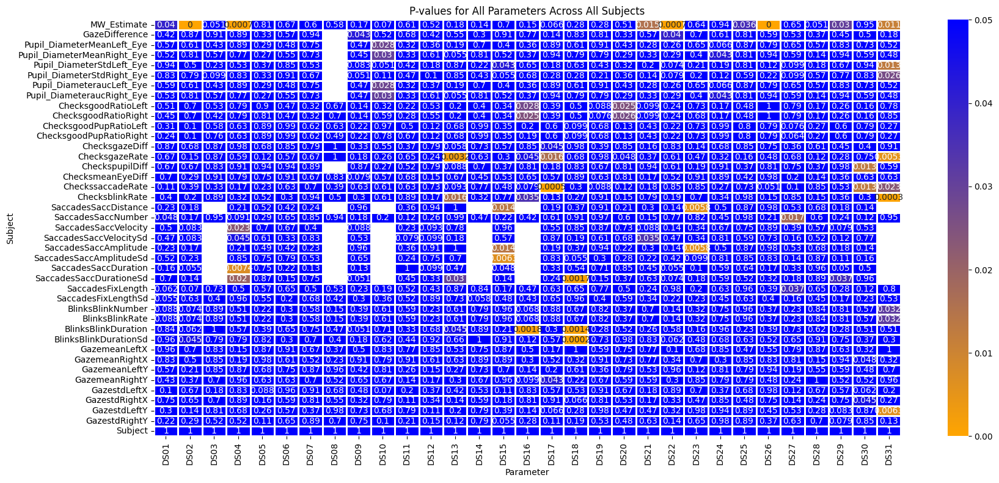

In [16]:
trackedDf = grand_df[grand_df['Tracking'] == 'TRACKED']
untrackedDf  = grand_df[grand_df['Tracking'] == 'UNTRACKED']

from scipy.stats import ranksums
import seaborn as sns
MWp    = []
MWstat = []


testDf = np.zeros([len(grand_df['DS'].unique()),len(grand_df.columns)])
clmnNames = []
for j,clmn in  enumerate(grand_df.columns):
    clmnNames.append(''.join(clmn))
    for i,subj in enumerate(grand_df['DS'].unique()):
        if type(subj) != str:
            continue
        currentracked    = trackedDf[trackedDf['DS'] == subj]
        currentUntracked = untrackedDf[untrackedDf['DS'] == subj]



        currResults = ranksums(currentracked[clmn].values, currentUntracked[clmn].values)
        testDf[i,j] = np.round(currResults.pvalue,4)


testingDF = pd.DataFrame(testDf,grand_df['DS'].unique(),clmnNames)
testingDF
import seaborn as sns
import matplotlib.pyplot as plt

# Drop non-numeric columns if present
drop_cols = ['Tracking', 'trialNum', 'DS', 'Pupil_DiameterdiffLeft_Eye', 'Pupil_DiameterdiffRight_Eye']
testingDF_numeric = testingDF.drop(columns=[col for col in drop_cols if col in testingDF.columns]).transpose()
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

# Create a custom colormap from orange to blue
custom_cmap = LinearSegmentedColormap.from_list(
    "orange_blue", ["orange", "blue"]
)

plt.figure(figsize=(18, 8))
sns.heatmap(
    testingDF_numeric, annot=True, cmap=custom_cmap, vmin=0, vmax=0.05, linewidths=1
)
plt.title('P-values for All Parameters Across All Subjects')
plt.xlabel('Parameter')
plt.ylabel('Subject')
plt.tight_layout()
plt.show()

In [17]:
grand_df

MW_Estimate GazeDifference Pupil_Diameter                                \
                                          Mean                 Std             
                                      Left_Eye Right_Eye  Left_Eye Right_Eye   
0           33.0      18.101889      -0.103120 -0.109114  0.047323  0.062290   
1           42.0      22.222548      -0.158326 -0.155978  0.075676  0.101594   
2           26.0      27.139951      -0.502426 -0.494871  0.050259  0.058449   
3           36.0      29.549453       0.115806  0.080705  0.054622  0.068420   
4           18.0      23.759388       0.236644  0.261647  0.043348  0.052436   
...          ...            ...            ...       ...       ...       ...   
1235        66.0      58.504876       0.182832  0.154193  0.011103  0.012642   
1236        32.0      47.530693       0.295220  0.235178  0.023395  0.020739   
1237        53.0      34.711861      -0.325025 -0.239333  0.016567  0.014852   
1238        42.0      64.811923       0.491732  0.469421  0.004788  0.004570   
1239        38.0      45.357810       0.150677  0.102697  0.009355  0.005881   

                                                  ...          Blinks  \
          diff                   auc              ...                   
      Left_Eye Right_Eye    Left_Eye   Right_Eye  ... BlinkDurationSd   
0    -0.014033 -0.033033 -127.457307 -121.984577  ...        0.000000   
1    -0.002367  0.064700 -196.102017 -174.828924  ...        4.109609   
2    -0.617938 -0.537224 -621.752195 -553.934958  ...       37.553162   
3     0.163267  0.126867  143.295039   90.335311  ...        7.000000   
4     0.868477  0.920932  292.851907  292.825225  ...        2.000000   
...        ...       ...         ...         ...  ...             ...   
1235  0.277055  0.226560  226.316560  172.695939  ...       25.000000   
1236 -0.252900 -0.219733  365.511032  263.403824  ...        0.000000   
1237 -0.110633 -0.108300 -402.090435 -267.828856  ...       25.350871   
1238  0.510733  0.347800  608.515815  525.473143  ...        0.000000   
1239  0.350633  0.281500  186.522909  115.028127  ...        0.000000   

           Gaze                                                         \
           mean                                         std              
          LeftX     RightX      LeftY     RightY      LeftX     RightX   
0     -5.180038   1.430879  13.640607  12.334918  21.956711  37.227858   
1      4.979870   3.231624  24.761804  16.123034  24.331118  31.999294   
2      2.827393   7.822771  26.770444  14.884055  26.600568  35.130628   
3      2.337945  13.273565  24.235699  11.049062  17.384414  39.034364   
4     11.875938   8.239643  32.495445  16.842053  23.441960  31.770694   
...         ...        ...        ...        ...        ...        ...   
1235  49.759927   5.789413   8.192781 -12.928598  86.163109  82.211977   
1236  59.669087  19.761543  17.059959  -3.551375  24.702066  33.964808   
1237  58.059869  19.867823   2.632861  -0.222344  61.589897  67.468466   
1238  55.260116   6.920000  18.380610  11.848947  14.567815  39.044223   
1239  61.005148  17.343731  15.864174   0.076092  26.828689  26.785697   

                             Subject  
                                      
          LeftY     RightY            
0     84.893609  65.579048  AGKO2706  
1     82.936829  61.908959  AGKO2706  
2     82.124156  55.709345  AGKO2706  
3     76.592304  64.854248  AGKO2706  
4     77.031041  52.057982  AGKO2706  
...         ...        ...       ...  
1235  85.399931  77.543223  ZURY1007  
1236  38.058904  30.402958  ZURY1007  
1237  83.464941  80.051645  ZURY1007  
1238  29.971249  34.259437  ZURY1007  
1239  24.010375  23.205997  ZURY1007  

[1240 rows x 46 columns]

## Data Exclusion and Modifier appication

Here We make a possibe Data Exclusion based on DS number and previous Occular Assessment: 
As well as apply any data transformation and modifiers such as removing NaN, Zscores



In [18]:
## -- Joice of DS -- ##
grand_df = grand_df[~grand_df['DS'].isin(excludeDs)]

## -- Joice of DS AND Trials --##
filtered_df = grand_df[~grand_df[['DS', 'trialNum']].apply(tuple, axis=1).isin(excludeDSTrial)]

## -- Z score of MW Estimate -- 
if est == 'zscore': 
    grand_df['MW_Estimate'] = grand_df.groupby('DS')['MW_Estimate'].transform(
        lambda x: (x - x.mean()) / x.std() ) # Transforms a DataFrame BY GROUP but returns the original Data Frame! 

## --- Only Part of Trials -- ##
if partial == 'second':
    grand_df  = grand_df[(grand_df[('trialNum', '', '')] > 20) & (grand_df[('trialNum', '', '')] <= 40)]
elif partial =='first':
    grand_df  = grand_df[(grand_df[('trialNum', '', '')] <= 20)]

#### Remove NaN values from grand_df + BUT ONLZ FROM oUR MAIN ANALysis coLUMNS
grand_df= grand_df[grand_df[['MW_Estimate',	'GazeDifference',	'Pupil_Diameter','Checks','Gaze']].isna().sum(axis=1)==0]

C:\Users\barak\AppData\Local\Temp\ipykernel_50840\1807516457.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grand_df['MW_Estimate'] = grand_df.groupby('DS')['MW_Estimate'].transform(


In [19]:
grand_df[grand_df['MW_Estimate'] >=  np.mean(grand_df['MW_Estimate'])].groupby('Tracking').count()

C:\Users\barak\AppData\Local\Temp\ipykernel_50840\3330726017.py:1: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  grand_df[grand_df['MW_Estimate'] >=  np.mean(grand_df['MW_Estimate'])].groupby('Tracking').count()


MW_Estimate GazeDifference Pupil_Diameter                     \
                                               Mean                Std   
                                           Left_Eye Right_Eye Left_Eye   
Tracking                                                                 
TRACKED           215            215            215       215      215   
UNTRACKED         308            308            308       308      308   

                                                           ...  \
                        diff                auc            ...   
          Right_Eye Left_Eye Right_Eye Left_Eye Right_Eye  ...   
Tracking                                                   ...   
TRACKED         215      215       215      215       215  ...   
UNTRACKED       308      308       308      308       308  ...   

                   Blinks  Gaze                                                \
                           mean                       std                       
          BlinkDurationSd LeftX RightX LeftY RightY LeftX RightX LeftY RightY   
Tracking                                                                        
TRACKED               215   215    215   215    215   215    215   215    215   
UNTRACKED             308   308    308   308    308   308    308   308    308   

          Subject  
                   
                   
Tracking           
TRACKED       215  
UNTRACKED     308  

[2 rows x 45 columns]

## Analyses

### (0) TEST the Pupil Dynamics::

Test whether on ANY timepoint differ in the Pupil Diameter between MW tracked and MW Untracked
This is to probe the idea of Evoked Pupil Diameter - Just at the end of the experiment


#### Compute All Evokede Pupil Diameter with controll for Trial number and DS:  

+ See how Tracking/Untracking are differing
+ See how Low and High Attentionality are differing 


#### (0.1) Pupil Dynamics with baseline of timepoint 0 

This aims at checking How the Pupil Diameter locked to a trial beginnign will evolve in time:

TO DO - Statistical Testing

In [20]:
# Join All Cut trials into One 

temp_df = grand_df[['DS','trialNum','Tracking','MW_Estimate']].copy()
temp_df.columns = temp_df.columns.get_level_values(0)
temp_df['MW_binarised'] = temp_df['MW_Estimate']>0
merged_all =[]

for i,tr in enumerate(trials):
    merged_all.append(temp_df.merge(pd.concat(trialsCut[i],ignore_index=False)))

    
merges = pd.concat(merged_all) # THis is ALL SINGLE DATAFRAME containing Cut and Baseline corrected TRIALS with MW_Estimate 
merges

,DS,trialNum,Tracking,MW_Estimate,MW_binarised,index,TimePoint,LeftX,LeftY,LeftPupil,RightX,RightY,RightPupil,gazeDiff,firstEnt,Ind
0,DS01,1,TRACKED,0.788517,True,65,130.0,989.4,511.6,-0.055292,954.7,497.1,-0.061289,662.341981,TRACKED,0
1,DS01,1,TRACKED,0.788517,True,70,140.0,991.2,514.7,-0.052681,955.9,501.9,-0.058597,658.841354,TRACKED,1
2,DS01,1,TRACKED,0.788517,True,75,150.0,994.3,516.9,-0.049316,958.9,502.7,-0.056674,661.085895,TRACKED,2
3,DS01,1,TRACKED,0.788517,True,80,160.0,993.8,513.4,-0.045682,958.9,502.6,-0.054627,663.134745,TRACKED,3
4,DS01,1,TRACKED,0.788517,True,85,170.0,990.5,514.3,-0.043394,959.3,500.1,-0.049804,662.206282,TRACKED,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115995,DS31,40,UNTRACKED,0.506240,True,983895,2000850.0,1009.1,537.8,NaN,976.3,520.3,NaN,656.664062,TRACKED,3995
115996,DS31,40,UNTRACKED,0.506240,True,983900,2000860.0,1008.3,541.0,NaN,977.9,522.1,NaN,653.660501,TRACKED,3996
115997,DS31,40,UNTRACKED,0.506240,True,983905,2000870.0,1006.6,540.9,NaN,976.2,521.5,NaN,651.773043,TRACKED,3997
115998,DS31,40,UNTRACKED,0.506240,True,983910,2000880.0,1008.7,539.6,NaN,976.1,523.4,NaN,652.723785,TRACKED,3998


In [21]:
mergesTrue = merges[merges['LeftPupil'].isna() == False]

In [22]:
temp_df = grand_df[['DS','trialNum','Tracking','MW_Estimate']].copy()
temp_df.columns = temp_df.columns.get_level_values(0)
temp_df['MW_binarised'] = temp_df['MW_Estimate']>0
merged_all =[]

for i,tr in enumerate(trials):
    #Quick Recut: removing trials with blinks or missing dat at the beginning (4 in total )
    currTrRec = []
    for tr in trials[i]:
        if not tr['LeftPupil'].isna().iloc[0]:
            currentTr = tr[0:1000]
            currentTr['TimePoint'] = range(0, 1000)
            currTrRec.append(currentTr)

    merged_all.append(temp_df.merge(pd.concat(currTrRec,ignore_index=False)))

    
merges_substr = pd.concat(merged_all) # THis is ALL SINGLE DATAFRAME containing Cut and Baseline corrected TRIALS with MW_Estimate 
merges_substr[['LeftPupil','RightPupil']] = merges_substr[['LeftPupil','RightPupil']] - merges_substr[['DS','trialNum','LeftPupil','RightPupil']].groupby(['DS','trialNum']).transform('first')

C:\Users\barak\AppData\Local\Temp\ipykernel_50840\1878927246.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentTr['TimePoint'] = range(0, 1000)
C:\Users\barak\AppData\Local\Temp\ipykernel_50840\1878927246.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentTr['TimePoint'] = range(0, 1000)
C:\Users\barak\AppData\Local\Temp\ipykernel_50840\1878927246.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = va

In [23]:
untrackedAggr = merges_substr[merges_substr.Tracking == 'UNTRACKED'][['LeftPupil','RightPupil','TimePoint']].groupby('TimePoint').agg(['mean','sem'])

trackedAggr = merges_substr[merges_substr.Tracking == 'TRACKED'][['LeftPupil','RightPupil','TimePoint']].groupby('TimePoint').agg(['mean','sem'])
focusAggr =merges_substr[merges_substr.MW_binarised][['LeftPupil','RightPupil','TimePoint']].groupby('TimePoint').agg(['mean','sem'])

mwAggr =merges_substr[merges_substr.MW_binarised == 0][['LeftPupil','RightPupil','TimePoint']].groupby('TimePoint').agg(['mean','sem'])

In [24]:
merges_substr

,DS,trialNum,Tracking,MW_Estimate,MW_binarised,index,TimePoint,LeftX,LeftY,LeftPupil,RightX,RightY,RightPupil,gazeDiff,firstEnt,Ind
0,DS01,1,TRACKED,0.788517,True,65,0,989.4,511.6,0.000000,954.7,497.1,0.000000,662.341981,TRACKED,0
1,DS01,1,TRACKED,0.788517,True,70,1,991.2,514.7,0.002611,955.9,501.9,0.002692,658.841354,TRACKED,1
2,DS01,1,TRACKED,0.788517,True,75,2,994.3,516.9,0.005976,958.9,502.7,0.004614,661.085895,TRACKED,2
3,DS01,1,TRACKED,0.788517,True,80,3,993.8,513.4,0.009610,958.9,502.6,0.006662,663.134745,TRACKED,3
4,DS01,1,TRACKED,0.788517,True,85,4,990.5,514.3,0.011898,959.3,500.1,0.011485,662.206282,TRACKED,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3995,DS29,40,TRACKED,-0.665709,False,965722,995,944.9,574.8,-0.195908,974.3,576.1,-0.181131,543.703678,UNTRACKED,995
3996,DS29,40,TRACKED,-0.665709,False,965727,996,943.6,575.4,-0.196716,973.4,575.7,-0.183392,541.991153,UNTRACKED,996
3997,DS29,40,TRACKED,-0.665709,False,965732,997,944.1,575.2,-0.196474,972.4,573.7,-0.184603,543.105883,UNTRACKED,997
3998,DS29,40,TRACKED,-0.665709,False,965737,998,945.5,578.5,-0.198331,972.8,572.8,-0.187833,542.565922,UNTRACKED,998


In [25]:
#### Threadding of Models:

import os, warnings, numpy as np
from concurrent.futures import ThreadPoolExecutor, as_completed
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter("ignore", ConvergenceWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
os.environ.setdefault("OMP_NUM_THREADS", "1")
os.environ.setdefault("MKL_NUM_THREADS", "1")
delimet = 10000
# 1) Build the iteration list from UNIQUE Inds, then decimate to every 5th
all_inds = np.sort(merges_substr['TimePoint'].dropna().unique())
indices_to_fit = [int(i) for i in all_inds if (i % 5 == 0) and (0 <= i < delimet)]

print(f"Unique Inds total: {len(all_inds)}")
print(f"Sampling every 5th Ind in [0,{delimet}) → {len(indices_to_fit)} iters (expected ≈ {delimet//5})")

merges_dec = merges_substr[merges_substr["TimePoint"] % 5 == 0].copy()


def _one_fit(i):
    try:
        import statsmodels.formula.api as smf
        cur = merges_dec.loc[merges_dec['TimePoint'] == i]
        cur = cur[cur['LeftPupil'].notna()]
        if cur.empty:
            return i, np.nan, np.nan
        m1 = smf.mixedlm("LeftPupil ~ Tracking", data=cur, groups="DS").fit(method="lbfgs", disp=0)
        m2 = smf.mixedlm("LeftPupil ~ MW_binarised ", data=cur, groups="DS").fit(method="lbfgs", disp=0)

        return i, m1.pvalues.get('Tracking[T.UNTRACKED]', np.nan), m1.tvalues.get('Tracking[T.UNTRACKED]', np.nan),m1.bse_fe['Tracking[T.UNTRACKED]'],m2.pvalues.get('MW_binarised[T.True]', np.nan), m2.tvalues.get('MW_binarised[T.True]', np.nan),m2.bse_fe['MW_binarised[T.True]']
    except Exception as e:
        print(f"ERROR at i={i}: {e}")
        return i, np.nan, np.nan
    


# 4) Parallel run (threads avoid BrokenProcessPool)
pvalsTR = {i: np.nan for i in indices_to_fit}
tstatTR = {i: np.nan for i in indices_to_fit}
stdErrrsTR = {i: np.nan for i in indices_to_fit}

pvalsMW = {i: np.nan for i in indices_to_fit}
tstatMW = {i: np.nan for i in indices_to_fit}
stdErrrsMW = {i: np.nan for i in indices_to_fit}
with ThreadPoolExecutor(max_workers=os.cpu_count()) as ex:
    futures = {ex.submit(_one_fit, i): i for i in indices_to_fit}
    total = len(futures)
    for done_count, fut in enumerate(as_completed(futures), 1):
        i, pv, tv,stEr,pv2,tv2,stEr2 = fut.result()
        pvalsTR[i] = pv
        tstatTR[i] = tv
        stdErrrsTR[i] = stEr
        pvalsMW[i] = pv2
        tstatMW[i] = tv2
        stdErrrsMW[i] = stEr2
        #print(f"Finished i={i} ({done_count}/{total})")



Unique Inds total: 1000
Sampling every 5th Ind in [0,10000) → 200 iters (expected ≈ 2000)


In [26]:
pvalsTR

{0: nan,
 5: 0.6892710382526991,
 10: 0.6982366507195751,
 15: 0.6169340554221037,
 20: 0.5752277492293154,
 25: 0.6315523118985744,
 30: 0.7480351305936145,
 35: 0.8121403425087231,
 40: 0.8981661305371564,
 45: 0.9516282189746541,
 50: 0.8702169245356379,
 55: 0.9491716239871681,
 60: 0.9413919630464762,
 65: 0.9480382653442142,
 70: 0.576714788172874,
 75: 0.5544362271612968,
 80: 0.5239101858281455,
 85: 0.5362600703602245,
 90: 0.5693332512179033,
 95: 0.6320031801914745,
 100: 0.6986643216496029,
 105: 0.7092835961352424,
 110: 0.6365547829445377,
 115: 0.5341918287129547,
 120: 0.4479883385341644,
 125: 0.3726750670672838,
 130: 0.3326329261349019,
 135: 0.3248728544237558,
 140: 0.3169944678218929,
 145: 0.2843397251742831,
 150: 0.23700558759811718,
 155: 0.17821619416573875,
 160: 0.12833061035058776,
 165: 0.10482573487054225,
 170: 0.09843627318854807,
 175: 0.10052642043874713,
 180: 0.11564389321444056,
 185: 0.16219413488238033,
 190: 0.2425282201660418,
 195: 0.32854266

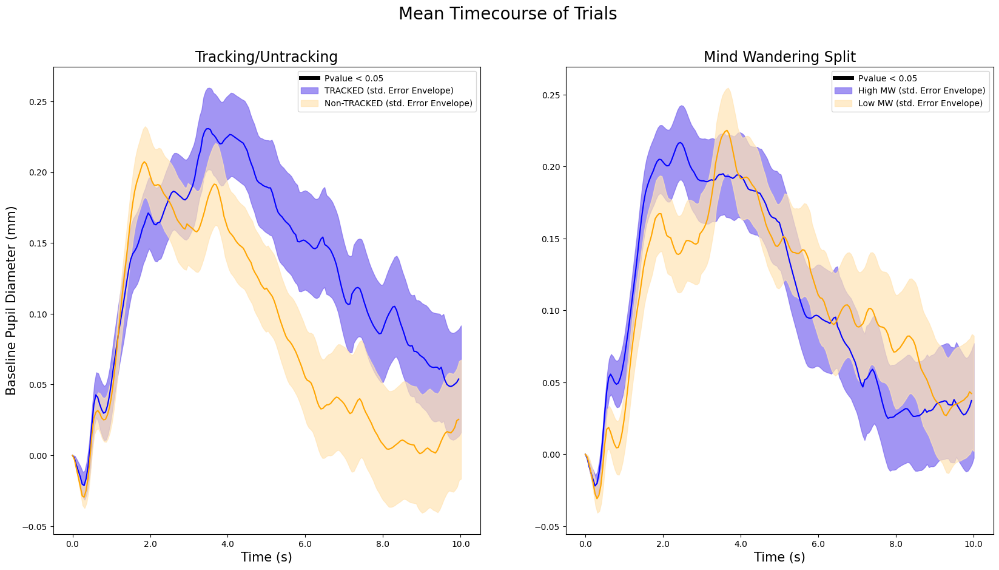

In [27]:
from statsmodels.stats.multitest import multipletests

fig,ax = plt.subplots(1,2,figsize=(20,10))
delimet = 10000



pvalsTr = np.array(multipletests(list(pvalsTR.values())[1:], method='fdr_bh')[1]) # Already Corrected for Multiple Comparisons
pvalsTr[pvalsTr>0.05] = np.nan
pvalsTr[pvalsTr<=0.05] = 1

pvalsMw = np.array(multipletests(list(pvalsMW.values())[1:], method='fdr_bh')[1])
pvalsMw[pvalsMw>0.05] = np.nan
pvalsMw[pvalsMw<=0.05] = 1


fig.suptitle("Mean Timecourse of Trials",fontsize=20)
maxPos = np.max(pd.concat((trackedAggr['LeftPupil']['mean'] ,untrackedAggr['LeftPupil']['mean'])));
ax[0].plot(list(pvalsMW.keys())[1:],(maxPos+ 0.2*abs(maxPos))*pvalsTr,'k',label='Pvalue < 0.05', linewidth=5)

ax[0].set_title("Tracking/Untracking",fontsize=17)
ax[0].plot(trackedAggr['LeftPupil']['mean'].iloc[::5],color='blue')
ax[0].plot(untrackedAggr['LeftPupil']['mean'].iloc[::5],color='orange' )

ax[0].fill_between(np.linspace(1,int(delimet/10)+1,int(delimet/50)), 
                    trackedAggr['LeftPupil']['mean'].iloc[::5] -  trackedAggr['LeftPupil']['sem'].iloc[::5] , 
                    trackedAggr['LeftPupil']['mean'].iloc[::5]  +  trackedAggr['LeftPupil']['sem'].iloc[::5] , 
                    color='mediumslateblue', alpha=0.7, label='TRACKED (std. Error Envelope)') # make an STD Shade 


ax[0].fill_between(np.linspace(1,int(delimet/10)+1,int(delimet/50)), 
                    untrackedAggr['LeftPupil']['mean'].iloc[::5]  -  untrackedAggr['LeftPupil']['sem'].iloc[::5] , 
                    untrackedAggr['LeftPupil']['mean'].iloc[::5]   +  untrackedAggr['LeftPupil']['sem'].iloc[::5] , 
                    color='moccasin', alpha=0.7, label='Non-TRACKED (std. Error Envelope)') # make an STD Shade 

ax[0].legend()
ax[0].set_xticklabels(ax[0].get_xticks()/100) 
ax[0].set_xlabel("Time (s)",fontsize=15)
ax[0].set_ylabel("Baseline Pupil Diameter (mm)",fontsize=15)

maxPos = np.max(pd.concat((focusAggr['LeftPupil']['mean'] ,mwAggr['LeftPupil']['mean'])));
ax[1].plot(list(pvalsMW.keys())[1:],(maxPos+ 0.2*abs(maxPos))*pvalsMw,'k',label='Pvalue < 0.05', linewidth=5)

ax[1].set_title("Mind Wandering Split",fontsize=17)
ax[1].plot(mwAggr['LeftPupil']['mean'].iloc[::5],color='blue' )
ax[1].plot(focusAggr['LeftPupil']['mean'].iloc[::5],color='orange' )

ax[1].fill_between(np.linspace(1,int(delimet/10)+1,int(delimet/50)), 
                    mwAggr['LeftPupil']['mean'].iloc[::5]   -  mwAggr['LeftPupil']['sem'].iloc[::5], 
                    mwAggr['LeftPupil']['mean'].iloc[::5]   +  mwAggr['LeftPupil']['sem'].iloc[::5] , 
                    color='mediumslateblue', alpha=0.7, label='High MW (std. Error Envelope)') # make an STD Shade 
ax[1].fill_between(np.linspace(1,int(delimet/10)+1,int(delimet/50)), 
                    focusAggr['LeftPupil']['mean'].iloc[::5]   -  focusAggr['LeftPupil']['sem'].iloc[::5], 
                    focusAggr['LeftPupil']['mean'].iloc[::5]   +  focusAggr['LeftPupil']['sem'].iloc[::5] , 
                    color='moccasin', alpha=0.7, label='Low MW (std. Error Envelope)') # make an STD Shade 
ax[1].set_xticklabels(ax[0].get_xticks()/100) 
ax[1].set_xlabel("Time (s)",fontsize=15)
ax[1].legend()
plt.savefig(os.path.join(statPath,f"MeanPupilEnvelope_FirstTimeBase.png"))



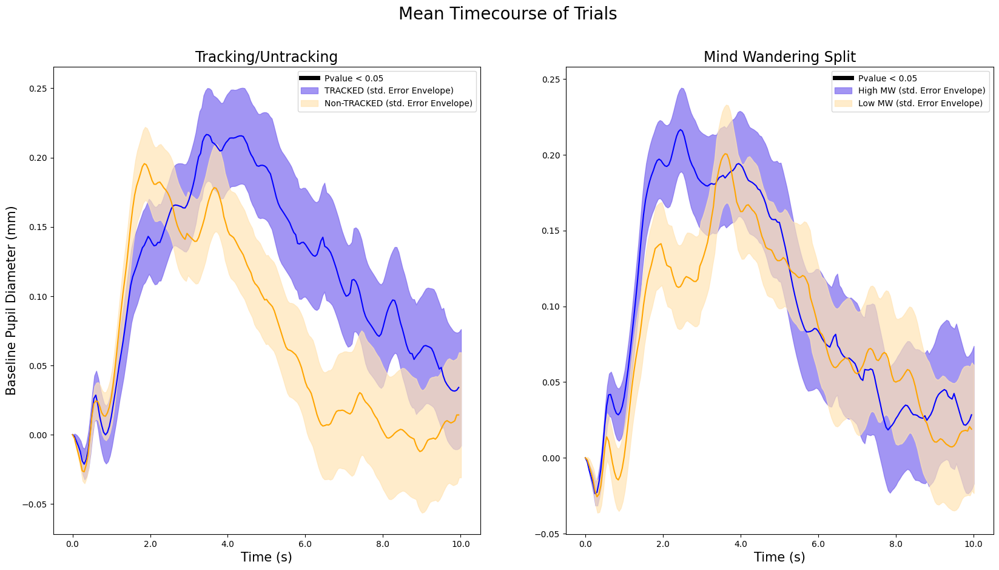

In [28]:
import os, warnings, numpy as np
from concurrent.futures import ThreadPoolExecutor, as_completed
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter("ignore", ConvergenceWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
os.environ.setdefault("OMP_NUM_THREADS", "1")
os.environ.setdefault("MKL_NUM_THREADS", "1")
delimet = 40000
# 1) Build the iteration list from UNIQUE Inds, then decimate to every 5th
all_inds = np.sort(mergesTrue['Ind'].dropna().unique())
indices_to_fit = [int(i) for i in all_inds if (i % 5 == 0) and (0 <= i < delimet)]

print(f"Unique Inds total: {len(all_inds)}")
print(f"Sampling every 5th Ind in [0,{delimet}) → {len(indices_to_fit)} iters (expected ≈ {delimet//5})")

# 2) Work on a decimated table for speed (keeps only rows with Ind multiple of 5)
merges_dec = mergesTrue[mergesTrue["Ind"] % 5 == 0].copy()

# 3) Worker (uses merges_dec; one fit per unique Ind)
def _one_fit(i):
    try:
        import statsmodels.formula.api as smf
        cur = merges_dec.loc[merges_dec['Ind'] == i]
        cur = cur[cur['LeftPupil'].notna()]
        if cur.empty:
            return i, np.nan, np.nan
        m1 = smf.mixedlm("LeftPupil ~ Tracking + trialNum", data=cur, groups="DS").fit(method="lbfgs", disp=0)
        m2 = smf.mixedlm("LeftPupil ~ MW_binarised + trialNum", data=cur, groups="DS").fit(method="lbfgs", disp=0)

        return i, m1.pvalues.get('Tracking[T.UNTRACKED]', np.nan), m1.tvalues.get('Tracking[T.UNTRACKED]', np.nan),m1.bse_fe['Tracking[T.UNTRACKED]'],m2.pvalues.get('MW_binarised[T.True]', np.nan), m2.tvalues.get('MW_binarised[T.True]', np.nan),m2.bse_fe['MW_binarised[T.True]']
    except Exception as e:
        print(f"ERROR at i={i}: {e}")
        return i, np.nan, np.nan

# 4) Parallel run (threads avoid BrokenProcessPool)
pvalsTR = {i: np.nan for i in indices_to_fit}
tstatTR = {i: np.nan for i in indices_to_fit}
stdErrrsTR = {i: np.nan for i in indices_to_fit}

pvalsMW = {i: np.nan for i in indices_to_fit}
tstatMW = {i: np.nan for i in indices_to_fit}
stdErrrsMW = {i: np.nan for i in indices_to_fit}
with ThreadPoolExecutor(max_workers=os.cpu_count()) as ex:
    futures = {ex.submit(_one_fit, i): i for i in indices_to_fit}
    total = len(futures)
    for done_count, fut in enumerate(as_completed(futures), 1):
        i, pv, tv,stEr,pv2,tv2,stEr2 = fut.result()
        pvalsTR[i] = pv
        tstatTR[i] = tv
        stdErrrsTR[i] = stEr
        pvalsMW[i] = pv2
        tstatMW[i] = tv2
        stdErrrsMW[i] = stEr2
        #print(f"Finished i={i} ({done_count}/{total})")



Unique Inds total: 4000
Sampling every 5th Ind in [0,40000) → 800 iters (expected ≈ 8000)


In [29]:
trackedMean = merges[['Tracking','Ind','LeftPupil']].groupby(['Tracking','Ind']).agg(['mean','std','count']).loc['TRACKED']
untrackedMean = merges[['Tracking','Ind','LeftPupil']].groupby(['Tracking','Ind']).agg(['mean','std','count']).loc['UNTRACKED']
mwestimMean = merges[['MW_binarised','Ind','LeftPupil']].groupby(['MW_binarised','Ind']).agg(['mean','std','count']).loc[True]
mwestimLowMean = merges[['MW_binarised','Ind','LeftPupil']].groupby(['MW_binarised','Ind']).agg(['mean','std','count']).loc[False]


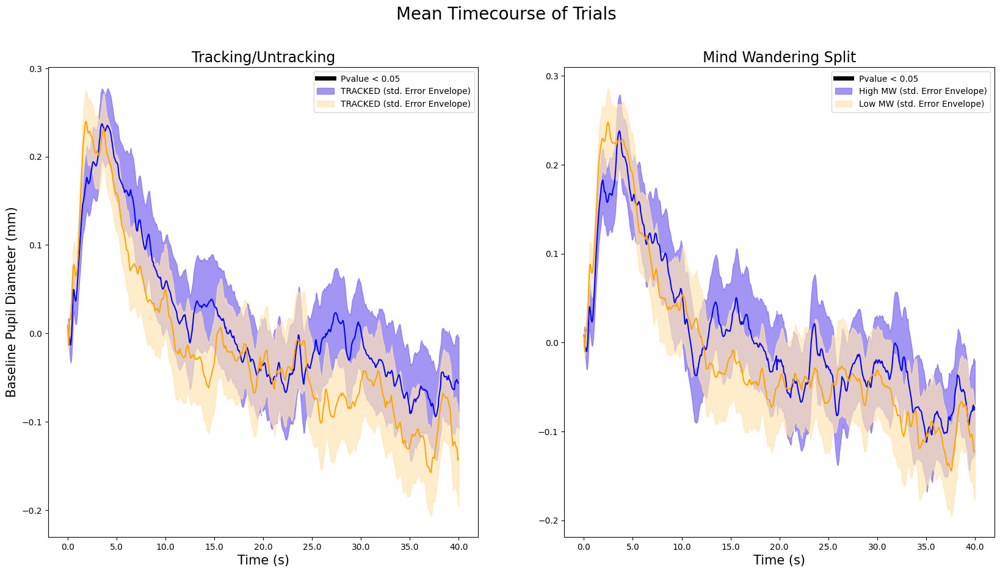

In [30]:
from statsmodels.stats.multitest import multipletests

fig,ax = plt.subplots(1,2,figsize=(20,10))

pvals_corrected = multipletests(list(pvalsMW.values()), method='fdr_bh')[1]

pvalsTr = np.array(multipletests(list(pvalsTR.values()), method='fdr_bh')[1]) # Already Corrected for Multiple Comparisons
pvalsTr[pvalsTr>0.05] = np.nan
pvalsTr[pvalsTr<=0.05] = 1

pvalsMw = np.array(multipletests(list(pvalsMW.values()), method='fdr_bh')[1])
pvalsMw[pvalsMw>0.05] = np.nan
pvalsMw[pvalsMw<=0.05] = 1
fig.suptitle("Mean Timecourse of Trials",fontsize=20)
maxPos = np.max(pd.concat((trackedMean['LeftPupil']['mean'] ,untrackedMean['LeftPupil']['mean'])));
ax[0].plot(list(pvalsMW.keys()),(maxPos+ 0.2*abs(maxPos))*pvalsTr,'k',label='Pvalue < 0.05', linewidth=5)
ax[0].set_title("Tracking/Untracking",fontsize=17)
ax[0].plot(trackedMean['LeftPupil']['mean'].iloc[::5],color='blue')
ax[0].plot(untrackedMean['LeftPupil']['mean'].iloc[::5],color='orange' )

ax[0].fill_between(np.linspace(1,int(delimet/10),int(delimet/50)), 
                    trackedMean['LeftPupil']['mean'].iloc[::5] - list(stdErrrsTR.values()) , 
                    trackedMean['LeftPupil']['mean'].iloc[::5]  +   list(stdErrrsTR.values()) , 
                    color='mediumslateblue', alpha=0.7, label='TRACKED (std. Error Envelope)') # make an STD Shade 

ax[0].fill_between(np.linspace(1,int(delimet/10),int(delimet/50)), 
                    untrackedMean['LeftPupil']['mean'].iloc[::5]  - list(stdErrrsTR.values()) , 
                    untrackedMean['LeftPupil']['mean'].iloc[::5]  +  list(stdErrrsTR.values()), 
                    color='moccasin', alpha=0.7, label='TRACKED (std. Error Envelope)') # make an STD Shade 

ax[0].legend()
ax[0].set_xticklabels(ax[0].get_xticks()/100) 
ax[0].set_xlabel("Time (s)",fontsize=15)
ax[0].set_ylabel("Baseline Pupil Diameter (mm)",fontsize=15)

maxPos = np.max(pd.concat((mwestimMean['LeftPupil']['mean'] ,mwestimLowMean['LeftPupil']['mean'])));
ax[1].plot(list(pvalsMW.keys()),(maxPos+ 0.2*abs(maxPos))*pvalsMw,'k',label='Pvalue < 0.05', linewidth=5)
ax[1].set_title("Mind Wandering Split",fontsize=17)
ax[1].plot(mwestimMean['LeftPupil']['mean'].iloc[::5],color='blue' )
ax[1].plot(mwestimLowMean['LeftPupil']['mean'].iloc[::5],color='orange' )

ax[1].fill_between(np.linspace(1,int(delimet/10),int(delimet/50)), 
                    mwestimMean['LeftPupil']['mean'].iloc[::5]   -   list(stdErrrsMW.values()) , 
                    mwestimMean['LeftPupil']['mean'].iloc[::5]   +   list(stdErrrsMW.values())  , 
                    color='mediumslateblue', alpha=0.7, label='High MW (std. Error Envelope)') # make an STD Shade 
ax[1].fill_between(np.linspace(1,int(delimet/10),int(delimet/50)), 
                    mwestimLowMean['LeftPupil']['mean'].iloc[::5]   -   list(stdErrrsMW.values()) , 
                    mwestimLowMean['LeftPupil']['mean'].iloc[::5]   +  list(stdErrrsMW.values()) , 
                    color='moccasin', alpha=0.7, label='Low MW (std. Error Envelope)') # make an STD Shade 
ax[1].set_xticklabels(ax[0].get_xticks()/100) 
ax[1].set_xlabel("Time (s)",fontsize=15)
ax[1].legend()
plt.savefig(os.path.join(statPath,f"MeanPupilEnvelope.png"))



#### OLD 

In [31]:
# from analysisFunctions import meanPupilShade, getPupilDiamLast

# from scipy.stats import wilcoxon
# from statsmodels.stats.multitest import multipletests
# import matplotlib.pyplot as plt
# from matplotlib.backends.backend_pdf import PdfPages


# output_dir = os.path.join(workingDir,ExpName, currentANalysisName, "individuals")
# pdf_path = os.path.join(output_dir, "plotShade.pdf")
# pdfs_shade = PdfPages(pdf_path)

# dfs = []
# target_depth = 3

# last10sDF1_all       = []
# last10sDF2_all       = []

# for i, ds in enumerate(allData):

#     karolinaLast10s,janekLast10s,_ = getPupilDiamLast(ds)

#     for j in range(len(karolinaLast10s)):
#         karolinaLast10s[j]['LeftPupil'] = karolinaLast10s[j]['LeftPupil'] - np.nanmean(janekLast10s[j]['LeftPupil'] )  # Center Janek's data around its mean
#         janekLast10s[j]['LeftPupil'] = janekLast10s[j]['LeftPupil']  - np.nanmean(janekLast10s[j]['LeftPupil'] )  # Center Janek's data around its mean
#         karolinaLast10s[j]['RightPupil'] = karolinaLast10s[j]['RightPupil'] - np.nanmean(janekLast10s[j]['RightPupil'] )  # Center Janek's data around its mean
#         janekLast10s[j]['RightPupil'] = janekLast10s[j]['RightPupil']  - np.nanmean(janekLast10s[j]['RightPupil'] )  # Center Janek's data around its mean

#     last10sDF1_all += karolinaLast10s
#     last10sDF2_all += janekLast10s

#     # Save a different plot for each subject
#     fig1 = meanPupilShade(karolinaLast10s, janekLast10s, ds=f"DS{i+1}",pvals = [], mltpl = 1)
#     pdfs_shade.savefig(fig1)
#     plt.close(fig1)

# pdfs_shade.close()

### Compute difference for every timepoint

We are using linear mixed effects for every timepoint across our subject x trials, while controlling for both

Plotting std Shade for that

In [32]:
# nsamp = 1000
# sf =100

# fig,axs = plt.subplots(1,2,figsize=(14,7))

# for i,ey in enumerate(['LeftPupil','RightPupil']):
#     pvalse =  [p['Tracking[T.UNTRACKED]'] for p in pvalsFit[ey] if 'Tracking[T.UNTRACKED]' in p]
  
#     reject, p_fdr, _, _ = multipletests(pvalse, alpha=0.05, method="fdr_bh") #Benjamini-Hochberg procedure for multiple comparison 
    
        
#     axs[i].plot(np.linspace(1,nsamp/sf,nsamp+1),meanTracked[ey],label='',color='blue')
#     axs[i].fill_between(np.linspace(1,nsamp/sf,nsamp+1), 
#                     meanTracked[ey] - stdTracked[ey], 
#                     meanTracked[ey]+ stdTracked[ey], 
#                     color='mediumslateblue', alpha=0.7, label='TRACKED (STD Envelope)') # make an STD Shade 

#     axs[i].plot(np.linspace(1,nsamp/sf,nsamp+1),meanUntracked[ey],color='orange')
#     axs[i].fill_between(np.linspace(1,nsamp/sf,nsamp+1), 
#                     meanUntracked[ey] - stdUntracked[ey], 
#                     meanUntracked[ey]+ stdUntracked[ey], 
#                     color='moccasin', alpha=0.7, label='UNTRACKED (STD Envelope)') # makeand STD shade 
#     axs[i].set_title(ey)
#     mask = np.array(p_fdr) < 0.05
#     mask_nan = np.where(mask, True, np.nan)  # True stays True, False becomes np.nan

#     axs[i].scatter(np.linspace(1, nsamp/sf, nsamp+1), mask_nan+6000)    
#     axs[i].set_xlabel('Time (s)')
#     axs[i].set_ylabel('Pupil size (Au)')
        

## (1) GENERAL: Test Is Tracked Entity Different from Untracked Entity?

### (1.1) Test Whether Pupil Diameter Differs between Tracked and Untracked Entity: 

We controll immediatley for SUBJECTS

so Making Basic Models:

        MW_estimate ~ Tracking +trialNum + (1|Subjects)


Additionally we plot the Envelope of STD from subjects as well as provide the Mean differs across subjects of MW Both in TIme as in Absolute:

Important here to check:
+ Whether there is a difference between Tracked and Untracked Entity
+ Whether there is an Effect of Trial Number (As MW Rate should increase in time)

             Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   MW_Estimate
No. Observations:    1158      Method:               REML       
No. Groups:          29        Scale:                0.9148     
Min. group size:     38        Log-Likelihood:       -1599.7989 
Max. group size:     40        Converged:            No         
Mean group size:     39.9                                       
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept             -0.482    0.064 -7.551 0.000 -0.607 -0.357
Tracking[T.UNTRACKED]  0.351    0.056  6.245 0.000  0.241  0.461
trialNum               0.015    0.002  6.080 0.000  0.010  0.020
DS Var                 0.000                                    



c:\Users\barak\Documents\GitHub\startegicMW_lite\Experiment\analysis\analysisFunctions.py:1964: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  ax.scatter(grTr.mean().loc[firstContrast].index,grTr.mean().loc[firstContrast],label="Subj Mean Tracked",color = 'blue')


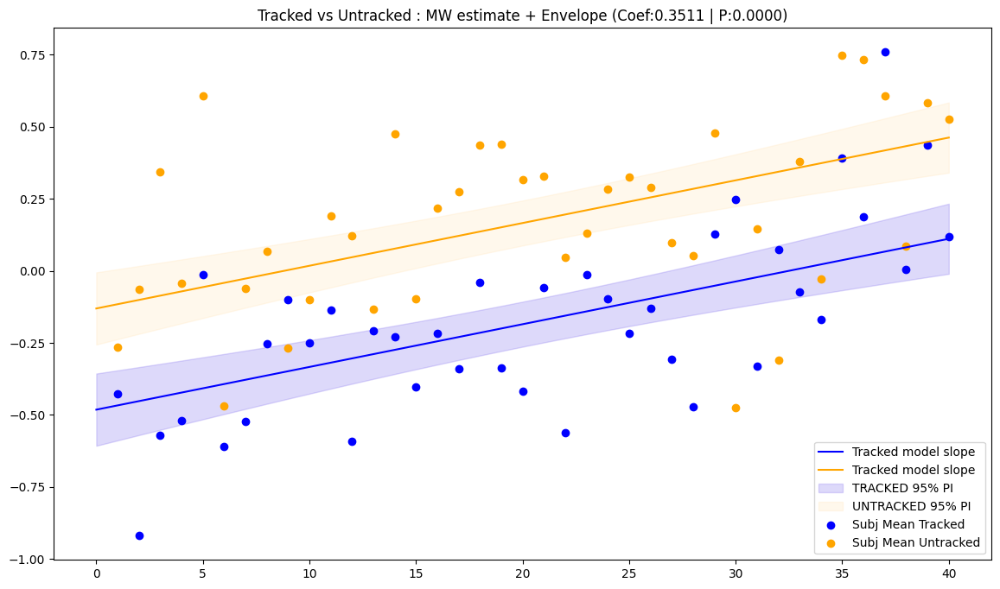

In [33]:

### Get the parameters of a linear model: 
import matplotlib.pyplot as plt

from analysisFunctions import plotTrialTrack

### Model Checks: 
import statsmodels.api  as sm

import statsmodels.formula.api as smf

m = smf.mixedlm("MW_Estimate ~ Tracking+trialNum ", data=grand_df[['DS','trialNum','Tracking','MW_Estimate']],
                groups="DS",          # random intercept
                #re_formula="~Tracking",         # adds random slope

               ).fit()
print(m.summary())   
coefs.append(m.params[m.params.keys()[1]])
zvals.append(m.tvalues[m.params.keys()[1]])
pvals.append(m.pvalues[m.params.keys()[1]])
conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

coefsT.append(m.params[m.params.keys()[2]])
zvalsT.append(m.tvalues[m.params.keys()[2]])
pvalsT.append(m.pvalues[m.params.keys()[2]])
conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])

indx.append("MW Estimate")
eye.append('')
analysis.append('')

log_file.write("\n===# (1) Uncorrected Samples #=== \n\n")
log_file.write("(1.1) Uncorrected Samples (MW ~ Tracking +TrialNum +(1|Subjects)) \n")

log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")


fig, ax = plt.subplots(figsize=(14, 8))
plotTrialTrack(m,'MW_Estimate',grand_df,ax,titl=f"Tracked vs Untracked : MW estimate + Envelope (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})" )
plt.savefig(os.path.join(statPath,f"MWvsUntracked_Unc_{est}_{exclusionName}.png"))



#### Checks

**Chek the assumptions of linear models**
+ Homoscedasticity
+ Normality of residuals
+ vfs

In [34]:
from analysisFunctions import linearModelChecks
### Checks the assumptioons of a linear model 
linearModelChecks(m,grand_df)
plt.savefig(os.path.join(statPath,f"MWvsUntracked_Unc_Checks_{est}_{exclusionName}.png"))

TypeError: linearModelChecks() missing 1 required positional argument: 'formula'

**Check the Mean of  MW estimated for every Particiapnt**

The purpose is to plot whether by means alone we cane see the relationship

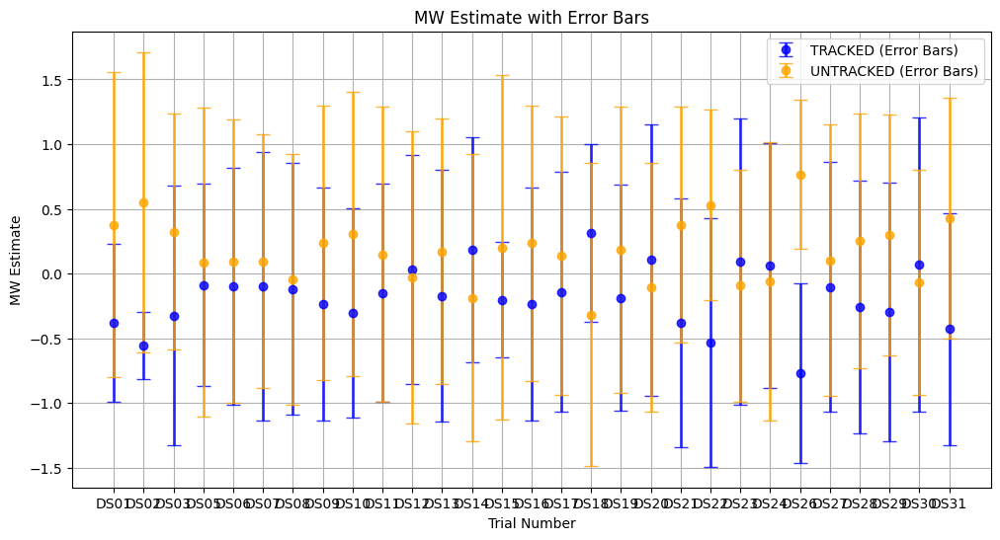

In [ ]:
mew = grand_df[grand_df['Tracking'] == 'TRACKED'][['DS','MW_Estimate']].groupby(['DS'])
umew = grand_df[grand_df['Tracking'] == 'UNTRACKED'][['DS','MW_Estimate']].groupby(['DS'])


plt.figure(figsize=(12, 6))

# Plot for TRACKED group
plt.errorbar(mew.mean().index, 
             mew.mean()['MW_Estimate'].values, 
             yerr=mew.std()['MW_Estimate'].values, 
             fmt='o', color='blue', label='TRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Plot for UNTRACKED group
plt.errorbar(umew.mean().index, 
             umew.mean()['MW_Estimate'].values, 
             yerr=umew.std()['MW_Estimate'].values, 
             fmt='o', color='orange', label='UNTRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Add labels, legend, and title
plt.xlabel('Trial Number')
plt.ylabel('MW Estimate')
plt.title('MW Estimate with Error Bars')
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig(os.path.join(statPath,f"MWacrossSubj_Unc_{est}_{exclusionName}.png"))


### (1.2) Test Whether Pupil Diameter Differs between Tracked and Untracked Entity: 

We controll immediatley for SUBJECTS

so Making Basic Models:

        Pupil ~ Tracking +trialNum + (1|Subjects)

Each Pupil Measurment is a tad bit different: We are using:
+ Pupil Std
+ Pupil Mean Diameter
+ Pupil Differentiate Series

In [ ]:
grand_df['Pupil_Diameter']

Mean                 Std                diff                   auc  \
      Left_Eye Right_Eye  Left_Eye Right_Eye  Left_Eye Right_Eye    Left_Eye   
0    -0.103120 -0.109114  0.047323  0.062290 -0.014033 -0.033033 -127.457307   
1    -0.158326 -0.155978  0.075676  0.101594 -0.002367  0.064700 -196.102017   
2    -0.502426 -0.494871  0.050259  0.058449 -0.617938 -0.537224 -621.752195   
3     0.115806  0.080705  0.054622  0.068420  0.163267  0.126867  143.295039   
4     0.236644  0.261647  0.043348  0.052436  0.868477  0.920932  292.851907   
...        ...       ...       ...       ...       ...       ...         ...   
1235  0.182832  0.154193  0.011103  0.012642  0.277055  0.226560  226.316560   
1236  0.295220  0.235178  0.023395  0.020739 -0.252900 -0.219733  365.511032   
1237 -0.325025 -0.239333  0.016567  0.014852 -0.110633 -0.108300 -402.090435   
1238  0.491732  0.469421  0.004788  0.004570  0.510733  0.347800  608.515815   
1239  0.150677  0.102697  0.009355  0.005881  0.350633  0.281500  186.522909   

                  
       Right_Eye  
0    -121.984577  
1    -174.828924  
2    -553.934958  
3      90.335311  
4     292.825225  
...          ...  
1235  172.695939  
1236  263.403824  
1237 -267.828856  
1238  525.473143  
1239  115.028127  

[1158 rows x 8 columns]



======== Test for Pupil Diameter Mean // Left_Eye =======

             Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    Pupil   
No. Observations:     1150       Method:                REML    
No. Groups:           29         Scale:                 0.0624  
Min. group size:      37         Log-Likelihood:        -53.8589
Max. group size:      40         Converged:             Yes     
Mean group size:      39.7                                      
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept             -0.044    0.017 -2.524 0.012 -0.078 -0.010
Tracking[T.UNTRACKED] -0.002    0.015 -0.146 0.884 -0.031  0.027
trialNum               0.001    0.001  0.901 0.367 -0.001  0.002
DS Var                 0.001    0.003                           



======== Test for Pupil Diameter Mean //

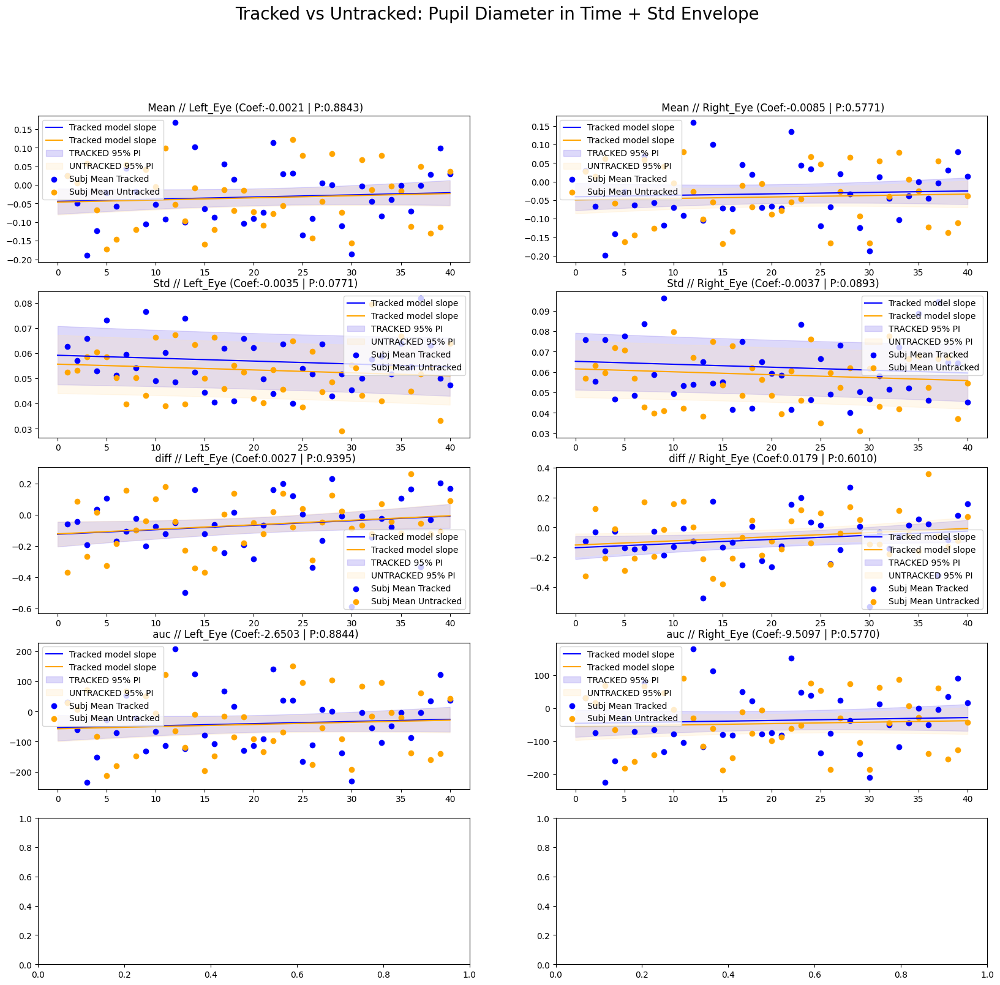

In [ ]:
import statsmodels.formula.api as smf
models = []

fig, axes = plt.subplots(5,2,figsize=(20,18))
fig.suptitle("Tracked vs Untracked: Pupil Diameter in Time + Std Envelope",fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
log_file.write("\n(1.2) Pupil Diameter vs Tracking (Pupil ~ Tracking +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Pupil_Diameter'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Pupil Diameter {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Pupil_Diameter'][ind[0]][ind[1]], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking']]).T
    currentDf.columns = ['Pupil', 'DS', 'trialNum', 'Tracking']
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    
    
    # Clean the data
    currentDf = currentDf.dropna(subset=['Pupil', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Pupil'] = pd.to_numeric(currentDf['Pupil'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Pupil'] - currentDf['Pupil'].mean() <3*currentDf['Pupil'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Pupil ~ Tracking +trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    print(m.summary())  # ≈ summary(lm(...)) in R

    
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")
    
    coefs.append(m.params[m.params.keys()[1]])
    zvals.append(m.tvalues[m.params.keys()[1]])
    pvals.append(m.pvalues[m.params.keys()[1]])
    conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

    coefsT.append(m.params[m.params.keys()[2]])
    zvalsT.append(m.tvalues[m.params.keys()[2]])
    pvalsT.append(m.pvalues[m.params.keys()[2]])
    conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])
    indx.append("Pupil Diam")
    eye.append(ind[0])
    analysis.append(ind[1])

    plotTrialTrack(m,"Pupil",currentDf,axes[i],titl=f" {ind[0]} // {ind[1]} (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})")

plt.savefig(os.path.join(statPath,f"PupilvsTracking_Unc_{est}_{exclusionName}.png"))


#### (1.3) Test Whether Pupil Diameter and MW Estimates ARE Tracking Each other 

We controll immediatley for SUBJECTS

so Making Basic Models:

        Pupil ~ MW_Estimate +trialNum + (1|Subjects)




======== Test MW vs Pupil Diameter Mean // Left_Eye =======

        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Pupil   
No. Observations: 1150    Method:             REML    
No. Groups:       29      Scale:              0.0623  
Min. group size:  37      Log-Likelihood:     -48.1735
Max. group size:  40      Converged:          Yes     
Mean group size:  39.7                                
------------------------------------------------------
            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   -0.033    0.009 -3.738 0.000 -0.051 -0.016
MW_Estimate  0.006    0.007  0.834 0.404 -0.008  0.021
DS Var       0.001    0.003                           



======== Test MW vs Pupil Diameter Mean // Right_Eye =======

        Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Pupil   
No. Observations: 1148    Method:             REML    
No. Groups

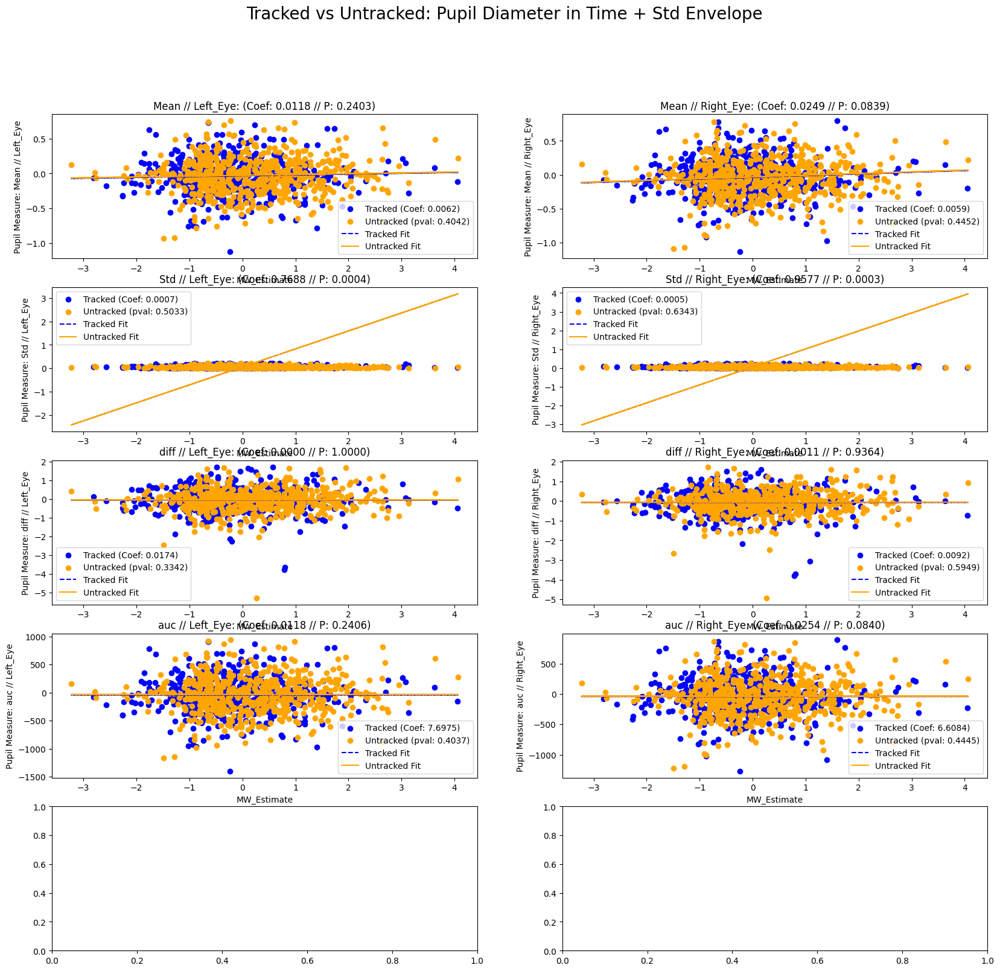

In [ ]:
import statsmodels.formula.api as smf
models = []

import matplotlib.pyplot as plt
from analysisFunctions import plot_pupil_vs_mw
fig, axes = plt.subplots(5, 2, figsize=(20, 18))  # Adjust rows/columns as needed
fig.suptitle("Tracked vs Untracked: Pupil Diameter in Time + Std Envelope", fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
currentModels =[];

log_file.write("\n(1.3) Pupil Diameter vs MW (Pupil ~ MW +Tracking +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Pupil_Diameter'].columns):
    print("\n\n=============================================================")
    print(f"======== Test MW vs Pupil Diameter {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Pupil_Diameter'][ind[0]][ind[1]], grand_df['MW_Estimate'], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking']]).T
    currentDf.columns = ['Pupil','MW_Estimate', 'DS', 'trialNum', 'Tracking']

    currentDf['MW_Estimate'] = pd.to_numeric(currentDf['MW_Estimate'], errors='coerce')   # <─ add this
    # Clean the data
    currentDf = currentDf.dropna(subset=['Pupil','MW_Estimate', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Pupil'] = pd.to_numeric(currentDf['Pupil'], errors='coerce')  # Ensure numeric
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Pupil'] - currentDf['Pupil'].mean() <3*currentDf['Pupil'].std()]
    # Fit the mixed effects model
    m = smf.mixedlm("Pupil ~ MW_Estimate   ", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    currentModels.append(m)
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      MW Estimate Effect     (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")

    coefs.append(m.params[m.params.keys()[2]])
    zvals.append(m.tvalues[m.params.keys()[2]])
    pvals.append(m.pvalues[m.params.keys()[2]])
    conf1.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[2]][1])

    coefsT.append(m.params[m.params.keys()[3]])
    zvalsT.append(m.tvalues[m.params.keys()[3]])
    pvalsT.append(m.pvalues[m.params.keys()[3]])
    conf1T.append(m.conf_int().loc[m.params.keys()[3]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[3]][1])

    indx.append("Pupil x MW")
    eye.append(ind[0])
    analysis.append(ind[1])

    print(m.summary())  # ≈ summary(lm(...)) in R
    plot_pupil_vs_mw(m, currentDf, ind, ax=axes[i])
plt.savefig(os.path.join(statPath,f"PupilvsMW_Unc_{est}_{exclusionName}.png"))

In [ ]:
m.params

Intercept     -0.033333
MW_Estimate    0.006214
DS Var         0.011794
dtype: float64

In [ ]:
grand_df

MW_Estimate GazeDifference Pupil_Diameter                                \
                                          Mean                 Std             
                                      Left_Eye Right_Eye  Left_Eye Right_Eye   
0       1.151388      66.549382      -0.302927 -0.283446  0.116114  0.087787   
1      -0.769815      44.842655      -0.304319 -0.349842  0.031314  0.030663   
2      -0.716449      45.345948      -0.129086 -0.141893  0.035233  0.024322   
3      -0.823182      47.772216      -0.243872 -0.274431  0.060644  0.048683   
4       0.617720      54.860036      -0.267797 -0.275635  0.027706  0.024446   
...          ...            ...            ...       ...       ...       ...   
1195    1.615435      52.187201      -0.048467 -0.081638  0.010201  0.012198   
1196    3.090718      56.959434       0.022520  0.012367  0.007458  0.008628   
1197    1.910492      58.497903      -0.196899 -0.264336  0.018667  0.032195   
1198    2.205548      50.537350       0.026481  0.029596  0.007379  0.009067   
1199   -0.449961      51.838805      -0.263724 -0.375238  0.022118  0.035801   

                                                  ...          Blinks  \
          diff                   auc              ...                   
      Left_Eye Right_Eye    Left_Eye   Right_Eye  ... BlinkDurationSd   
0     0.014359  0.028205 -375.042363 -317.440892  ...       35.696857   
1     0.063724 -0.093368 -376.654157 -391.755041  ...       27.618706   
2     0.040668 -0.011161 -159.887982 -158.970974  ...       31.765257   
3    -0.149032 -0.163326 -301.961424 -307.371131  ...       36.048373   
4    -0.024996 -0.032486 -331.586862 -308.725567  ...       32.036000   
...        ...       ...         ...         ...  ...             ...   
1195 -0.020222 -0.040862  -59.985482  -91.403732  ...       27.583285   
1196  0.022098  0.020378   27.884061   13.846119  ...       37.462121   
1197  0.065303  0.041999 -243.777994 -296.036283  ...       40.289453   
1198  0.010983  0.003667   32.795064   33.151083  ...       35.734671   
1199 -0.066900 -0.083227 -326.505958 -420.237180  ...       33.733379   

           Gaze                                                          \
           mean                                         std               
          LeftX     RightX      LeftY     RightY      LeftX      RightX   
0     47.132004 -24.379321  32.625918   1.809053  34.379632   21.966368   
1     -6.336715 -27.844331  45.451151  24.443003  30.029631   27.151765   
2     -5.722990 -23.842254  68.751416  40.377140  28.317501   17.808472   
3     -0.101493 -28.646306  49.587846  25.711134  38.922779   17.939202   
4     -2.689857 -35.202236  65.034509  27.503727  36.198493   36.772931   
...         ...        ...        ...        ...        ...         ...   
1195   3.649341  45.789474  41.870539  37.565311  48.211137   38.173030   
1196 -16.199257  17.608059  19.359108  32.489621  35.182101   58.798727   
1197 -27.237634  18.407554  15.684110  23.238849  75.854664   65.818666   
1198 -26.769701   1.817438  10.011737  27.734164  64.711060  100.418025   
1199  -6.797987  22.972487  21.946289  22.705779  33.768623   16.560370   

                              Subject  
                                       
           LeftY     RightY            
0      50.095649  46.485879  ADNA2507  
1      57.393501  47.958784  ADNA2507  
2      77.718395  54.025406  ADNA2507  
3      63.778155  45.199686  ADNA2507  
4      69.211442  65.114954  ADNA2507  
...          ...        ...       ...  
1195  128.008029  80.442609  WIJA2308  
1196  118.847293  84.404049  WIJA2308  
1197  136.484639  76.603657  WIJA2308  
1198  120.896605  81.070043  WIJA2308  
1199  141.387125  86.838672  WIJA2308  

[1034 rows x 48 columns]

## (1.4) Left-Right Gaze Difference (TO DO )


- Aimed at computing the difference between the Eyes as an euclidean distance between them, while controlling for Tracking and Trial 
- To see whether the MW estimate can be predicted by the Eye Vergence: a
- And Whether the Eye Vergence is different between the Tracking and Untracking condition

In [ ]:
grand_df

MW_Estimate GazeDifference Pupil_Diameter                                \
                                          Mean                 Std             
                                      Left_Eye Right_Eye  Left_Eye Right_Eye   
0       1.151388      66.549382      -0.302927 -0.283446  0.116114  0.087787   
1      -0.769815      44.842655      -0.304319 -0.349842  0.031314  0.030663   
2      -0.716449      45.345948      -0.129086 -0.141893  0.035233  0.024322   
3      -0.823182      47.772216      -0.243872 -0.274431  0.060644  0.048683   
4       0.617720      54.860036      -0.267797 -0.275635  0.027706  0.024446   
...          ...            ...            ...       ...       ...       ...   
1195    1.615435      52.187201      -0.048467 -0.081638  0.010201  0.012198   
1196    3.090718      56.959434       0.022520  0.012367  0.007458  0.008628   
1197    1.910492      58.497903      -0.196899 -0.264336  0.018667  0.032195   
1198    2.205548      50.537350       0.026481  0.029596  0.007379  0.009067   
1199   -0.449961      51.838805      -0.263724 -0.375238  0.022118  0.035801   

                                                  ...          Blinks  \
          diff                   auc              ...                   
      Left_Eye Right_Eye    Left_Eye   Right_Eye  ... BlinkDurationSd   
0     0.014359  0.028205 -375.042363 -317.440892  ...       35.696857   
1     0.063724 -0.093368 -376.654157 -391.755041  ...       27.618706   
2     0.040668 -0.011161 -159.887982 -158.970974  ...       31.765257   
3    -0.149032 -0.163326 -301.961424 -307.371131  ...       36.048373   
4    -0.024996 -0.032486 -331.586862 -308.725567  ...       32.036000   
...        ...       ...         ...         ...  ...             ...   
1195 -0.020222 -0.040862  -59.985482  -91.403732  ...       27.583285   
1196  0.022098  0.020378   27.884061   13.846119  ...       37.462121   
1197  0.065303  0.041999 -243.777994 -296.036283  ...       40.289453   
1198  0.010983  0.003667   32.795064   33.151083  ...       35.734671   
1199 -0.066900 -0.083227 -326.505958 -420.237180  ...       33.733379   

           Gaze                                                          \
           mean                                         std               
          LeftX     RightX      LeftY     RightY      LeftX      RightX   
0     47.132004 -24.379321  32.625918   1.809053  34.379632   21.966368   
1     -6.336715 -27.844331  45.451151  24.443003  30.029631   27.151765   
2     -5.722990 -23.842254  68.751416  40.377140  28.317501   17.808472   
3     -0.101493 -28.646306  49.587846  25.711134  38.922779   17.939202   
4     -2.689857 -35.202236  65.034509  27.503727  36.198493   36.772931   
...         ...        ...        ...        ...        ...         ...   
1195   3.649341  45.789474  41.870539  37.565311  48.211137   38.173030   
1196 -16.199257  17.608059  19.359108  32.489621  35.182101   58.798727   
1197 -27.237634  18.407554  15.684110  23.238849  75.854664   65.818666   
1198 -26.769701   1.817438  10.011737  27.734164  64.711060  100.418025   
1199  -6.797987  22.972487  21.946289  22.705779  33.768623   16.560370   

                              Subject  
                                       
           LeftY     RightY            
0      50.095649  46.485879  ADNA2507  
1      57.393501  47.958784  ADNA2507  
2      77.718395  54.025406  ADNA2507  
3      63.778155  45.199686  ADNA2507  
4      69.211442  65.114954  ADNA2507  
...          ...        ...       ...  
1195  128.008029  80.442609  WIJA2308  
1196  118.847293  84.404049  WIJA2308  
1197  136.484639  76.603657  WIJA2308  
1198  120.896605  81.070043  WIJA2308  
1199  141.387125  86.838672  WIJA2308  

[1034 rows x 48 columns]

              Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  GazeDifference
No. Observations:    1158     Method:              REML          
No. Groups:          29       Scale:               609.7403      
Min. group size:     38       Log-Likelihood:      -5411.1422    
Max. group size:     40       Converged:           Yes           
Mean group size:     39.9                                        
-----------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept              57.957    5.638 10.280 0.000 46.908 69.007
Tracking[T.UNTRACKED]   2.645    1.451  1.822 0.068 -0.200  5.489
trialNum               -0.013    0.063 -0.207 0.836 -0.136  0.110
DS Var                843.143    9.405                           



c:\Users\barak\Documents\GitHub\startegicMW_lite\Experiment\analysis\analysisFunctions.py:1964: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  ax.scatter(grTr.mean().loc[firstContrast].index,grTr.mean().loc[firstContrast],label="Subj Mean Tracked",color = 'blue')


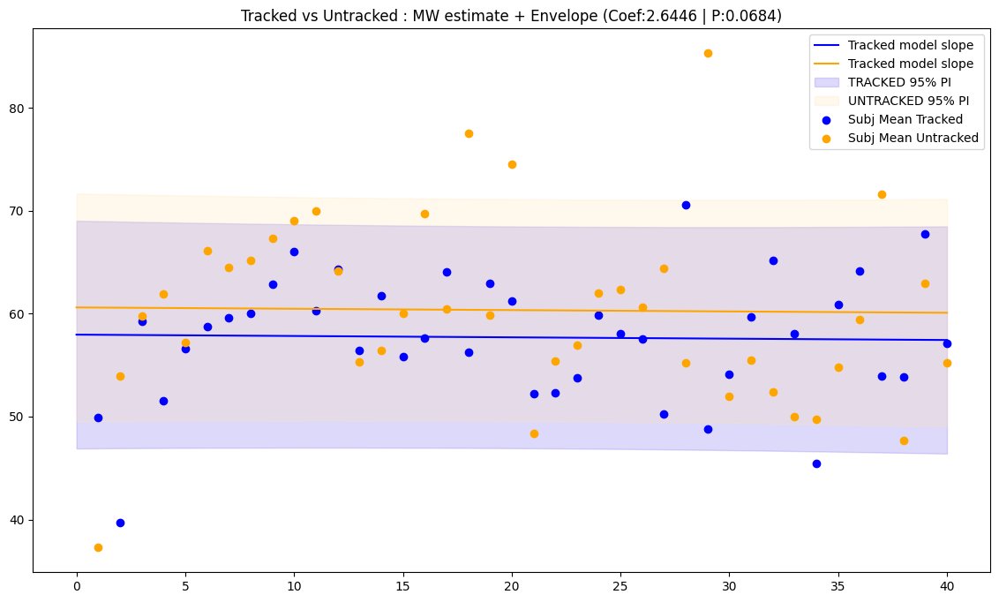

In [ ]:
import statsmodels.formula.api as smf

m = smf.mixedlm("GazeDifference ~ Tracking +trialNum", data=grand_df[['MW_Estimate','DS','Tracking','trialNum','GazeDifference']],
                groups="DS",          # random intercept
                #re_formula="~Tracking",         # adds random slope

               ).fit()

log_file.write("(1.4.1) Uncorrected Samples (GazeDifference ~ Tracking  +(1|Subjects)) \n")

log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")


print(m.summary())   
coefs.append(m.params[m.params.keys()[1]])
zvals.append(m.tvalues[m.params.keys()[1]])
pvals.append(m.pvalues[m.params.keys()[1]])
conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

coefsT.append(m.params[m.params.keys()[2]])
zvalsT.append(m.tvalues[m.params.keys()[2]])
pvalsT.append(m.pvalues[m.params.keys()[2]])
conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])

indx.append("Gaze Difference ")
eye.append('')
analysis.append('Tracking')

fig, ax = plt.subplots(figsize=(14, 8))
plotTrialTrack(m,'GazeDifference',grand_df,ax,titl=f"Tracked vs Untracked : MW estimate + Envelope (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})" ,paramNum = [0,1,2])
plt.savefig(os.path.join(statPath,f"GazeDiff_TrVsUntr_Unc_{est}_{exclusionName}.png"))



Intercept                5.147897
Tracking[T.UNTRACKED]    1.000092
trialNum                 1.000092
dtype: float64


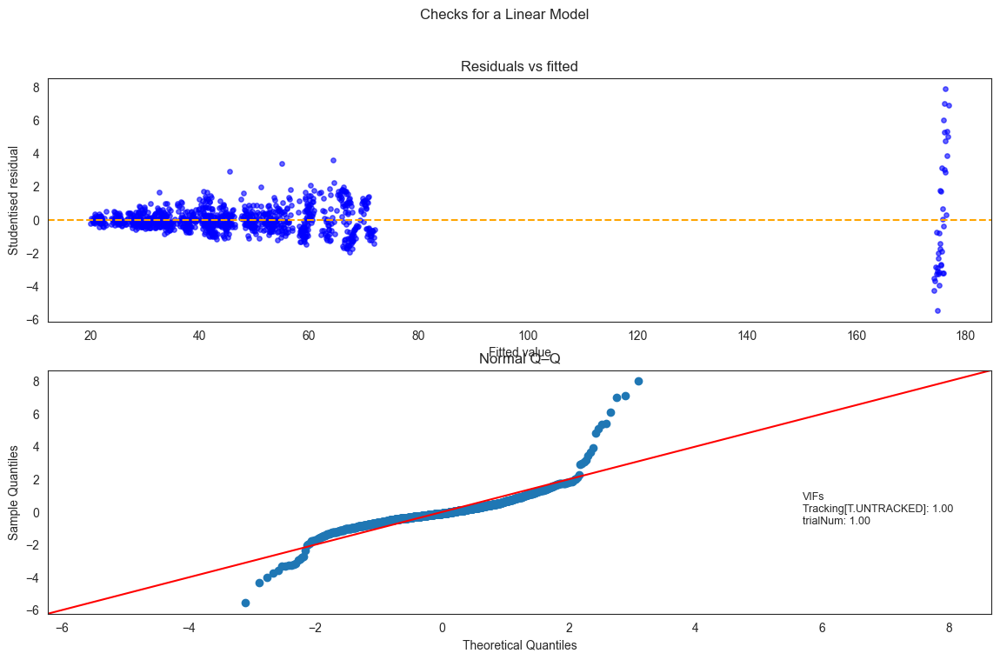

In [ ]:
from analysisFunctions import linearModelChecks
### Checks the assumptioons of a linear model 
linearModelChecks(m,grand_df)
plt.savefig(os.path.join(statPath,f"GazeDiff_TrVsUntr_Unc_Check_{est}_{exclusionName}.png"))

In [ ]:
m.params[m.params.keys()[0]]

59.018388949360265

           Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: GazeDifference
No. Observations: 1158    Method:             REML          
No. Groups:       29      Scale:              608.0939      
Min. group size:  38      Log-Likelihood:     -5408.9507    
Max. group size:  40      Converged:          Yes           
Mean group size:  39.9                                      
-------------------------------------------------------------
              Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
-------------------------------------------------------------
Intercept     59.018     5.441  10.847  0.000  48.355  69.682
MW_Estimate    1.711     0.735   2.328  0.020   0.271   3.151
DS Var       843.234     9.418                               



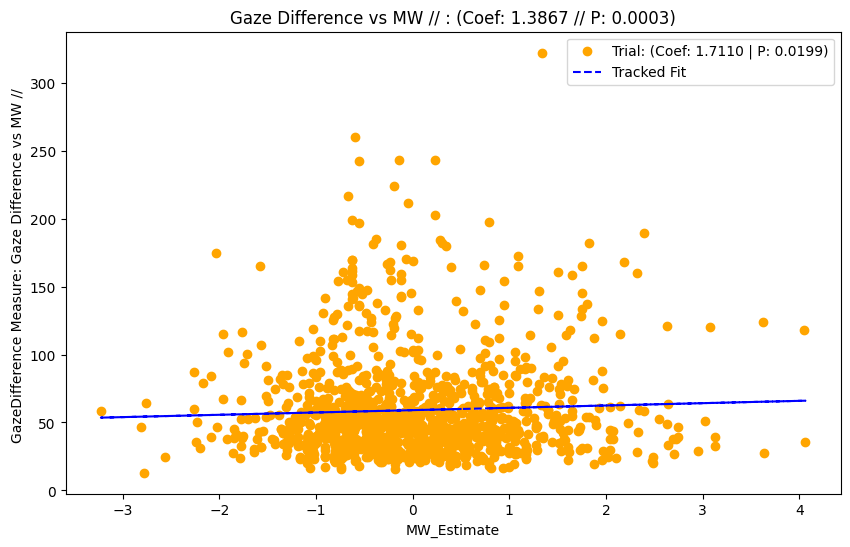

In [ ]:
# Combine single-level and multi-level columns
subset = pd.concat([
    grand_df[('MW_Estimate', '', '')].rename('MW_Estimate'),

    grand_df[('Tracking', '', '')].rename('Tracking'),
    grand_df[('DS', '', '')].rename('DS'),
    grand_df[('trialNum', '', '')].rename('trialNum'),
    grand_df[('Checks', '', 'gazeDiff')].rename('gazeDiff')
], axis=1)



import statsmodels.formula.api as smf

m = smf.mixedlm(" GazeDifference~ MW_Estimate ", data=grand_df[['MW_Estimate','DS','Tracking','trialNum','GazeDifference']],
                groups="DS",          # random intercept
                #re_formula="~Tracking",         # adds random slope

               ).fit()

log_file.write("(1.4.2) Uncorrected Samples (MW_Estimate ~ GazeDifference+Tracking +TrialNum +(1|Subjects)) \n")

# log_file.write(f"      GazeDiff Effect        (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")
# log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[3]]:3.3f}| Z: {m.tvalues[m.params.keys()[3]]:3.3f}| P: {m.pvalues[m.params.keys()[3]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[3]][0]:3.3f} {m.conf_int().loc[m.params.keys()[3]][1]:3.3f})\n")




print(m.summary())   
# coefs.append(m.params[m.params.keys()[2]])
# zvals.append(m.tvalues[m.params.keys()[2]])
# pvals.append(m.pvalues[m.params.keys()[2]])
# conf1.append(m.conf_int().loc[m.params.keys()[2]][0])
# conf2.append(m.conf_int().loc[m.params.keys()[2]][1])

# coefsT.append(m.params[m.params.keys()[3]])
# zvalsT.append(m.tvalues[m.params.keys()[3]])
# pvalsT.append(m.pvalues[m.params.keys()[3]])
# conf1T.append(m.conf_int().loc[m.params.keys()[3]][0])
# conf2T.append(m.conf_int().loc[m.params.keys()[3]][1])

indx.append("Gaze Difference ")
eye.append('')
analysis.append('MW_estimate')

plot_pupil_vs_mw(m, grand_df[['MW_Estimate','DS','Tracking','trialNum','GazeDifference']], ["Gaze Difference vs MW",""], ax=None,meas='GazeDifference',meas1=1,meas2=2,target='MW_Estimate',tracking=False)
plt.savefig(os.path.join(statPath,f"MWvsGaze_Unc_{est}_{exclusionName}.png"))


In [ ]:

def linearModelChecks(m,grand_df,formula= "MW_Estimate ~ Tracking + trialNum"):
    # trial-level diagnostics
    resid   = m.resid                   # raw (conditional) residuals
    fitted  = m.fittedvalues            # conditional fitted values
    std_res = resid / np.sqrt(m.scale)  # ≈ studentised residuals
    fig,axs = plt.subplots(2,1,figsize=(14, 8))
    plt.suptitle("Checks for a Linear Model")

    # (1) Homoscedascisity
    axs[0].scatter(fitted, std_res, alpha=0.6, s=15,color='blue')
    axs[0].axhline(0, linestyle='--',color='orange')
    axs[0].set_xlabel("Fitted value")
    axs[0].set_ylabel("Studentised residual")
    axs[0].set_title("Residuals vs fitted")

    # (2) 
    sm.qqplot(std_res, line="45", fit=True, ax=axs[1])
    axs[1].set_title("Normal Q–Q")

    # (3) Colinearity:
    from patsy import dmatrices

    formula_fixed =formula   # your fixed part
    y, X = dmatrices(formula_fixed, data=grand_df, return_type="dataframe")
    from statsmodels.stats.outliers_influence import variance_inflation_factor

    vif = pd.Series(
        [variance_inflation_factor(X.values, i) for i in range(X.shape[1])],
        index=X.columns
    )
    print(vif)

     # Drop the intercept from display (its VIF is usually not meaningful)
    vif_display = vif.drop('Intercept', errors='ignore')
    
    # Convert to multiline string
    vif_text = "\n".join([f"{k}: {v:.2f}" for k, v in vif_display.items()])
    vif_text = f"VIFs\n{vif_text}"

    axs[1].text(
        0.8, 0.5, vif_text,
        transform=axs[1].transAxes,
        verticalalignment='top',
        fontsize=9,
        bbox=dict(boxstyle="round,pad=0.4", facecolor="white", alpha=0.8)
    )


In [ ]:
grand_df['GazeDifference']

0       18.101889
1       22.222548
2       27.139951
3       29.549453
4       23.759388
          ...    
1235    58.504876
1236    47.530693
1237    34.711861
1238    64.811923
1239    45.357810
Name: GazeDifference, Length: 1158, dtype: float64

Intercept                2.033832
Tracking[T.UNTRACKED]    1.032822
MW_Estimate              1.032822
dtype: float64


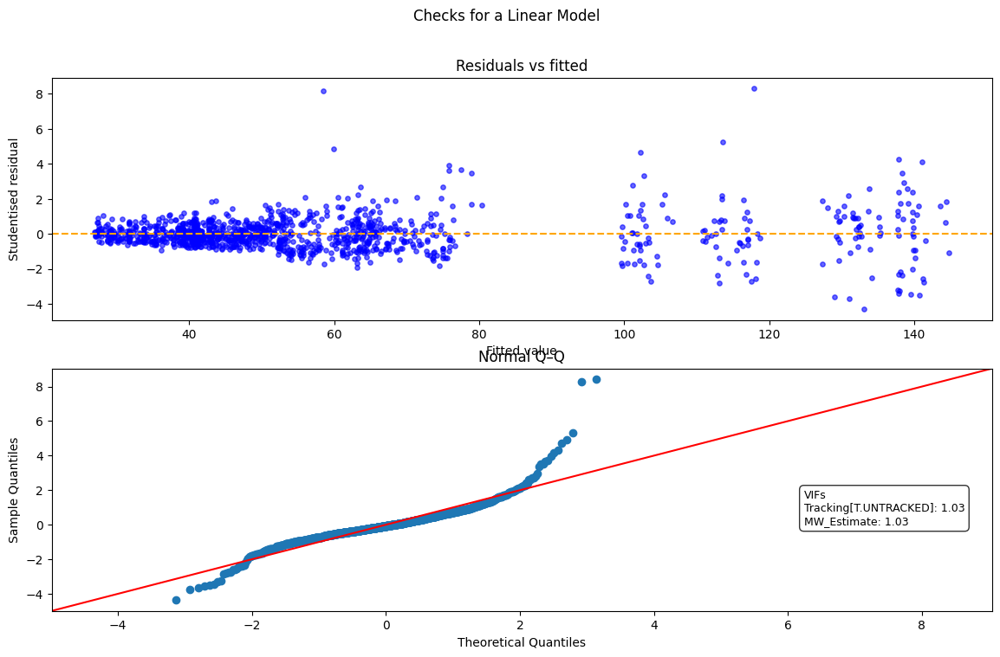

In [ ]:
### Checks the assumptioons of a linear model 
linearModelChecks(m,grand_df, formula="GazeDifference ~ MW_Estimate+Tracking")
plt.savefig(os.path.join(statPath,f"MWvsGaze_Unc_Check_{est}_{exclusionName}.png"))

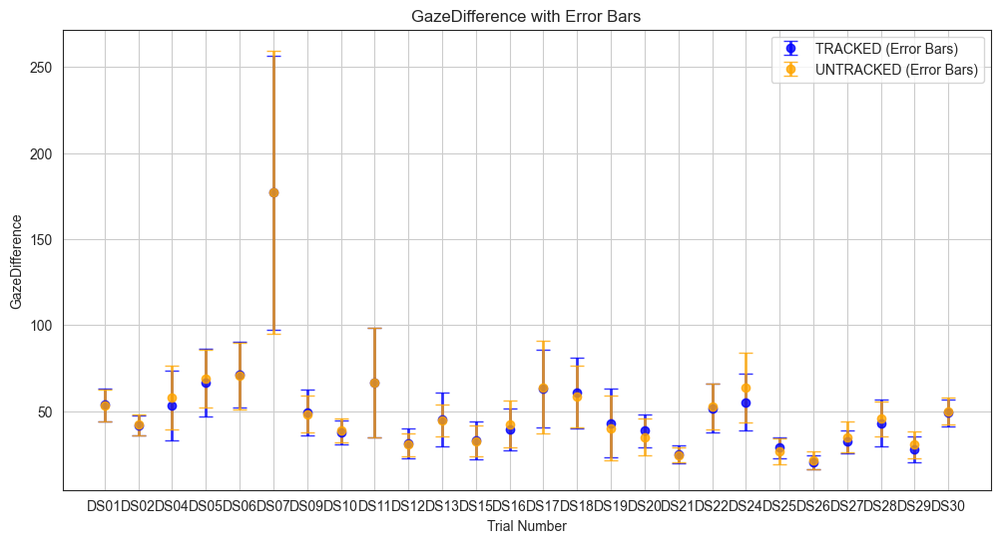

In [ ]:
mew = grand_df[grand_df['Tracking'] == 'TRACKED'][['DS','GazeDifference']].groupby(['DS'])
umew = grand_df[grand_df['Tracking'] == 'UNTRACKED'][['DS','GazeDifference']].groupby(['DS'])


plt.figure(figsize=(12, 6))

# Plot for TRACKED group
plt.errorbar(mew.mean().index, 
             mew.mean()['GazeDifference'].values, 
             yerr=mew.std()['GazeDifference'].values, 
             fmt='o', color='blue', label='TRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Plot for UNTRACKED group
plt.errorbar(umew.mean().index, 
             umew.mean()['GazeDifference'].values, 
             yerr=umew.std()['GazeDifference'].values, 
             fmt='o', color='orange', label='UNTRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Add labels, legend, and title
plt.xlabel('Trial Number')
plt.ylabel('GazeDifference')
plt.title('GazeDifference with Error Bars')
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig(os.path.join(statPath,f"GazeDiffacrossSubj__{est}_{exclusionName}.png"))

### (1.6) Tracked vs Untracked Persons Similarity

We want to check whether People That had to track Jacek vs track Karolina have more dissimilar all-experiment Pupil Time-series:

- We concatenate Raw Pupil Diam for ALL cutting 5000 ms from Beg and End (if it is not applied already)
- We compute the gaze Difference by an Euclidean Distance between Eye Poistion
- We gert thr MW_Estimate for every subject
- WE compute Correlation between Every Subject creating a Dense Subject - to subject correlational matrix 
- We select from that correlational Matrix entities that Have been TRACKED 




In [ ]:
currentPupilDf

,index,TimePoint,LeftX,LeftY,LeftPupil,RightX,RightY,RightPupil,trialNum,DS,gazeDiff,firstEnt
0,60,120.0,943.0,524.9,NaN,923.0,568.9,NaN,1,DS30,546.291516,TRACKED
1,65,130.0,943.1,524.9,NaN,919.5,568.4,NaN,1,DS30,544.159214,TRACKED
2,70,140.0,942.2,523.2,NaN,919.5,563.9,NaN,1,DS30,547.872777,TRACKED
3,75,150.0,941.5,523.2,NaN,917.5,564.9,NaN,1,DS30,545.252281,TRACKED
4,80,160.0,942.0,523.0,NaN,919.3,566.6,NaN,1,DS30,545.874390,TRACKED
...,...,...,...,...,...,...,...,...,...,...,...,...
5371,1517363,3067655.0,947.7,509.3,NaN,968.4,535.8,NaN,40,DS30,616.793661,TRACKED
5372,1517368,3067665.0,944.6,508.2,NaN,967.7,534.3,NaN,40,DS30,616.024626,TRACKED
5373,1517373,3067675.0,945.3,510.9,NaN,969.5,533.5,NaN,40,DS30,616.354768,TRACKED
5374,1517378,3067685.0,943.9,513.0,NaN,969.1,535.5,NaN,40,DS30,612.223627,TRACKED


In [ ]:
Pupils = []

for i, ds in enumerate(allData):
    currentPupilDs = [];
    _,_,currentPupilDs = getPupilDiamLast(ds,currentPupilDs,beg = 0,end=0,mode="all") # Cut 5000 ms from beg and End to see how Eye behaves in the middle of the trial
    print(len(pd.concat(currentPupilDs)))
    currentPupilDf = pd.concat(currentPupilDs); # Create one Data Froame for a subject containing ALL trials 
    currentPupilDs = [df.assign(TrialNum=j+1) for j, df in enumerate(currentPupilDs)]
    currentPupilDf['DS'] =f"DS{(i+1):02d}" # rename the Subject
    currentPupilDf['gazeDiff'] = np.sqrt((currentPupilDf['LeftX'] - currentPupilDf['RightY'])**2 + (currentPupilDf['LeftY'] - currentPupilDf['RightX'])**2); # compute the gaze Difference by Euclidean Distance

 
    if mm:
        currentPupilDf['LeftPupil'] = currentPupilDf['LeftPupil'] * (LeftPupilConv)
        currentPupilDf['RightPupil'] = currentPupilDf['RightPupil'] * (LeftPupilConv)


    if not grand_df[grand_df['DS'] == f"DS{(i+1):02d}"].empty: # If the DS is NOT missing  then for that particular entity we get the values we ascribe whether the first entity has been TRACKED or UNTRACKED
        currentPupilDf['firstEnt'] = grand_df[grand_df['DS'] == f"DS{(i+1):02d}"].iloc[0]['Tracking'].values[0]
        Pupils.append(currentPupilDf)


180977
180981
180976
180971
180976
180976
180969
180975
180973
180970
180975
180973
180980
180973
180978
180970
180977
180976
180973
180966
180971
180973
180974
180975
180976
180966
180969
180977
180975
180978


In [ ]:
### RECUT trials

# for k in range(len(Pupils)):
#     trimmed_trials = []
#     for tr in range(1, 41):
#         trial_df = Pupils[k][Pupils[k]['TrialNum'] == tr]
#         minimalCurrentTrial = min(len(Pupils[i][Pupils[i]['TrialNum'] == tr]) for i in range(len(Pupils)))
#         trimmed_trial = trial_df.iloc[:minimalCurrentTrial, :]
#         trimmed_trials.append(trimmed_trial)
#     Pupils[k] = pd.concat(trimmed_trials, ignore_index=True)

In [ ]:
### Getting MW Estimate Trials for Eac Subject

dd = [];
for i in range(1,30): # For every subject from 1 to 18 we get the MW estimate from grand DF as well as tracking and untracking, and create a list out of it 
    currDF = grand_df[grand_df['DS'] == f"DS{i:02d}"][['MW_Estimate','DS']]
    if not grand_df[grand_df['DS'] == f"DS{(i):02d}"].empty: # If the DS is NOT missing  then for that particular entity we get the values we ascribe whether the first entity has been TRACKED or UNTRACKED
        currDF['firstEnt'] = grand_df[grand_df['DS'] == f"DS{(i):02d}"].iloc[0]['Tracking'].values[0]
        dd.append(currDF)

WilcoxonResult(statistic=90.0, pvalue=0.05157625675201416)


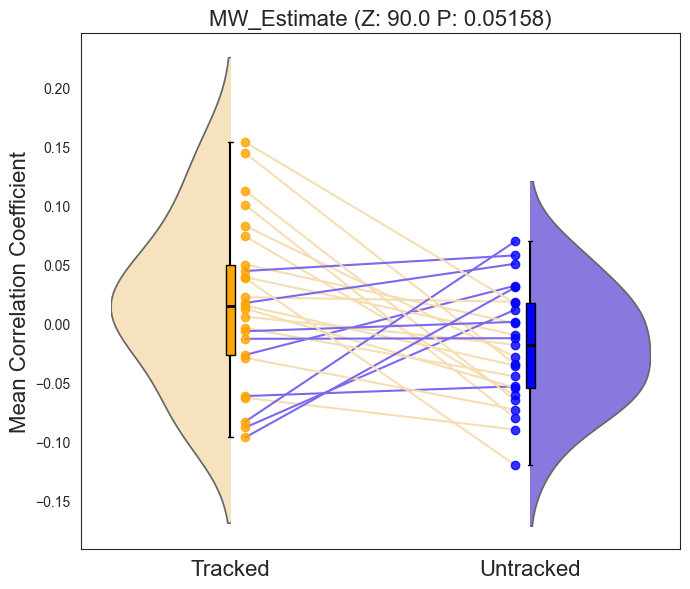

In [ ]:
from analysisFunctions import pairwiseCorrMatrix, diffRainPlot
from scipy.stats import wilcoxon


corr_matrix, meanPupilDiam = pairwiseCorrMatrix(dd, column=f"MW_Estimate")

results = wilcoxon(meanPupilDiam['meanCorrTracked'].values, meanPupilDiam['meanCorrUntracked'].values)

log_file.write("(1.6.1) Subject Similarity (MW) (meanCorrMW_Tracked ~ meanCorrMW_Untracked) \n")
log_file.write(f"      Wilcoxon Difference Stat:        (Stat: {results.statistic:3.3f}| P: {results.pvalue:3.3f}\n")

print(results)
# Pass the axis to diffRainPlot
diffRainPlot(
    [meanPupilDiam['meanCorrTracked'], meanPupilDiam['meanCorrUntracked']],
    f"MW_Estimate (Z: {results.statistic} P: {results.pvalue:1.5f})",
)
plt.tight_layout()
plt.savefig(os.path.join(statPath, f"RainPlots_MW_Estimate_{est}_{exclusionName}.png"))
plt.show()

WilcoxonResult(statistic=122.0, pvalue=0.18135443329811096)
WilcoxonResult(statistic=173.0, pvalue=0.9601797163486481)
WilcoxonResult(statistic=118.0, pvalue=0.14990898966789246)
WilcoxonResult(statistic=169.0, pvalue=0.8809217512607574)
WilcoxonResult(statistic=165.0, pvalue=0.8028007447719574)
WilcoxonResult(statistic=102.0, pvalue=0.0630297064781189)


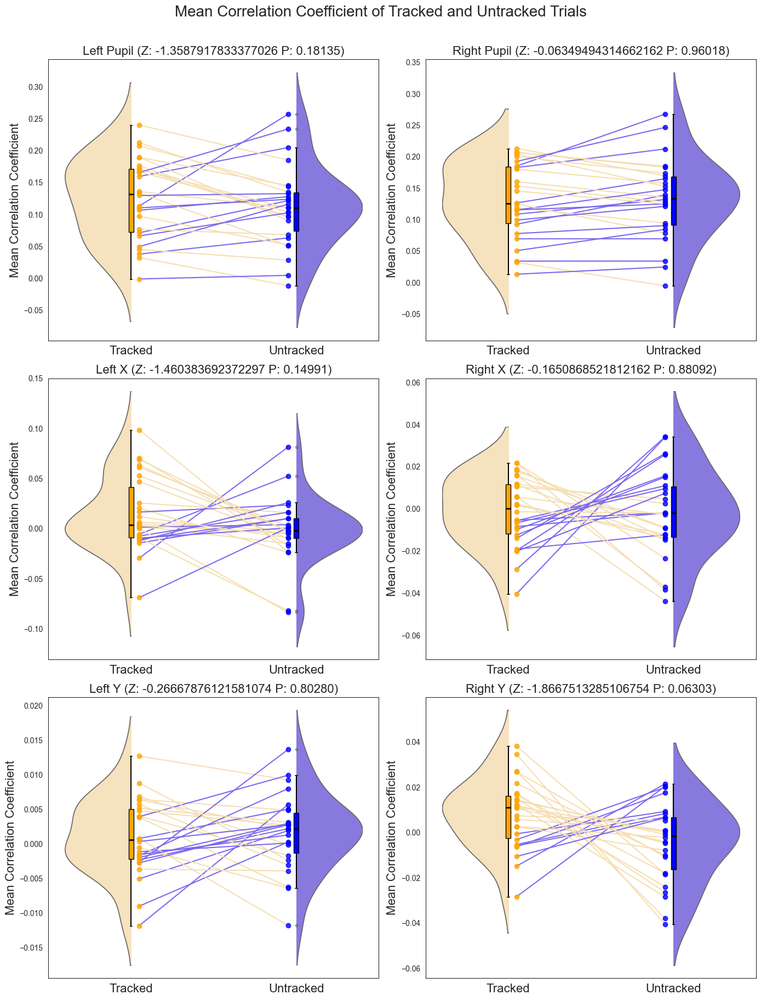

In [ ]:
import pandas as pd
from scipy.stats import wilcoxon
from analysisFunctions import pairwiseCorrMatrix, diffRainPlot
import matplotlib.pyplot as plt

# Prepare the 3x2 subplot structure
fig, axes = plt.subplots(3, 2, figsize=(14, 18))
axes = axes.flatten()  # Flatten for easy indexing
plt.suptitle("Mean Correlation Coefficient of Tracked and Untracked Trials",fontsize=20, y=1.01)
plot_idx = 0  # To keep track of subplot index
log_file.write("(1.6.2) Subject Similarity (Gaze) (meanCorrGaze_Tracked ~ meanCorrGaze_Untracked) \n")
def signed_rank_to_z(W, n):
    mean = n * (n + 1) / 4
    sd = np.sqrt(n * (n + 1) * (2 * n + 1) / 24)
    z = (W - mean) / sd
    return z


for col in ['Pupil', 'X', 'Y']:
    for ey in ['Left', 'Right']:

        
        corr_matrix, meanPupilDiam = pairwiseCorrMatrix(Pupils, column=f"{ey}{col}")
        results = wilcoxon(meanPupilDiam['meanCorrTracked'].values, meanPupilDiam['meanCorrUntracked'].values)
        print(results)
        log_file.write(f"      Wilcoxon Difference Stat {col}/{ey}:        (Stat: {results.statistic:3.3f}| P: {results.pvalue:3.3f}\n")

        # Pass the axis to diffRainPlot
        diffRainPlot(
            [meanPupilDiam['meanCorrTracked'], meanPupilDiam['meanCorrUntracked']],
            f"{ey} {col} (Z: {signed_rank_to_z(results.statistic,len(meanPupilDiam))} P: {results.pvalue:1.5f})",
            ax=axes[plot_idx]
        )
        plot_idx += 1

plt.tight_layout()
plt.savefig(os.path.join(statPath, f"RainPlots_GazeCorr_{est}_{exclusionName}.png"))
plt.show()

### 1.7.3 Trialwise

Now We compute our Correlation to EACH Trial 



In [ ]:
# allMeanCorrs = pd.concat(allMeanPupDiam)
# allMeanCorrs = allMeanCorrs.reset_index(drop=True)
# allMeanCorrs = allMeanCorrs.dropna(subset=["MeanCorr"])
# m = smf.mixedlm("MeanCorr ~Condition", data=allMeanCorrs,
#                     groups="TrialNum",  # Random intercept
#                     ).fit()
# m.summary()

### 1.7.4 - Wariancja 

Quick check of Differences in Variance of Eye Movements in Tracked and Untracked periods of time 

this basically equivalent almost to using All data segments and computing PupilDiamterStd - but instead with Variance 

In [ ]:
trs = [];
subs = [];
vars = [];
trackedUntracked = [];
for i in range(len(trials[1])): # SUbjects
    for j in range(0,40):    # Trials
        subs.append(i)
        trs.append(j)
        vars.append(np.nanvar(trials[j][i]['LeftPupil']));

        if (trials[j][i]['firstEnt'].iloc[0] =='TRACKED') and (j % 2 ==0):
            trackedUntracked.append('TRACKED')
        else:
            trackedUntracked.append('UNTRACKED')

varDf = pd.DataFrame({'DS':subs,'TrialNum':trs,'VarLeftPupil':vars,'Tracking':trackedUntracked})
varDf = varDf.reset_index(drop=True)
varDf = varDf.dropna(subset=["VarLeftPupil"])
m = smf.mixedlm("VarLeftPupil ~Tracking +TrialNum", data=varDf,
                    groups="DS",  # Random intercept
                    ).fit()

m.summary()

<class 'statsmodels.iolib.summary2.Summary'>
"""
             Mixed Linear Model Regression Results
================================================================
Model:              MixedLM   Dependent Variable:   VarLeftPupil
No. Observations:   1182      Method:               REML        
No. Groups:         30        Scale:                0.0009      
Min. group size:    32        Log-Likelihood:       2397.3249   
Max. group size:    40        Converged:            Yes         
Mean group size:    39.4                                        
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept              0.060    0.005 11.116 0.000  0.049  0.070
Tracking[T.UNTRACKED]  0.001    0.002  0.250 0.803 -0.004  0.005
TrialNum              -0.000    0.000 -3.742 0.000 -0.000 -0.000
DS Var                 0.001    0.006                           
================================================================

"""

### (1.8) Gaze Data Testing: 


Tests whether Gaze Patterns are Different across our subjects 



======== Test for Pupil Diameter mean // LeftX =======

              Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    Gaze      
No. Observations:     1019       Method:                REML      
No. Groups:           26         Scale:                 2925.0498 
Min. group size:      24         Log-Likelihood:        -5551.1558
Max. group size:      40         Converged:             Yes       
Mean group size:      39.2                                        
------------------------------------------------------------------
                       Coef.   Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept               27.271   10.085  2.704 0.007  7.505 47.038
Tracking[T.UNTRACKED]   -0.376    3.389 -0.111 0.912 -7.017  6.266
trialNum                -0.801    0.147 -5.452 0.000 -1.089 -0.513
DS Var                2260.546   12.527                           



======== Test fo

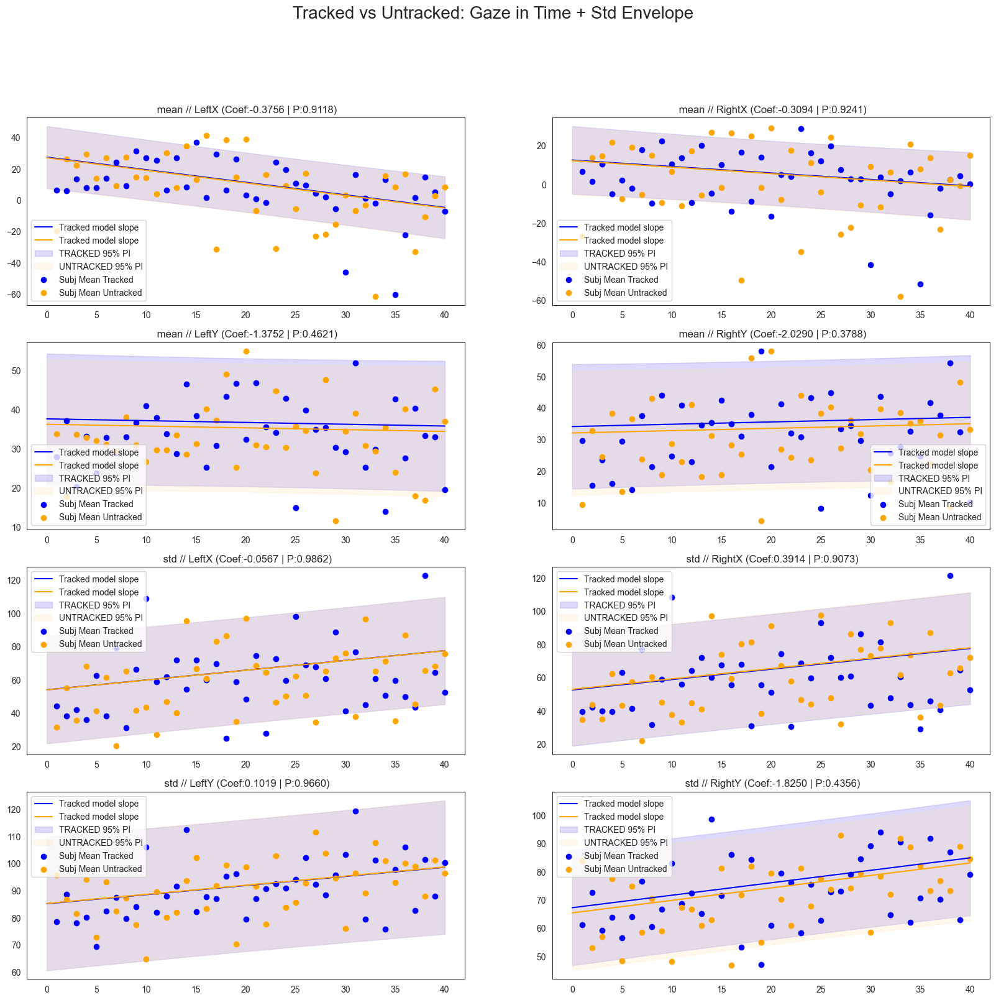

In [ ]:
import statsmodels.formula.api as smf
from analysisFunctions import plotTrialTrack
models = []
import matplotlib.pyplot as plt
fig, axes = plt.subplots(4,2,figsize=(20,18))
fig.suptitle("Tracked vs Untracked: Gaze in Time + Std Envelope",fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
log_file.write("\n(1.8.1) Gaze Parameters vs Tracking (Gaze ~ Tracking +TrialNum +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Gaze'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Pupil Diameter {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Gaze'][ind[0]][ind[1]], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking']]).T
    currentDf.columns = ['Gaze', 'DS', 'trialNum', 'Tracking']
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    
    
    # Clean the data
    currentDf = currentDf.dropna(subset=['Gaze', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Gaze'] = pd.to_numeric(currentDf['Gaze'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Gaze'] - currentDf['Gaze'].mean() <3*currentDf['Gaze'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Gaze ~ Tracking + trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    print(m.summary())  # ≈ summary(lm(...)) in R

    
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")
    
    coefs.append(m.params[m.params.keys()[1]])
    zvals.append(m.tvalues[m.params.keys()[1]])
    pvals.append(m.pvalues[m.params.keys()[1]])
    conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

    coefsT.append(m.params[m.params.keys()[2]])
    zvalsT.append(m.tvalues[m.params.keys()[2]])
    pvalsT.append(m.pvalues[m.params.keys()[2]])
    conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])


    indx.append("Gaze vs Tracking")
    eye.append(ind[0])
    analysis.append(ind[1])



    plotTrialTrack(m,"Gaze",currentDf,axes[i],titl=f" {ind[0]} // {ind[1]} (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})")

plt.savefig(os.path.join(statPath,f"GzevsTrackin_{est}_{exclusionName}.png"))



======== Test for Pupil Diameter mean // LeftX =======

              Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    Gaze      
No. Observations:     1019       Method:                REML      
No. Groups:           26         Scale:                 2921.8388 
Min. group size:      24         Log-Likelihood:        -5548.6451
Max. group size:      40         Converged:             Yes       
Mean group size:      39.2                                        
------------------------------------------------------------------
                       Coef.   Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept               26.650   10.095  2.640 0.008  6.864 46.437
Tracking[T.UNTRACKED]    0.171    3.408  0.050 0.960 -6.508  6.851
MW_Estimate             -2.505    1.737 -1.442 0.149 -5.910  0.900
trialNum                -0.784    0.147 -5.320 0.000 -1.072 -0.495
DS Var             

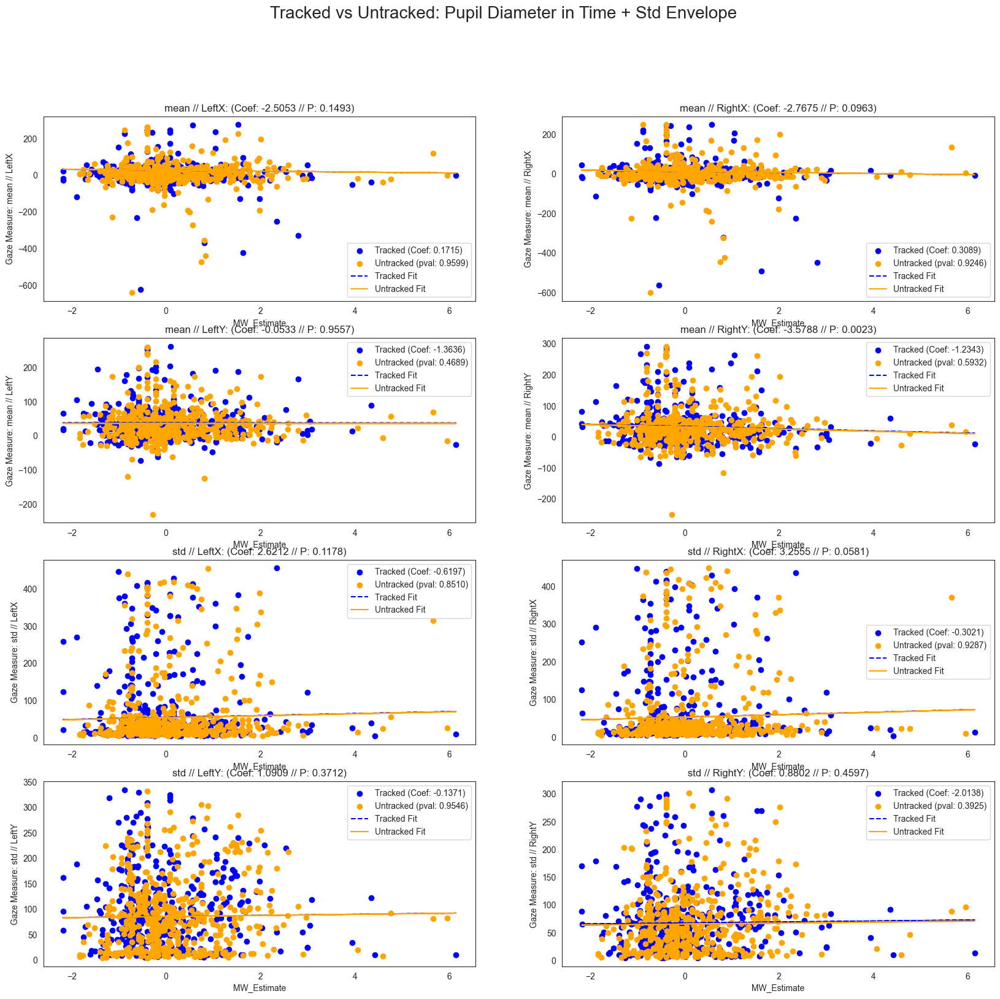

In [ ]:
import statsmodels.formula.api as smf
from analysisFunctions import plotTrialTrack
models = []
import matplotlib.pyplot as plt
fig, axes = plt.subplots(4,2,figsize=(20,18))
fig.suptitle("Tracked vs Untracked: Pupil Diameter in Time + Std Envelope",fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
log_file.write("\n(1.8.2) Gaze Parameters vs MW (Gaze ~ MW_Estimate+ Tracking +TrialNum +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Gaze'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Pupil Diameter {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Gaze'][ind[0]][ind[1]],grand_df['MW_Estimate'], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking']]).T
    currentDf.columns = ['Gaze','MW_Estimate', 'DS', 'trialNum', 'Tracking']
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric    
    currentDf['MW_Estimate'] = pd.to_numeric(currentDf['MW_Estimate'], errors='coerce')   # <─ add this

    # Clean the data
    currentDf = currentDf.dropna(subset=['Gaze', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Gaze'] = pd.to_numeric(currentDf['Gaze'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Gaze'] - currentDf['Gaze'].mean() <3*currentDf['Gaze'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Gaze ~ MW_Estimate+ Tracking+trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    print(m.summary())  # ≈ summary(lm(...)) in R

    
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")
    
    
    coefs.append(m.params[m.params.keys()[2]])
    zvals.append(m.tvalues[m.params.keys()[2]])
    pvals.append(m.pvalues[m.params.keys()[2]])
    conf1.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[2]][1])

    coefsT.append(m.params[m.params.keys()[3]])
    zvalsT.append(m.tvalues[m.params.keys()[3]])
    pvalsT.append(m.pvalues[m.params.keys()[3]])
    conf1T.append(m.conf_int().loc[m.params.keys()[3]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[3]][1])

    indx.append("Gaze vs MW")
    eye.append(ind[0])
    analysis.append(ind[1])

    plot_pupil_vs_mw(m, currentDf, ind, ax=axes[i],meas='Gaze')

plt.savefig(os.path.join(statPath,f"GazevsMW_{est}_{exclusionName}.png"))

### (1.9) Saccade and BLink Testing

Here we check whethet tracking Untracking Conditions, as well as Mind Wandering depends on Saccades And/ Or Blinks:
WARNING This is for ALL of the duration of Trial


#### (1.9.1) Saccades vs Tracking/Untracking



======== Test for Saccades  // SaccDistance =======

              Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    Saccade   
No. Observations:     1005       Method:                REML      
No. Groups:           26         Scale:                 1739.0398 
Min. group size:      9          Log-Likelihood:        -5237.1001
Max. group size:      40         Converged:             Yes       
Mean group size:      38.7                                        
------------------------------------------------------------------
                       Coef.   Std.Err.   z   P>|z| [0.025  0.975]
------------------------------------------------------------------
Intercept               88.899   18.299 4.858 0.000 53.033 124.765
Tracking[T.UNTRACKED]    3.215    2.631 1.222 0.222 -1.943   8.372
trialNum                 0.661    0.114 5.794 0.000  0.437   0.884
DS Var                8472.289   58.873                           



======== Test for S

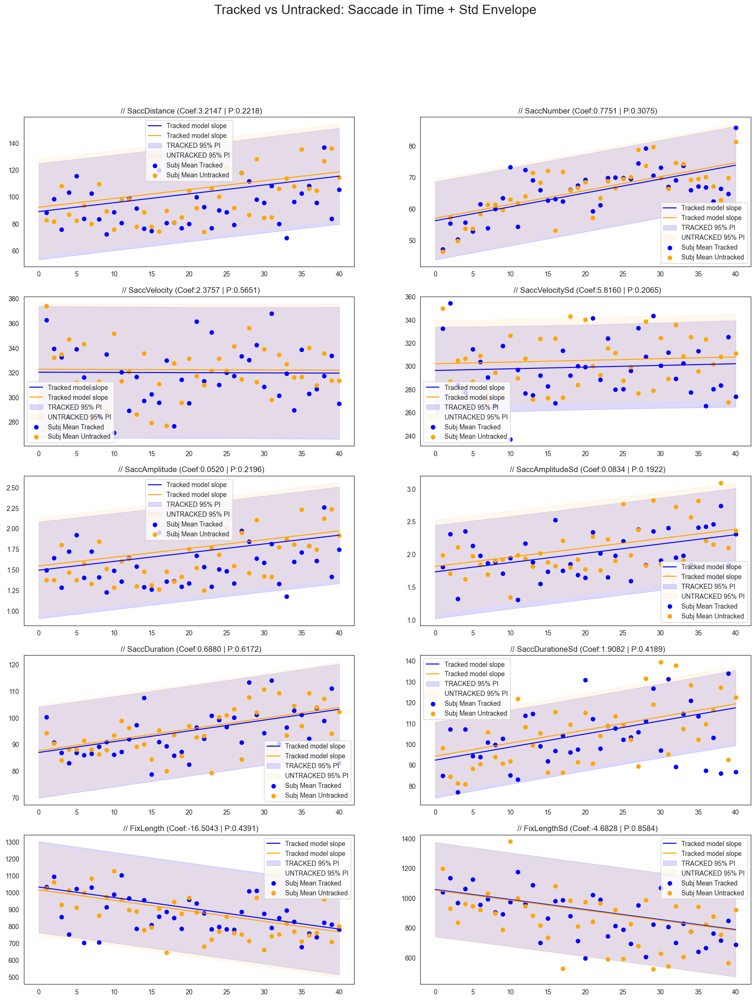

In [ ]:
import statsmodels.formula.api as smf
models = []

fig, axes = plt.subplots(5,2,figsize=(20,24))
fig.suptitle("Tracked vs Untracked: Saccade in Time + Std Envelope",fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
log_file.write("\n(1.9.1) Saccade vs Tracking (Saccade ~ Tracking +TrialNum +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Saccades'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Saccades {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Saccades'][ind[0]][ind[1]], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking'], grand_df['MW_Estimate']]).T
    currentDf.columns = ['Saccade', 'DS', 'trialNum', 'Tracking','MW_Estimate']
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    
    
    # Clean the data
    currentDf = currentDf.dropna(subset=['Saccade', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Saccade'] = pd.to_numeric(currentDf['Saccade'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Saccade'] - currentDf['Saccade'].mean() <3*currentDf['Saccade'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Saccade ~ Tracking + trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    print(m.summary())  # ≈ summary(lm(...)) in R

    
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")
    
    coefs.append(m.params[m.params.keys()[1]])
    zvals.append(m.tvalues[m.params.keys()[1]])
    pvals.append(m.pvalues[m.params.keys()[1]])
    conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

    coefsT.append(m.params[m.params.keys()[2]])
    zvalsT.append(m.tvalues[m.params.keys()[2]])
    pvalsT.append(m.pvalues[m.params.keys()[2]])
    conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])
    indx.append("Saccade")
    eye.append(ind[0])
    analysis.append(ind[1])

    plotTrialTrack(m,"Saccade",currentDf,axes[i],titl=f" {ind[0]} // {ind[1]} (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})")

plt.savefig(os.path.join(statPath,f"SaccadevsTracking_Unc_{est}_{exclusionName}.png"))

#### (1.9.2) Saccades vs Mind Wandering



======== Test MW vs Saccades  // SaccDistance =======

              Mixed Linear Model Regression Results
Model:                MixedLM    Dependent Variable:    Saccade   
No. Observations:     1005       Method:                REML      
No. Groups:           26         Scale:                 1726.4457 
Min. group size:      9          Log-Likelihood:        -5231.8336
Max. group size:      40         Converged:             Yes       
Mean group size:      38.7                                        
------------------------------------------------------------------
                       Coef.   Std.Err.   z   P>|z| [0.025  0.975]
------------------------------------------------------------------
Intercept               89.913   18.299 4.914 0.000 54.048 125.779
Tracking[T.UNTRACKED]    2.340    2.640 0.886 0.375 -2.834   7.514
MW_Estimate              3.827    1.342 2.852 0.004  1.197   6.456
trialNum                 0.633    0.114 5.546 0.000  0.409   0.856
DS Var              

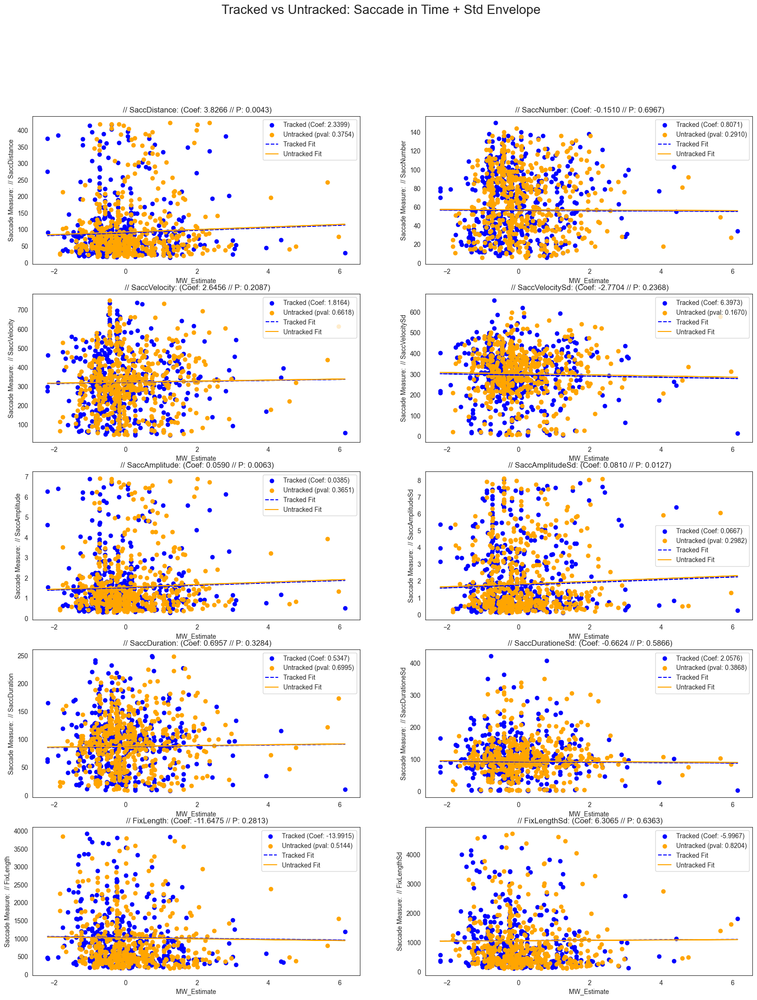

In [ ]:
import statsmodels.formula.api as smf
models = []

import matplotlib.pyplot as plt
from analysisFunctions import plot_pupil_vs_mw
fig, axes = plt.subplots(5, 2, figsize=(20, 24))  # Adjust rows/columns as needed
fig.suptitle("Tracked vs Untracked: Saccade in Time + Std Envelope", fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
currentModels =[];

log_file.write("\n(1.9.2) Saccades vs MW (Saccade ~ MW +Tracking +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Saccades'].columns):
    print("\n\n=============================================================")
    print(f"======== Test MW vs Saccades {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Saccades'][ind[0]][ind[1]], grand_df['MW_Estimate'], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking']]).T
    currentDf.columns = ['Saccade','MW_Estimate', 'DS', 'trialNum', 'Tracking']

    currentDf['MW_Estimate'] = pd.to_numeric(currentDf['MW_Estimate'], errors='coerce')   # <─ add this
    # Clean the data
    currentDf = currentDf.dropna(subset=['Saccade','MW_Estimate', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Saccade'] = pd.to_numeric(currentDf['Saccade'], errors='coerce')  # Ensure numeric
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Saccade'] - currentDf['Saccade'].mean() <3*currentDf['Saccade'].std()]
    # Fit the mixed effects model
    m = smf.mixedlm("Saccade ~ MW_Estimate +Tracking  +trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    currentModels.append(m)
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      MW Estimate Effect     (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")

    coefs.append(m.params[m.params.keys()[2]])
    zvals.append(m.tvalues[m.params.keys()[2]])
    pvals.append(m.pvalues[m.params.keys()[2]])
    conf1.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[2]][1])

    coefsT.append(m.params[m.params.keys()[3]])
    zvalsT.append(m.tvalues[m.params.keys()[3]])
    pvalsT.append(m.pvalues[m.params.keys()[3]])
    conf1T.append(m.conf_int().loc[m.params.keys()[3]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[3]][1])

    indx.append("Saccade x MW")
    eye.append(ind[0])
    analysis.append(ind[1])

    print(m.summary())  # ≈ summary(lm(...)) in R
    plot_pupil_vs_mw(m, currentDf, ind, ax=axes[i],meas='Saccade')
plt.savefig(os.path.join(statPath,f"SaccadevsMW_Unc_{est}_{exclusionName}.png"))

#### (1.9.3) Blink vs Tracking/Untracking



======== Test for Blinks  // BlinkNumber =======

              Mixed Linear Model Regression Results
Model:               MixedLM    Dependent Variable:    Blinks    
No. Observations:    1034       Method:                REML      
No. Groups:          26         Scale:                 29.6898   
Min. group size:     35         Log-Likelihood:        -3298.6361
Max. group size:     40         Converged:             Yes       
Mean group size:     39.8                                        
-----------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept              19.137    3.502  5.464 0.000 12.273 26.002
Tracking[T.UNTRACKED]   0.619    0.339  1.826 0.068 -0.045  1.283
trialNum                0.179    0.015 12.192 0.000  0.151  0.208
DS Var                315.081   16.591                           



======== Test for Blinks  // BlinkR

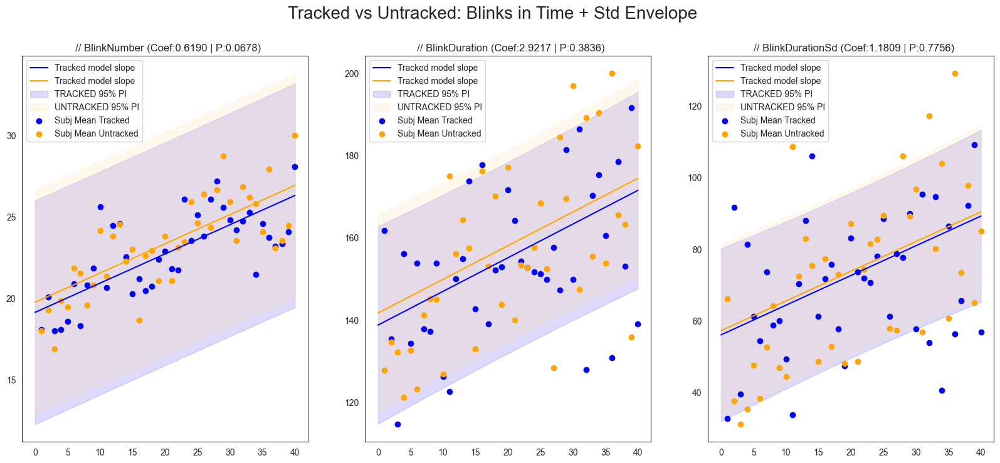

In [ ]:
import statsmodels.formula.api as smf
models = []

fig, axes = plt.subplots(1,3,figsize=(20,8))
fig.suptitle("Tracked vs Untracked: Blinks in Time + Std Envelope",fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
log_file.write("\n(1.9.1) Blinks vs Tracking (Blinks ~ Tracking +TrialNum +(1|Subjects)) \n")

mcount = -1;
for i, ind in enumerate(grand_df['Blinks'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Blinks {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")
    if ind[1] == 'BlinkRate':
        continue
    mcount += 1
    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Blinks'][ind[0]][ind[1]], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking'], grand_df['MW_Estimate']]).T
    currentDf.columns = ['Blinks', 'DS', 'trialNum', 'Tracking','MW_Estimate']
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    
    
    # Clean the data
    currentDf = currentDf.dropna(subset=['Blinks', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Blinks'] = pd.to_numeric(currentDf['Blinks'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Blinks'] - currentDf['Blinks'].mean() <3*currentDf['Blinks'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Blinks ~ Tracking + trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    print(m.summary())  # ≈ summary(lm(...)) in R

    
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")
    
    coefs.append(m.params[m.params.keys()[1]])
    zvals.append(m.tvalues[m.params.keys()[1]])
    pvals.append(m.pvalues[m.params.keys()[1]])
    conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

    coefsT.append(m.params[m.params.keys()[2]])
    zvalsT.append(m.tvalues[m.params.keys()[2]])
    pvalsT.append(m.pvalues[m.params.keys()[2]])
    conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])
    indx.append("Blinks")
    eye.append(ind[0])
    analysis.append(ind[1])

    plotTrialTrack(m,"Blinks",currentDf,axes[mcount],titl=f" {ind[0]} // {ind[1]} (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})")

plt.savefig(os.path.join(statPath,f"BlinksvsTracking_Unc_{est}_{exclusionName}.png"))

#### (1.9.4) Blink vs Mind Wandering



======== Test MW vs Blinks  // BlinkNumber =======

              Mixed Linear Model Regression Results
Model:               MixedLM    Dependent Variable:    Blinks    
No. Observations:    1034       Method:                REML      
No. Groups:          26         Scale:                 29.7164   
Min. group size:     35         Log-Likelihood:        -3299.4225
Max. group size:     40         Converged:             Yes       
Mean group size:     39.8                                        
-----------------------------------------------------------------
                       Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------
Intercept              19.150    3.503  5.467 0.000 12.285 26.015
Tracking[T.UNTRACKED]   0.607    0.341  1.781 0.075 -0.061  1.276
MW_Estimate             0.055    0.173  0.316 0.752 -0.284  0.394
trialNum                0.179    0.015 12.135 0.000  0.150  0.208
DS Var                315.080   16.5

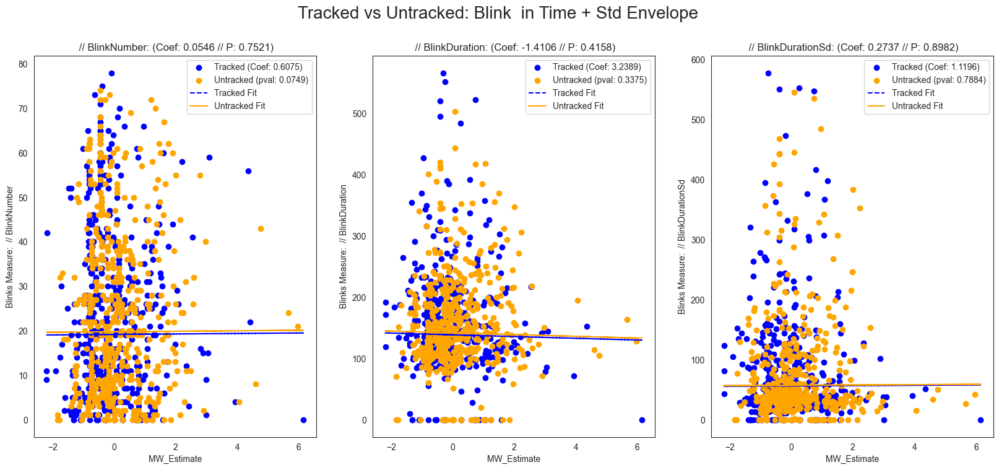

In [ ]:
import statsmodels.formula.api as smf
models = []

import matplotlib.pyplot as plt
from analysisFunctions import plot_pupil_vs_mw
fig, axes = plt.subplots(1, 3, figsize=(20, 8))  # Adjust rows/columns as needed
fig.suptitle("Tracked vs Untracked: Blink  in Time + Std Envelope", fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
currentModels =[];

log_file.write("\n(1.9.2) Blinks vs MW (Blinks ~ MW +Tracking +(1|Subjects)) \n")
mcount = -1
for i, ind in enumerate(grand_df['Blinks'].columns):
    print("\n\n=============================================================")
    print(f"======== Test MW vs Blinks {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")
    if ind[1] == 'BlinkRate':
        continue
    mcount += 1
    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([grand_df['Blinks'][ind[0]][ind[1]], grand_df['MW_Estimate'], grand_df['DS'], grand_df['trialNum'], grand_df['Tracking']]).T
    currentDf.columns = ['Blinks','MW_Estimate', 'DS', 'trialNum', 'Tracking']

    currentDf['MW_Estimate'] = pd.to_numeric(currentDf['MW_Estimate'], errors='coerce')   # <─ add this
    # Clean the data
    currentDf = currentDf.dropna(subset=['Blinks','MW_Estimate', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Blinks'] = pd.to_numeric(currentDf['Blinks'], errors='coerce')  # Ensure numeric
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Blinks'] - currentDf['Blinks'].mean() <3*currentDf['Blinks'].std()]
    # Fit the mixed effects model
    m = smf.mixedlm("Blinks ~ MW_Estimate +Tracking  +trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    currentModels.append(m)
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      MW Estimate Effect     (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")

    coefs.append(m.params[m.params.keys()[2]])
    zvals.append(m.tvalues[m.params.keys()[2]])
    pvals.append(m.pvalues[m.params.keys()[2]])
    conf1.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[2]][1])

    coefsT.append(m.params[m.params.keys()[3]])
    zvalsT.append(m.tvalues[m.params.keys()[3]])
    pvalsT.append(m.pvalues[m.params.keys()[3]])
    conf1T.append(m.conf_int().loc[m.params.keys()[3]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[3]][1])

    indx.append("Blinks x MW")
    eye.append(ind[0])
    analysis.append(ind[1])

    print(m.summary())  # ≈ summary(lm(...)) in R
    plot_pupil_vs_mw(m, currentDf, ind, ax=axes[mcount],meas='Blinks')
plt.savefig(os.path.join(statPath,f"BlinksvsMW_Unc_{est}_{exclusionName}.png"))

#### Save Our First Data

In [ ]:

def write_sheet(all_stats, sheet_name, writer,checkCol="P"):
    # write without merged cells so row/col positions are predictable
    all_stats.to_excel(writer, sheet_name=sheet_name, merge_cells=False)

    # bold entire row when P <= 0.05 (xlsxwriter uses 0-based rows)
    wb = writer.book
    ws = writer.sheets[sheet_name]
    bold = wb.add_format({"bold": True})
    start_row = 1  # first data row (row 0 is header)
    for r, pval in enumerate(all_stats[checkCol], start=start_row):
        try:
            if pd.notna(pval) and float(pval) <= 0.05:
                ws.set_row(r, None, bold)
        except Exception:
            pass
# Create a MultiIndex DataFrame and Save All Our Data 

index = pd.MultiIndex.from_arrays([ indx, eye, analysis], names=['Analysis Name', 'Eye', 'Mode'])
stats_df = pd.DataFrame({('Main','Coefficient'): coefs,  ('Main','Z-score'): zvals ,('Main','p-value'): pvals,('Main','conf1'):conf1,('Main','conf2'):conf2,
                         ('Trial','Coefficient'): coefsT,  ('Trial','Z-score'): zvalsT ,('Trial','p-value'): pvalsT,('Trial','conf1'):conf1T,('Trial','conf2'):conf2T}, index=index)

with pd.ExcelWriter(os.path.join(statPath,f"statistics_unc_{est}_{exclusionName}.xlsx"), engine="xlsxwriter") as writer:
    write_sheet(stats_df, writer=writer, sheet_name="All_Stats",checkCol=("Main","p-value"))


## (2) CORRECTED: Test Is Tracked Entity Different from Untracked Entity?

Since there are some trials and subjects that are clearly Unreliable, we can exclude them based on preordained criteria:

(WARNING it may be relevant only for Pupil Diameter dependent measures )

- Those that No-Pupi Events (Blinks, Outside of the screen) have not been more than 10%
- Those that General No screen + Clustering have not been 75%
- Those in which Pupil Period is not contaminated by Measurments and the rate of artefacts is less than 0.05

#### (1.1) Test Whether Pupil Diameter Differs between Tracked and Untracked Entity: 

We controll immediatley for SUBJECTS

so Making Basic Models:

        MW_estimate ~ Tracking +trialNum + (1|Subjects)


Additionally we plot the Envelope of STD from subjects as well as provide the Mean differs across subjects of MW Both in TIme as in Absolute:

Important here to check:
+ Whether there is a difference between Tracked and Untracked Entity
+ Whether there is an Effect of Trial Number (As MW Rate should increase in time)

In [ ]:

from analysisFunctions import qualityChecks
partiaclCheck0 = grand_df[grand_df['Checks']['']['gazeRate'] <0.20]
partiaclCheck1L,partiaclCheck2L,trmw1L,untrmw1L,trmw2L,untrmw2L =  qualityChecks(partiaclCheck0,'Left')
partiaclCheck1R,partiaclCheck2R,trmw1R,untrmw1R,trmw2R,untrmw2R =  qualityChecks(partiaclCheck0,'Right')

mw = grand_df[grand_df['Tracking'] == 'TRACKED'].groupby(['Tracking','DS'])
umw = grand_df[grand_df['Tracking'] == 'UNTRACKED'].groupby(['Tracking','DS'])

trmw = partiaclCheck0[partiaclCheck0['Tracking']=="TRACKED"].groupby(['Tracking','DS'])
untrmw  = partiaclCheck0[partiaclCheck0['Tracking']=="UNTRACKED"].groupby(['Tracking','DS'])


log_file.write("\n===# CHECKS #=== \n\n")
log_file.write(f"   Gaze Rate Rej Threshold:      {0.1*100}%\n")
log_file.write(f"      N. After Removal:           (Tr: {int(trmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")
log_file.write(f"   Left NaN Rej Threshold:       {0.1*100}%\n")
log_file.write(f"      N. After Removal:           (Tr: {int(trmw1L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw1L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")
log_file.write(f"   Right NaN Rej Threshold:      {0.1*100}%\n")
log_file.write(f"      N. After Removal:           (Tr: {int(trmw1R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw1R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")
log_file.write(f"   Left Pup NaN Rej Threshold:   {0.1*100}%\n")
log_file.write(f"      N. After Removal:           (Tr: {int(trmw2L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw2L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")
log_file.write(f"   Right Pup NaN Rej Threshold:  {0.1*100}%\n\n")
log_file.write(f"      N. After Removal:           (Tr: {int(trmw2R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw2R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")

print(f"   Gaze Rate Rej Threshold:      {0.1*100}%")
print(f"      N. After Removal:           (Tr: {int(trmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )")
print(f"   NaN Rej Threshold:            {0.751*100}%")
print(f"      N. After Removal:           (Tr: {int(trmw1L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw1L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )")
print(f"      N. After Removal:           (Tr: {int(trmw1R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw1R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )")
print(f"   Pup NaN Rej Threshold:        {0.95*100}%")
print(f"      N. After Removal:           (Tr: {int(trmw2L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw2L.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )")
print(f"      N. After Removal:           (Tr: {int(trmw2R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw2R.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")


for i,ds in enumerate(grand_df['DS'].unique()):
    print(i)
    log_file.write(f"\n  ={ds}= \n\n")
    log_file.write(f"      N. good Trials            {len(np.unique(partiaclCheck0[partiaclCheck0['DS'] == ds]['trialNum']))}\n")
    log_file.write(f"      N. of NaN Trials:         {np.sum(grand_df[grand_df['DS'] ==ds]['Pupil_Diameter']['Mean']['Left_Eye'].isna())}/{len(grand_df[grand_df['DS'] == ds])}\n")
    log_file.write(f"      Mean Good Left:           {grand_df[grand_df['DS'] == ds]['Checks']['']['goodRatioLeft'].mean():3.3f} ({grand_df[grand_df['DS'] == ds]['Checks']['']['goodRatioLeft'].std():3.3f})\n")
    log_file.write(f"      Mean Good Right:          {grand_df[grand_df['DS'] == ds]['Checks']['']['goodRatioRight'].mean():3.3f} ({grand_df[grand_df['DS'] == ds]['Checks']['']['goodRatioRight'].std():3.3f})\n")
    log_file.write(f"      Mean Good Pup Right:      {grand_df[grand_df['DS'] == ds]['Checks']['']['goodPupRatioLeft'].mean():3.3f} ({grand_df[grand_df['DS'] == ds]['Checks']['']['goodPupRatioLeft'].std():3.3f})\n")
    log_file.write(f"      Mean Good Pup Right:      {grand_df[grand_df['DS'] == ds]['Checks']['']['goodPupRatioRight'].mean():3.3f} ({grand_df[grand_df['DS'] == ds]['Checks']['']['goodPupRatioRight'].std():3.3f})\n")
    log_file.write(f"      Mean non Gaze Rate:       {grand_df[grand_df['DS'] == ds]['Checks']['']['gazeRate'].mean():3.3f} ({grand_df[grand_df['DS'] == ds]['Checks']['']['gazeRate'].std():3.3f})\n")
    log_file.write(f"      Mean R/L Pupil Diff:      {grand_df[grand_df['DS'] == ds]['Checks']['']['pupilDiff'].mean():3.3f} ({grand_df[grand_df['DS'] == ds]['Checks']['']['pupilDiff'].std():3.3f})\n")





C:\Users\barak\AppData\Local\Temp\ipykernel_79644\70090207.py:15: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  log_file.write(f"      N. After Removal:           (Tr: {int(trmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")
C:\Users\barak\AppData\Local\Temp\ipykernel_79644\70090207.py:15: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  log_file.write(f"      N. After Removal:           (Tr: {int(trmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(mw.count().sum().loc['MW_Estimate'].iloc[0])} || Untr: {int(untrmw.count().sum().loc['MW_Estimate'].iloc[0])}/{int(umw.count().sum().loc['MW_Estimate'].iloc[0])} )\n")
C:\Users\barak\AppData\Local\Temp\ipykernel_79644\70090207.py:15: PerformanceWar

   Gaze Rate Rej Threshold:      10.0%
      N. After Removal:           (Tr: 568/579 || Untr: 561/579 )
   NaN Rej Threshold:            75.1%
      N. After Removal:           (Tr: 568/579 || Untr: 561/579 )
      N. After Removal:           (Tr: 568/579 || Untr: 561/579 )
   Pup NaN Rej Threshold:        95.0%
      N. After Removal:           (Tr: 421/579 || Untr: 422/579 )
      N. After Removal:           (Tr: 421/579 || Untr: 422/579 )

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28


In [ ]:
partiaclCheck0

MW_Estimate GazeDifference Pupil_Diameter                                \
                                          Mean                 Std             
                                      Left_Eye Right_Eye  Left_Eye Right_Eye   
0       0.788517      18.101889      -0.103120 -0.109114  0.047323  0.062290   
1       1.961518      22.222548      -0.158326 -0.155978  0.075676  0.101594   
2      -0.123817      27.139951      -0.502426 -0.494871  0.050259  0.058449   
3       1.179518      29.549453       0.115806  0.080705  0.054622  0.068420   
4      -1.166484      23.759388       0.236644  0.261647  0.043348  0.052436   
...          ...            ...            ...       ...       ...       ...   
1235    2.396204      58.504876       0.182832  0.154193  0.011103  0.012642   
1236    0.101248      47.530693       0.295220  0.235178  0.023395  0.020739   
1237    1.518721      34.711861      -0.325025 -0.239333  0.016567  0.014852   
1238    0.776235      64.811923       0.491732  0.469421  0.004788  0.004570   
1239    0.506240      45.357810       0.150677  0.102697  0.009355  0.005881   

                                                  ...          Blinks  \
          diff                   auc              ...                   
      Left_Eye Right_Eye    Left_Eye   Right_Eye  ... BlinkDurationSd   
0    -0.014033 -0.033033 -127.457307 -121.984577  ...        0.000000   
1    -0.002367  0.064700 -196.102017 -174.828924  ...        4.109609   
2    -0.617938 -0.537224 -621.752195 -553.934958  ...       37.553162   
3     0.163267  0.126867  143.295039   90.335311  ...        7.000000   
4     0.868477  0.920932  292.851907  292.825225  ...        2.000000   
...        ...       ...         ...         ...  ...             ...   
1235  0.277055  0.226560  226.316560  172.695939  ...       25.000000   
1236 -0.252900 -0.219733  365.511032  263.403824  ...        0.000000   
1237 -0.110633 -0.108300 -402.090435 -267.828856  ...       25.350871   
1238  0.510733  0.347800  608.515815  525.473143  ...        0.000000   
1239  0.350633  0.281500  186.522909  115.028127  ...        0.000000   

           Gaze                                                         \
           mean                                         std              
          LeftX     RightX      LeftY     RightY      LeftX     RightX   
0     -5.180038   1.430879  13.640607  12.334918  21.956711  37.227858   
1      4.979870   3.231624  24.761804  16.123034  24.331118  31.999294   
2      2.827393   7.822771  26.770444  14.884055  26.600568  35.130628   
3      2.337945  13.273565  24.235699  11.049062  17.384414  39.034364   
4     11.875938   8.239643  32.495445  16.842053  23.441960  31.770694   
...         ...        ...        ...        ...        ...        ...   
1235  49.759927   5.789413   8.192781 -12.928598  86.163109  82.211977   
1236  59.669087  19.761543  17.059959  -3.551375  24.702066  33.964808   
1237  58.059869  19.867823   2.632861  -0.222344  61.589897  67.468466   
1238  55.260116   6.920000  18.380610  11.848947  14.567815  39.044223   
1239  61.005148  17.343731  15.864174   0.076092  26.828689  26.785697   

                             Subject  
                                      
          LeftY     RightY            
0     84.893609  65.579048  AGKO2706  
1     82.936829  61.908959  AGKO2706  
2     82.124156  55.709345  AGKO2706  
3     76.592304  64.854248  AGKO2706  
4     77.031041  52.057982  AGKO2706  
...         ...        ...       ...  
1235  85.399931  77.543223  ZURY1007  
1236  38.058904  30.402958  ZURY1007  
1237  83.464941  80.051645  ZURY1007  
1238  29.971249  34.259437  ZURY1007  
1239  24.010375  23.205997  ZURY1007  

[1129 rows x 46 columns]

             Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   MW_Estimate
No. Observations:    1129      Method:               REML       
No. Groups:          29        Scale:                0.8957     
Min. group size:     26        Log-Likelihood:       -1548.0304 
Max. group size:     40        Converged:            Yes        
Mean group size:     38.9                                       
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept             -0.488    0.064 -7.666 0.000 -0.612 -0.363
Tracking[T.UNTRACKED]  0.323    0.056  5.731 0.000  0.212  0.433
trialNum               0.015    0.002  6.123 0.000  0.010  0.020
DS Var                 0.000                                    



c:\Users\barak\Documents\GitHub\startegicMW_lite\Experiment\analysis\analysisFunctions.py:1964: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  ax.scatter(grTr.mean().loc[firstContrast].index,grTr.mean().loc[firstContrast],label="Subj Mean Tracked",color = 'blue')


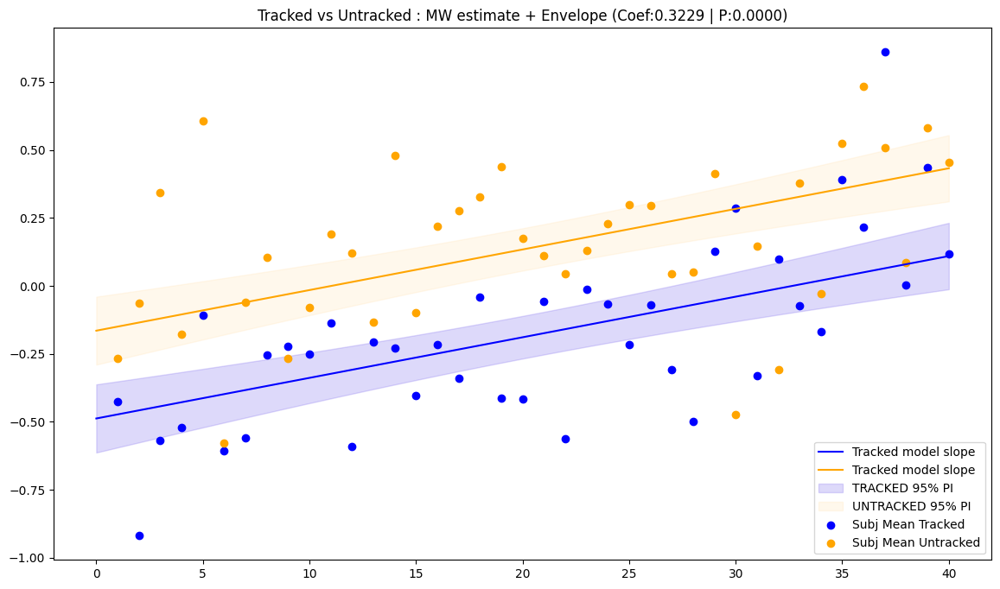

In [ ]:
### Current Subject Specfic Checks: 
# 1)


import statsmodels.formula.api as smf

m = smf.mixedlm("MW_Estimate ~ Tracking+ trialNum ", data=partiaclCheck0[['DS','trialNum','Tracking','MW_Estimate']],
                groups="DS",          # random intercept
               # re_formula="~Tracking",         # adds random slope

               ).fit()
print(m.summary())   


log_file.write("\n===# (1) Uncorrected Samples #=== \n\n")
log_file.write("(1.1) Uncorrected Samples (MW ~ Tracking +TrialNum +(1|Subjects)) \n")

log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")

coefs.append(m.params[m.params.keys()[1]])
zvals.append(m.tvalues[m.params.keys()[1]])
pvals.append(m.pvalues[m.params.keys()[1]])
conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

coefsT.append(m.params[m.params.keys()[2]])
zvalsT.append(m.tvalues[m.params.keys()[2]])
pvalsT.append(m.pvalues[m.params.keys()[2]])
conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])

indx.append("MW Estimate Corr")
eye.append('')
analysis.append('Tracking')

fig, ax = plt.subplots(figsize=(14, 8))
plotTrialTrack(m,'MW_Estimate',partiaclCheck0,ax,titl=f"Tracked vs Untracked : MW estimate + Envelope (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})" )
plt.savefig(os.path.join(statPath,f"MWvsUntracked_corr_{est}_{exclusionName}.png"))

In [ ]:
partiaclCheck0= partiaclCheck0[partiaclCheck0["DS"] != 'DS17']

C:\Users\barak\AppData\Local\Temp\ipykernel_79644\2169269063.py:53: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  ax.scatter(grTr.mean().loc[firstContrast].index,grTr.mean().loc[firstContrast],label="Subj Mean Tracked",color = 'blue')


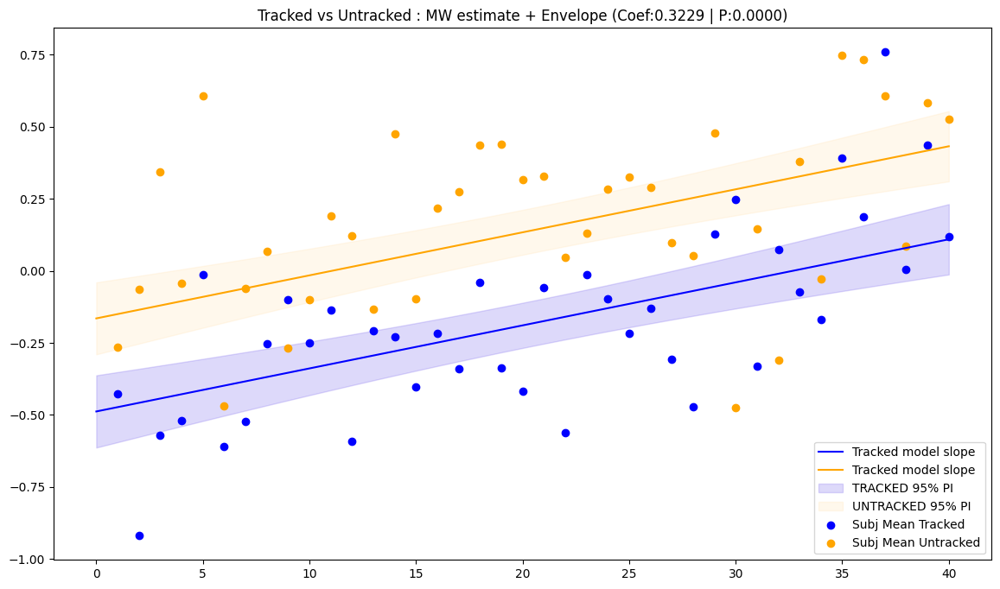

In [ ]:

paramNum = [0,1,2]
anlysisName = 'Tracking'
firstContrast = 'TRACKED'
lastContrast = 'UNTRACKED'
name = 'MW_Estimate'
fig, ax = plt.subplots(figsize=(14, 8))

titl = ''f"Tracked vs Untracked : MW estimate + Envelope (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})"
### QUick Linear Model 
quick_untracked_lm = lambda x: m.params[m.params.keys()[paramNum[0]]] + m.params[m.params.keys()[paramNum[1]]]+m.params[m.params.keys()[paramNum[2]]]*x 
quick_tracked_lm = lambda x: m.params[m.params.keys()[paramNum[0]]] + m.params[m.params.keys()[paramNum[2]]]*x

trialN = np.linspace(0,len(np.unique(grand_df['trialNum'])),len(np.unique(grand_df['trialNum']))+1);
mw_est_utr = pd.Series(trialN).apply(quick_untracked_lm)
mw_est_tr = pd.Series(trialN).apply(quick_tracked_lm)

ax.set_title(titl)
ax.plot(trialN,mw_est_tr,label="Tracked model slope",color="blue")
ax.plot(trialN,mw_est_utr,label="Tracked model slope",color="orange")
grTr = grand_df[[name,'trialNum',anlysisName]].groupby([anlysisName,'trialNum'])
from scipy.stats import t

# --- pieces from the fitted model ---
Vbeta  = m.cov_params().loc[m.params.index, m.params.index]  # Cov(beta)
tval   = t.ppf(0.975, df=m.df_resid)                         # 95% PI; change if needed

# --- build X matrices consistent with your lambdas: [1, Tracking, trialNum] ---
pnames = list(m.params.index)                # keeps exact column order used by model
col = {name:i for i, name in enumerate(pnames)}

def build_X(tracking): # Build simple model matrix (for tracked and untracked separately)
    X = np.zeros((len(trialN), len(pnames)))
    # these names match the terms in your formula
    X[:, col.get('Intercept', 0)] = 1.0
    if 'Tracking[T.UNTRACKED]' in col: X[:, col['Tracking[T.UNTRACKED]']] = tracking
    if 'trialNum' in col: X[:, col['trialNum']] = trialN
    return X

X_tr  = build_X(1.0)   # tracked
X_un  = build_X(0.0)   # untracked
# --- se of mean and se of prediction at each trial ---
se_mean_tr = np.sqrt(np.einsum('ij,jk,ik->i', X_tr, Vbeta.values, X_tr))
se_mean_un = np.sqrt(np.einsum('ij,jk,ik->i', X_un, Vbeta.values, X_un))


# --- add ribbons using your lambdas' fitted lines ---
ax.fill_between(trialN, mw_est_tr  - tval*se_mean_tr, mw_est_tr  + tval*se_mean_tr,
                color='mediumslateblue', alpha=0.25, label='TRACKED 95% PI')
ax.fill_between(trialN, mw_est_utr - tval*se_mean_un, mw_est_utr + tval*se_mean_un,
            color='moccasin', alpha=0.25, label='UNTRACKED 95% PI')


ax.scatter(grTr.mean().loc[firstContrast].index,grTr.mean().loc[firstContrast],label="Subj Mean Tracked",color = 'blue')
ax.scatter(grTr.mean().loc[lastContrast].index,grTr.mean().loc[lastContrast],label="Subj Mean Untracked",color = 'orange')
ax.set_xlabel="Trial Number"
ax.legend()
plt.show()

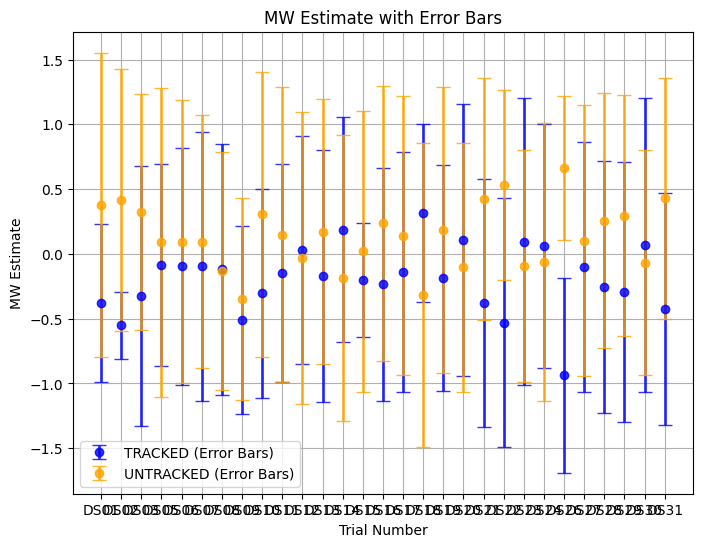

In [ ]:
mew2 = partiaclCheck0[partiaclCheck0['Tracking'] == 'TRACKED'][['DS','MW_Estimate']].groupby(['DS'])
ume2 = partiaclCheck0[partiaclCheck0['Tracking'] == 'UNTRACKED'][['DS','MW_Estimate']].groupby(['DS'])


plt.figure(figsize=(8, 6))

# Plot for TRACKED group
plt.errorbar(mew2.mean().index, 
             mew2.mean()['MW_Estimate'].values, 
             yerr=mew2.std()['MW_Estimate'].values, 
             fmt='o', color='blue', label='TRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Plot for UNTRACKED group
plt.errorbar(ume2.mean().index, 
             ume2.mean()['MW_Estimate'].values, 
             yerr=ume2.std()['MW_Estimate'].values, 
             fmt='o', color='orange', label='UNTRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Add labels, legend, and title
plt.xlabel('Trial Number')
plt.ylabel('MW Estimate')
plt.title('MW Estimate with Error Bars')
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig(os.path.join(statPath,f"MWacrossSubj_Corr_{est}_{exclusionName}.png"))



======== Test for Pupil Diameter Mean // Left_Eye =======

             Mixed Linear Model Regression Results
Model:                 MixedLM    Dependent Variable:    Pupil  
No. Observations:      835        Method:                REML   
No. Groups:            29         Scale:                 0.0537 
Min. group size:       12         Log-Likelihood:        18.4692
Max. group size:       39         Converged:             Yes    
Mean group size:       28.8                                     
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept             -0.049    0.019 -2.592 0.010 -0.086 -0.012
Tracking[T.UNTRACKED]  0.002    0.016  0.127 0.899 -0.029  0.034
trialNum               0.001    0.001  1.363 0.173 -0.000  0.002
DS Var                 0.001    0.003                           



======== Test for Pupil Diameter Mean //

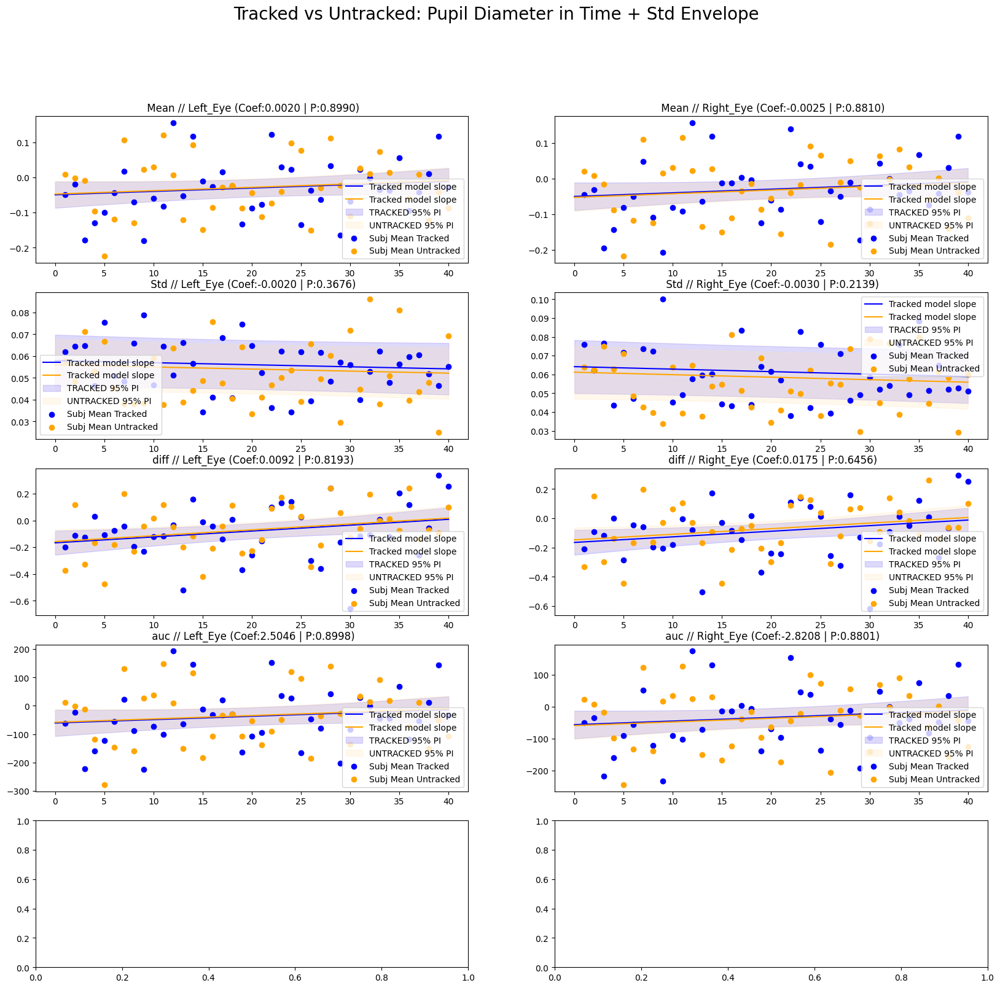

In [ ]:
import statsmodels.formula.api as smf
models = []


fig, axes = plt.subplots(5,2,figsize=(20,18))
fig.suptitle("Tracked vs Untracked: Pupil Diameter in Time + Std Envelope",fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes
log_file.write("\n(1.2) Pupil Diameter vs Tracking (Pupil ~ Tracking +TrialNum +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Pupil_Diameter'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Pupil Diameter {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")


    if ind[1] == "Right_Eye":
        currentCheck = partiaclCheck2R;
    else:
        currentCheck = partiaclCheck2L;

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([currentCheck['Pupil_Diameter'][ind[0]][ind[1]], currentCheck['DS'], currentCheck['trialNum'], currentCheck['Tracking']]).T
    currentDf.columns = ['Pupil', 'DS', 'trialNum', 'Tracking']
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    

    # Clean the data
    currentDf = currentDf.dropna(subset=['Pupil', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Pupil'] = pd.to_numeric(currentDf['Pupil'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Pupil'] - currentDf['Pupil'].mean()<3*currentDf['Pupil'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Pupil ~ Tracking + trialNum", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
    print(m.summary())  # ≈ summary(lm(...)) in R
    coefs.append(m.params[m.params.keys()[1]])
    zvals.append(m.tvalues[m.params.keys()[1]])
    pvals.append(m.pvalues[m.params.keys()[1]])
    conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

    coefsT.append(m.params[m.params.keys()[2]])
    zvalsT.append(m.tvalues[m.params.keys()[2]])
    pvalsT.append(m.pvalues[m.params.keys()[2]])
    conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])
    indx.append("Pupil Diam Corr")
    eye.append(ind[0])
    analysis.append(ind[1])
    
    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")


    plotTrialTrack(m,"Pupil",currentDf,axes[i],titl=f" {ind[0]} // {ind[1]} (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})")

plt.savefig(os.path.join(statPath,f"PupilvsTracking_Corr_{est}_{exclusionName}.png" ))



======== Test for Pupil Diameter Mean // Left_Eye =======

        Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: Pupil  
No. Observations:  835     Method:             REML   
No. Groups:        29      Scale:              0.0538 
Min. group size:   12      Log-Likelihood:     23.3912
Max. group size:   39      Converged:          Yes    
Mean group size:   28.8                               
------------------------------------------------------
            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   -0.029    0.010 -2.962 0.003 -0.048 -0.010
MW_Estimate -0.005    0.009 -0.543 0.587 -0.022  0.012
DS Var       0.001    0.003                           



======== Test for Pupil Diameter Mean // Right_Eye =======

        Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: Pupil  
No. Observations:  834     Method:             REML   
No. Groups:   

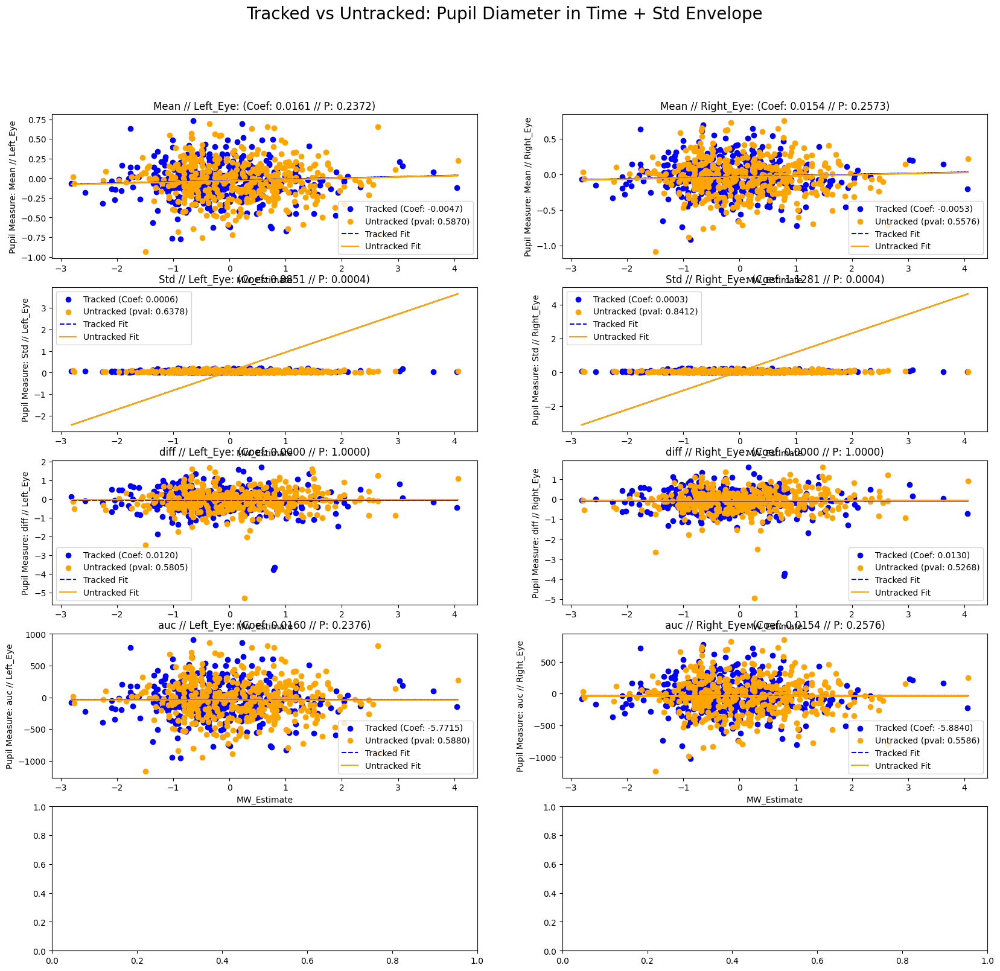

In [ ]:

fig, axes = plt.subplots(5, 2, figsize=(20, 18))  # Adjust rows/columns as needed
fig.suptitle("Tracked vs Untracked: Pupil Diameter in Time + Std Envelope", fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes

log_file.write("\n(1.3) Pupil Diameter vs MW (Pupil ~ MW +Tracking +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Pupil_Diameter'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Pupil Diameter {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")


    if ind[1] == "Right_Eye":
        currentCheck = partiaclCheck2R;
    else:
        currentCheck = partiaclCheck2L;

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([currentCheck['Pupil_Diameter'][ind[0]][ind[1]], currentCheck['MW_Estimate'], currentCheck['DS'], currentCheck['trialNum'], currentCheck['Tracking']]).T
    currentDf.columns = ['Pupil','MW_Estimate', 'DS', 'trialNum', 'Tracking']

    currentDf['MW_Estimate'] = pd.to_numeric(currentDf['MW_Estimate'], errors='coerce')   # <─ add this
    # Clean the data
    currentDf = currentDf.dropna(subset=['Pupil','MW_Estimate', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Pupil'] = pd.to_numeric(currentDf['Pupil'], errors='coerce')  # Ensure numeric
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Pupil'] - currentDf['Pupil'].mean() <3*currentDf['Pupil'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Pupil ~ MW_Estimate ", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
     

    coefs.append(m.params[m.params.keys()[1]])
    zvals.append(m.tvalues[m.params.keys()[1]])
    pvals.append(m.pvalues[m.params.keys()[1]])
    conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

    coefsT.append(m.params[m.params.keys()[2]])
    zvalsT.append(m.tvalues[m.params.keys()[2]])
    pvalsT.append(m.pvalues[m.params.keys()[2]])
    conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])

    indx.append("Pupil x MW corr")
    eye.append(ind[0])
    analysis.append(ind[1])


    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      MW Estimate Effect     (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")

    print(m.summary())  # ≈ summary(lm(...)) in R
    plot_pupil_vs_mw(m, currentDf, ind, ax=axes[i])
plt.savefig(os.path.join(statPath,f"PupilvsMW_Corr_{est}_{exclusionName}.png"))



======== Test for Pupil Diameter Mean // Left_Eye =======

        Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: Pupil  
No. Observations:  835     Method:             REML   
No. Groups:        29      Scale:              0.0538 
Min. group size:   12      Log-Likelihood:     23.3912
Max. group size:   39      Converged:          Yes    
Mean group size:   28.8                               
------------------------------------------------------
            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------
Intercept   -0.029    0.010 -2.962 0.003 -0.048 -0.010
MW_Estimate -0.005    0.009 -0.543 0.587 -0.022  0.012
DS Var       0.001    0.003                           



======== Test for Pupil Diameter Mean // Right_Eye =======

        Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: Pupil  
No. Observations:  834     Method:             REML   
No. Groups:   

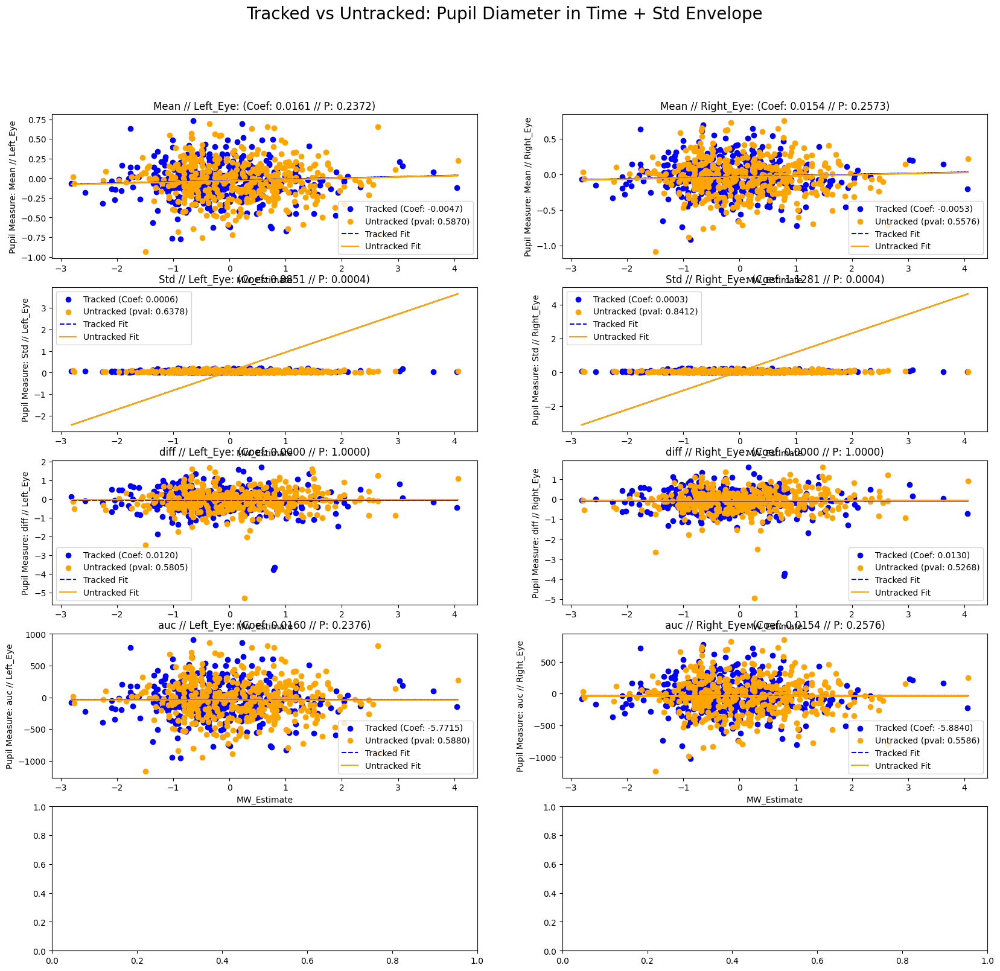

In [ ]:

fig, axes = plt.subplots(5, 2, figsize=(20, 18))  # Adjust rows/columns as needed
fig.suptitle("Tracked vs Untracked: Pupil Diameter in Time + Std Envelope", fontsize=20)
axes = axes.flatten()  # Flatten to easily iterate over axes

log_file.write("\n(1.3) Pupil Diameter vs MW (Pupil ~ MW +Tracking +(1|Subjects)) \n")

for i, ind in enumerate(grand_df['Pupil_Diameter'].columns):
    print("\n\n=============================================================")
    print(f"======== Test for Pupil Diameter {ind[0]} // {ind[1]} =======")
    print("=============================================================\n")


    if ind[1] == "Right_Eye":
        currentCheck = partiaclCheck2R;
    else:
        currentCheck = partiaclCheck2L;

    # Create the DataFrame and transpose it
    currentDf = pd.DataFrame([currentCheck['Pupil_Diameter'][ind[0]][ind[1]], currentCheck['MW_Estimate'], currentCheck['DS'], currentCheck['trialNum'], currentCheck['Tracking']]).T
    currentDf.columns = ['Pupil','MW_Estimate', 'DS', 'trialNum', 'Tracking']

    currentDf['MW_Estimate'] = pd.to_numeric(currentDf['MW_Estimate'], errors='coerce')   # <─ add this
    # Clean the data
    currentDf = currentDf.dropna(subset=['Pupil','MW_Estimate', 'Tracking', 'trialNum'])  # Drop rows with NaN
    currentDf['Pupil'] = pd.to_numeric(currentDf['Pupil'], errors='coerce')  # Ensure numeric
    currentDf['trialNum'] = pd.to_numeric(currentDf['trialNum'], errors='coerce')  # Ensure numeric
    currentDf = currentDf[currentDf['Pupil'] - currentDf['Pupil'].mean() <3*currentDf['Pupil'].std()]

    # Fit the mixed effects model
    m = smf.mixedlm("Pupil ~ MW_Estimate ", data=currentDf,
                    groups="DS",  # Random intercept
                    ).fit()
    
    models.append(m)
     

    coefs.append(m.params[m.params.keys()[1]])
    zvals.append(m.tvalues[m.params.keys()[1]])
    pvals.append(m.pvalues[m.params.keys()[1]])
    conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
    conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

    coefsT.append(m.params[m.params.keys()[2]])
    zvalsT.append(m.tvalues[m.params.keys()[2]])
    pvalsT.append(m.pvalues[m.params.keys()[2]])
    conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
    conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])

    indx.append("Pupil x MW corr")
    eye.append(ind[0])
    analysis.append(ind[1])


    log_file.write(f"    {ind[0]} // {ind[1]}  \n")

    log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
    log_file.write(f"      MW Estimate Effect     (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")

    print(m.summary())  # ≈ summary(lm(...)) in R
    plot_pupil_vs_mw(m, currentDf, ind, ax=axes[i])
plt.savefig(os.path.join(statPath,f"PupilvsMW_Corr_{est}_{exclusionName}.png"))

In [ ]:
m.params.keys()

Index(['Intercept', 'MW_Estimate', 'DS Var'], dtype='object')

In [ ]:


def write_sheet(all_stats, sheet_name, writer,checkCol="P"):
    # write without merged cells so row/col positions are predictable
    all_stats.to_excel(writer, sheet_name=sheet_name, merge_cells=False)

    # bold entire row when P <= 0.05 (xlsxwriter uses 0-based rows)
    wb = writer.book
    ws = writer.sheets[sheet_name]
    bold = wb.add_format({"bold": True})
    start_row = 1  # first data row (row 0 is header)
    for r, pval in enumerate(all_stats[checkCol], start=start_row):
        try:
            if pd.notna(pval) and float(pval) <= 0.05:
                ws.set_row(r, None, bold)
        except Exception:
            pass
# Create a MultiIndex DataFrame and Save All Our Data 

index = pd.MultiIndex.from_arrays([ indx, eye, analysis], names=['Analysis Name', 'Eye', 'Mode'])
stats_df = pd.DataFrame({('Main','Coefficient'): coefs,  ('Main','Z-score'): zvals ,('Main','p-value'): pvals,('Main','conf1'):conf1,('Main','conf2'):conf2,
                         ('Trial','Coefficient'): coefsT,  ('Trial','Z-score'): zvalsT ,('Trial','p-value'): pvalsT,('Trial','conf1'):conf1T,('Trial','conf2'):conf2T}, index=index)

with pd.ExcelWriter(os.path.join(statPath,f"statistics_unc_{est}_{exclusionName}.xlsx"), engine="xlsxwriter") as writer:
    write_sheet(stats_df, writer=writer, sheet_name="All_Stats",checkCol=("Main","p-value"))

log_file.close()

             Mixed Linear Model Regression Results
Model:              MixedLM  Dependent Variable:  GazeDifference
No. Observations:   1034     Method:              REML          
No. Groups:         26       Scale:               445.9432      
Min. group size:    35       Log-Likelihood:      -4673.9898    
Max. group size:    40       Converged:           Yes           
Mean group size:    39.8                                        
----------------------------------------------------------------
                       Coef.  Std.Err.   z   P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept              49.084    5.907 8.309 0.000 37.506 60.661
Tracking[T.UNTRACKED]   0.664    1.314 0.506 0.613 -1.910  3.239
trialNum                0.055    0.057 0.972 0.331 -0.056  0.167
DS Var                849.437   11.669                          



c:\Users\barak\Documents\GitHub\startegicMW_lite\Experiment\analysis\analysisFunctions.py:1959: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  ax.scatter(grTr.mean().loc[firstContrast].index,grTr.mean().loc[firstContrast],label="Subj Mean Tracked",color = 'blue')


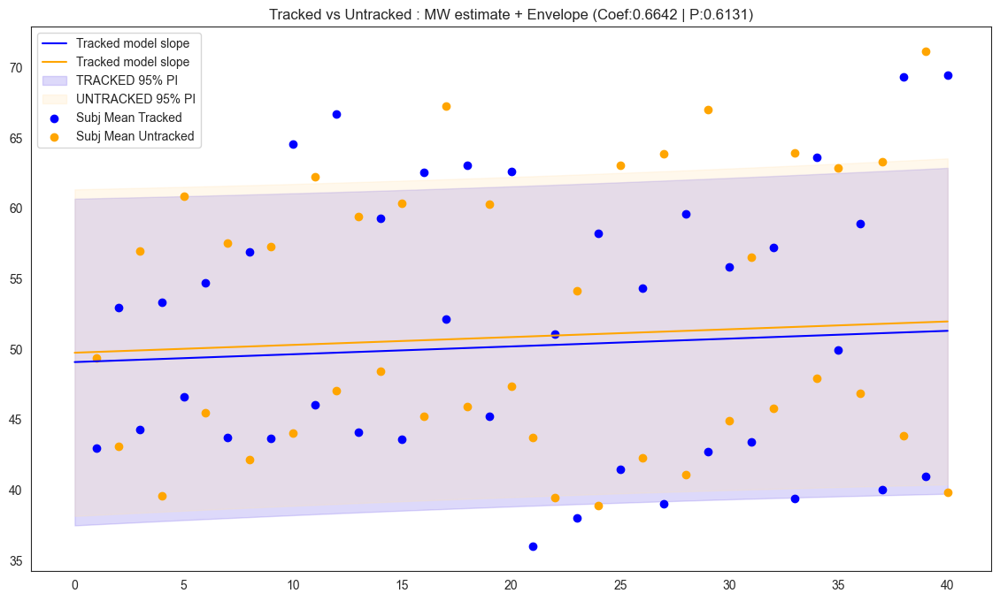

In [ ]:
import statsmodels.formula.api as smf




m = smf.mixedlm("GazeDifference ~ Tracking", data=grand_df[['MW_Estimate','DS','Tracking','trialNum','GazeDifference']],
                groups="DS",          # random intercept
                #re_formula="~Tracking",         # adds random slope

               ).fit()

log_file.write("(1.4.1) Uncorrected Samples (GazeDifference ~ Tracking  +(1|Subjects)) \n")

log_file.write(f"      Tracking Effect        (Coef: {m.params[m.params.keys()[1]]:3.3f}| Z: {m.tvalues[m.params.keys()[1]]:3.3f}| P: {m.pvalues[m.params.keys()[1]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[1]][0]:3.3f} {m.conf_int().loc[m.params.keys()[1]][1]:3.3f})\n")
log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")


print(m.summary())   
coefs.append(m.params[m.params.keys()[1]])
zvals.append(m.tvalues[m.params.keys()[1]])
pvals.append(m.pvalues[m.params.keys()[1]])
conf1.append(m.conf_int().loc[m.params.keys()[1]][0])
conf2.append(m.conf_int().loc[m.params.keys()[1]][1])

coefsT.append(m.params[m.params.keys()[2]])
zvalsT.append(m.tvalues[m.params.keys()[2]])
pvalsT.append(m.pvalues[m.params.keys()[2]])
conf1T.append(m.conf_int().loc[m.params.keys()[2]][0])
conf2T.append(m.conf_int().loc[m.params.keys()[2]][1])

indx.append("Gaze Difference ")
eye.append('')
analysis.append('Tracking')

fig, ax = plt.subplots(figsize=(14, 8))
plotTrialTrack(m,'GazeDifference',grand_df,ax,titl=f"Tracked vs Untracked : MW estimate + Envelope (Coef:{ m.params[m.params.keys()[1]]:1.4f} | P:{ m.pvalues[m.params.keys()[1]]:1.4f})" ,paramNum = [0,1,2])
plt.savefig(os.path.join(statPath,f"GazeDiff_TrVsUntr_Unc_{est}_{exclusionName}.png"))



Intercept                5.147897
Tracking[T.UNTRACKED]    1.000092
trialNum                 1.000092
dtype: float64


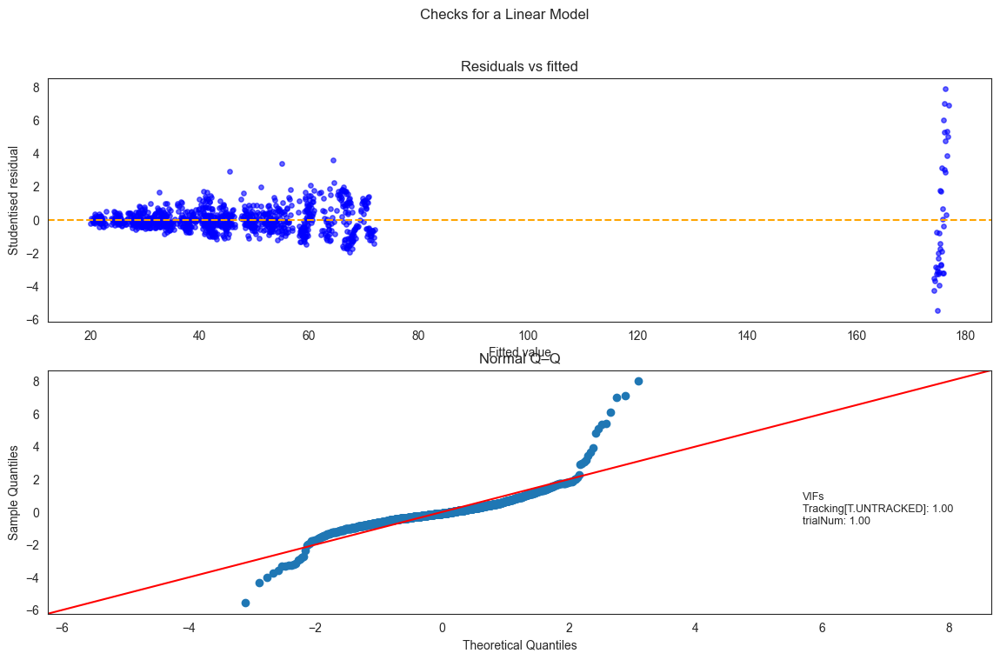

In [ ]:
from analysisFunctions import linearModelChecks
### Checks the assumptioons of a linear model 
linearModelChecks(m,grand_df)
plt.savefig(os.path.join(statPath,f"GazeDiff_TrVsUntr_Unc_Check_{est}_{exclusionName}.png"))

             Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   MW_Estimate
No. Observations:    1034      Method:               REML       
No. Groups:          26        Scale:                0.9648     
Min. group size:     35        Log-Likelihood:       -1462.2627 
Max. group size:     40        Converged:            Yes        
Mean group size:     39.8                                       
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept             -0.252    0.081 -3.117 0.002 -0.411 -0.094
Tracking[T.UNTRACKED]  0.211    0.061  3.459 0.001  0.092  0.331
GazeDifference         0.000    0.001  0.583 0.560 -0.001  0.002
trialNum               0.006    0.003  2.260 0.024  0.001  0.011
DS Var                 0.000                                    



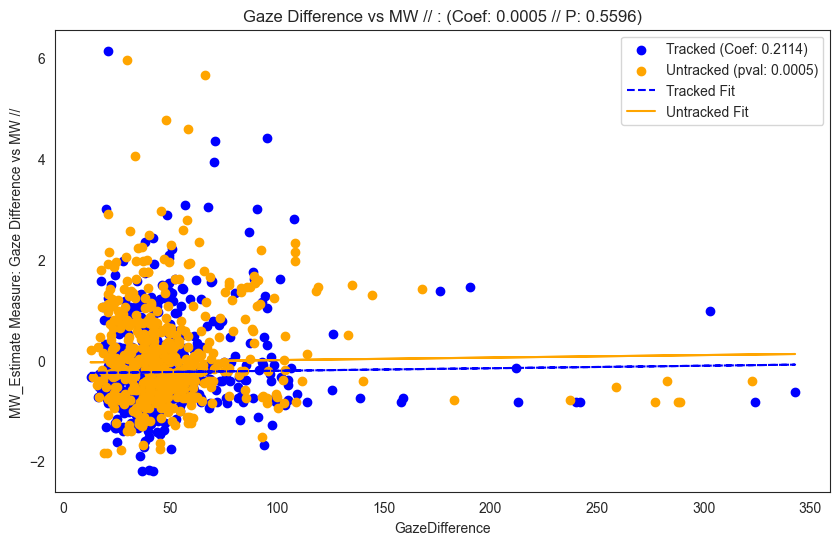

In [ ]:
# Combine single-level and multi-level columns
subset = pd.concat([
    grand_df[('MW_Estimate', '', '')].rename('MW_Estimate'),

    grand_df[('Tracking', '', '')].rename('Tracking'),
    grand_df[('DS', '', '')].rename('DS'),
    grand_df[('trialNum', '', '')].rename('trialNum'),
    grand_df[('Checks', '', 'gazeDiff')].rename('gazeDiff')
], axis=1)



import statsmodels.formula.api as smf

m = smf.mixedlm(" GazeDifference~ MW_Estimate ", data=grand_df[['MW_Estimate','DS','Tracking','trialNum','GazeDifference']],
                groups="DS",          # random intercept
                #re_formula="~Tracking",         # adds random slope

               ).fit()

log_file.write("(1.4.2) Uncorrected Samples (MW_Estimate ~ GazeDifference+Tracking +TrialNum +(1|Subjects)) \n")

# log_file.write(f"      GazeDiff Effect        (Coef: {m.params[m.params.keys()[2]]:3.3f}| Z: {m.tvalues[m.params.keys()[2]]:3.3f}| P: {m.pvalues[m.params.keys()[2]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[2]][0]:3.3f} {m.conf_int().loc[m.params.keys()[2]][1]:3.3f})\n")
# log_file.write(f"      Trial Number Effect    (Coef: {m.params[m.params.keys()[3]]:3.3f}| Z: {m.tvalues[m.params.keys()[3]]:3.3f}| P: {m.pvalues[m.params.keys()[3]]:3.3f} | Conf: {m.conf_int().loc[m.params.keys()[3]][0]:3.3f} {m.conf_int().loc[m.params.keys()[3]][1]:3.3f})\n")




print(m.summary())   
# coefs.append(m.params[m.params.keys()[2]])
# zvals.append(m.tvalues[m.params.keys()[2]])
# pvals.append(m.pvalues[m.params.keys()[2]])
# conf1.append(m.conf_int().loc[m.params.keys()[2]][0])
# conf2.append(m.conf_int().loc[m.params.keys()[2]][1])

# coefsT.append(m.params[m.params.keys()[3]])
# zvalsT.append(m.tvalues[m.params.keys()[3]])
# pvalsT.append(m.pvalues[m.params.keys()[3]])
# conf1T.append(m.conf_int().loc[m.params.keys()[3]][0])
# conf2T.append(m.conf_int().loc[m.params.keys()[3]][1])

indx.append("Gaze Difference ")
eye.append('')
analysis.append('MW_estimate')

plot_pupil_vs_mw(m, grand_df[['MW_Estimate','DS','Tracking','trialNum','GazeDifference']], ["Gaze Difference vs MW",""], ax=None,meas='GazeDifference',meas1=1,meas2=2,target='MW_Estimate',tracking=False)
plt.savefig(os.path.join(statPath,f"MWvsGaze_Unc_{est}_{exclusionName}.png"))


Intercept                5.147897
Tracking[T.UNTRACKED]    1.000092
trialNum                 1.000092
dtype: float64


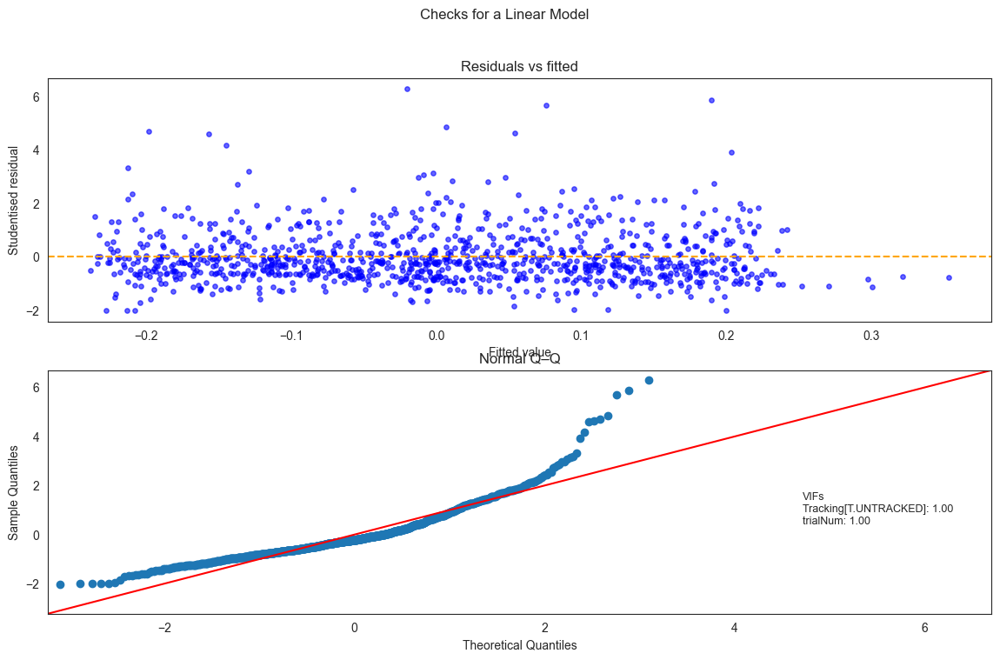

In [ ]:
from analysisFunctions import linearModelChecks
### Checks the assumptioons of a linear model 
linearModelChecks(m,grand_df)
plt.savefig(os.path.join(statPath,f"MWvsGaze_Unc_Check_{est}_{exclusionName}.png"))

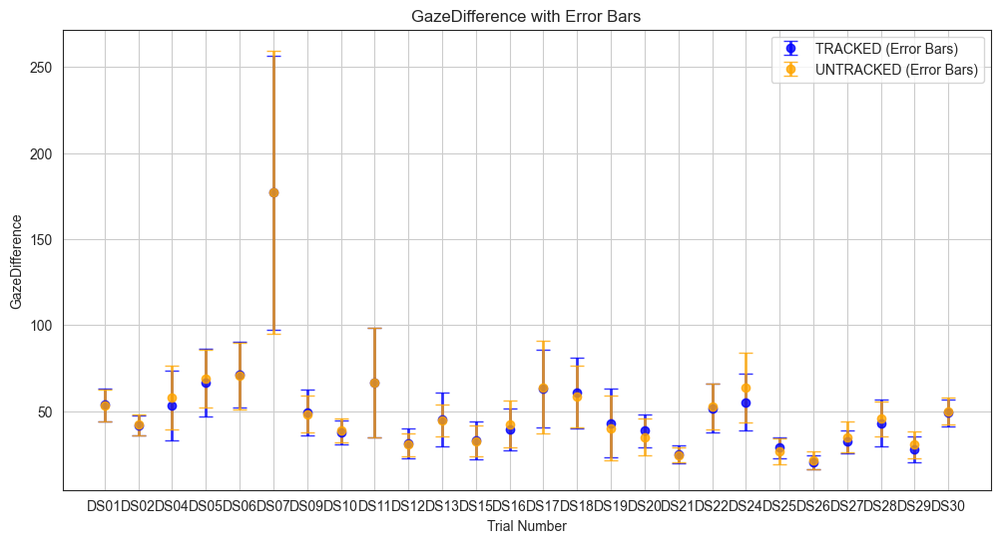

In [ ]:
mew = grand_df[grand_df['Tracking'] == 'TRACKED'][['DS','GazeDifference']].groupby(['DS'])
umew = grand_df[grand_df['Tracking'] == 'UNTRACKED'][['DS','GazeDifference']].groupby(['DS'])


plt.figure(figsize=(12, 6))

# Plot for TRACKED group
plt.errorbar(mew.mean().index, 
             mew.mean()['GazeDifference'].values, 
             yerr=mew.std()['GazeDifference'].values, 
             fmt='o', color='blue', label='TRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Plot for UNTRACKED group
plt.errorbar(umew.mean().index, 
             umew.mean()['GazeDifference'].values, 
             yerr=umew.std()['GazeDifference'].values, 
             fmt='o', color='orange', label='UNTRACKED (Error Bars)', alpha=0.8, 
             capsize=5, elinewidth=2)  # Adjust capsize and line width

# Add labels, legend, and title
plt.xlabel('Trial Number')
plt.ylabel('GazeDifference')
plt.title('GazeDifference with Error Bars')
plt.legend()
plt.grid(True)

# Show the plot
plt.savefig(os.path.join(statPath,f"GazeDiffacrossSubj__{est}_{exclusionName}.png"))

In [ ]:
len(analysis)

86